In [1]:
from STIS_pipeline_functions import *
sns.set_context("talk")

/Users/natalieallen/opt/anaconda3/lib/python3.8/site-packages/autograd/numpy/numpy_wrapper.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  int_types = {_np.int, _np.int8, _np.int16, _np.int32, _np.int64, _np.integer}


In [2]:
# read in data and calibration files - the test directory I have has 
# two different instruments so I just quickly sort those
data_files_430 = sorted(glob.glob("wasp-39/HST/G430L/*/*flt.fits"))
data_files_750 = sorted(glob.glob("wasp-39/HST/G750L/*/*flt.fits"))

In [3]:
# get the data from the files - since I use default settings, it reads out: data, header, jitter, dqs, errors
# currently I remove the last few files from the 750 data because they're flat frames rather than science data
# didn't realize this was a possibility to be included - will update the function to exclude anything that isn't 
# "science" in the get_data function later
data_430 = get_data(data_files_430)
data_750 = get_data(data_files_750)

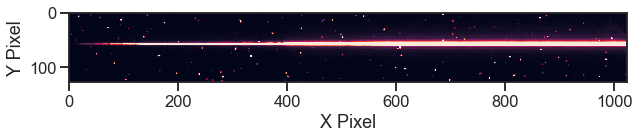

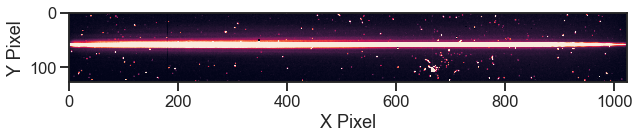

In [4]:
# check on one of the data frames (first part of data) - 430 first and then 750
plt.figure(figsize = (10,10))
im = plt.imshow(data_430[0][1])
im.set_clim(0,150)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,10))
im = plt.imshow(data_750[0][1])
im.set_clim(0,150)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

In [5]:
# initialize a list for and then create traces for each of the data frames
trace_list_430 = []
for i in data_430[0]:
    # trace wants xi, xf, and an initial y guess - these are numbers I just chose from some testing
    # it can be seen above this just corresponds to the strongest flux
    # this function is fast so you can test for yourself if these values don't work!
    trace = trace_spectrum(i, 100,1000,60)
    trace_list_430.append(trace)

trace_list_750 = []
for i in data_750[0]:
    # trace wants xi, xf, and an initial y guess - these are numbers I just chose from some testing
    # it can be seen above this just corresponds to the strongest flux
    # this function is fast so you can test for yourself if these values don't work!
    trace = trace_spectrum(i, 100,1000,60)
    trace_list_750.append(trace)

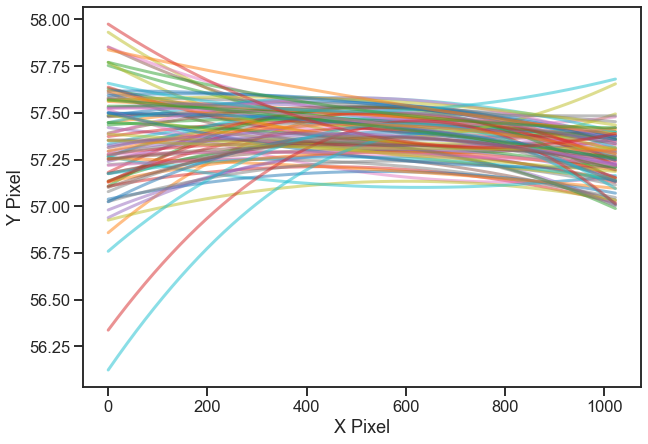

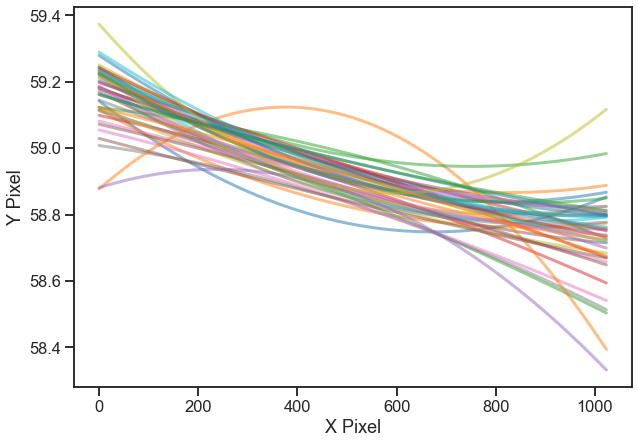

In [6]:
# fit a polynomial to the traces - I just use a second-order chebyshev
# and i fit it over the whole length of the data frame instead of just what was use for the fit
trace_fit_430 = []
plt.figure(figsize = (10,7))
for j in trace_list_430:
    coeffs1 = chebyshev.chebfit(j[0], j[1], deg=2)
    # plotting just to check everything looks okay
    plt.plot(np.arange(len(data_430[0][0][0])),chebyshev.chebval(np.arange(len(data_430[0][0][0])),coeffs1),lw=3, alpha = 0.5)
    trace = [np.arange(len(data_430[0][0][0])),chebyshev.chebval(np.arange(len(data_430[0][0][0])),coeffs1)]
    trace_fit_430.append(trace)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

# fit a polynomial to the traces - I just use a second-order chebyshev
# and i fit it over the whole length of the data frame instead of just what was use for the fit
trace_fit_750 = []
plt.figure(figsize = (10,7))
for j in trace_list_750:
    coeffs1 = chebyshev.chebfit(j[0], j[1], deg=2)
    # plotting just to check everything looks okay
    plt.plot(np.arange(len(data_750[0][0][0])),chebyshev.chebval(np.arange(len(data_750[0][0][0])),coeffs1),lw=3, alpha = 0.5)
    trace = [np.arange(len(data_750[0][0][0])),chebyshev.chebval(np.arange(len(data_750[0][0][0])),coeffs1)]
    trace_fit_750.append(trace)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

# there's maybe some outliers here, but this is just an initial trace to feed into the cleaning function
# so we don't worry about it - should subside once the cosmic rays are cleaned

In [7]:
data_430[5]

[0, 7, 0, 9, 0, 9, 0, 9, 0, 9, 0, 7, 0, 9, 0, 9, 0, 9, 0, 9]

In [8]:
# now to clean the data - default is all steps on (dq, difference_correct, hc_correct, spline_correct)
# i'm breaking up the orbits manually here, not sure what the best way to do this automatically is yet
# the spline function is a little broken at the moment, but if we use optimal extraction it doesn't matter 
# if we don't use it, so we turn it off here
cleaned_1_430 = clean_data(data_430[0][:3], dqs = data_430[3][:3], traces = trace_fit_430[:3])
cleaned_2_430 = clean_data(data_430[0][3:7], dqs = data_430[3][3:7], traces = trace_fit_430[3:7])

cleaned_3_430 = clean_data(data_430[0][7:10], dqs = data_430[3][7:10], traces = trace_fit_430[7:10])
cleaned_4_430 = clean_data(data_430[0][10:13], dqs = data_430[3][10:13], traces = trace_fit_430[10:13])
cleaned_5_430 = clean_data(data_430[0][13:16], dqs = data_430[3][13:16], traces = trace_fit_430[13:16])

cleaned_6_430 = clean_data(data_430[0][16:19], dqs = data_430[3][16:19], traces = trace_fit_430[16:19])
cleaned_7_430 = clean_data(data_430[0][19:22], dqs = data_430[3][19:22], traces = trace_fit_430[19:22])
cleaned_8_430 = clean_data(data_430[0][22:25], dqs = data_430[3][22:25], traces = trace_fit_430[22:25])

cleaned_9_430 = clean_data(data_430[0][25:28], dqs = data_430[3][25:28], traces = trace_fit_430[25:28])
cleaned_10_430 = clean_data(data_430[0][28:31], dqs = data_430[3][28:31], traces = trace_fit_430[28:31])
cleaned_11_430 = clean_data(data_430[0][31:34], dqs = data_430[3][31:34], traces = trace_fit_430[31:34])

cleaned_12_430 = clean_data(data_430[0][34:37], dqs = data_430[3][34:37], traces = trace_fit_430[34:37])
cleaned_13_430 = clean_data(data_430[0][37:40], dqs = data_430[3][37:40], traces = trace_fit_430[37:40])
cleaned_14_430 = clean_data(data_430[0][40:43], dqs = data_430[3][40:43], traces = trace_fit_430[40:43])


Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting differenc

In [9]:
cleaned_21_430 = clean_data(data_430[0][43:46], dqs = data_430[3][43:46], traces = trace_fit_430[43:46])
cleaned_22_430 = clean_data(data_430[0][46:50], dqs = data_430[3][46:50], traces = trace_fit_430[46:50])

cleaned_23_430 = clean_data(data_430[0][50:53], dqs = data_430[3][50:53], traces = trace_fit_430[50:53])
cleaned_24_430 = clean_data(data_430[0][53:56], dqs = data_430[3][53:56], traces = trace_fit_430[53:56])
cleaned_25_430 = clean_data(data_430[0][56:59], dqs = data_430[3][56:59], traces = trace_fit_430[56:59])

cleaned_26_430 = clean_data(data_430[0][59:62], dqs = data_430[3][59:62], traces = trace_fit_430[59:62])
cleaned_27_430 = clean_data(data_430[0][62:65], dqs = data_430[3][62:65], traces = trace_fit_430[62:65])
cleaned_28_430 = clean_data(data_430[0][65:68], dqs = data_430[3][65:68], traces = trace_fit_430[65:68])

cleaned_29_430 = clean_data(data_430[0][68:71], dqs = data_430[3][68:71], traces = trace_fit_430[68:71])
cleaned_210_430 = clean_data(data_430[0][71:74], dqs = data_430[3][71:74], traces = trace_fit_430[71:74])
cleaned_211_430 = clean_data(data_430[0][74:77], dqs = data_430[3][74:77], traces = trace_fit_430[74:77])

cleaned_212_430 = clean_data(data_430[0][77:80], dqs = data_430[3][77:80], traces = trace_fit_430[77:80])
cleaned_213_430 = clean_data(data_430[0][80:83], dqs = data_430[3][80:83], traces = trace_fit_430[80:83])
cleaned_214_430 = clean_data(data_430[0][83:86], dqs = data_430[3][83:86], traces = trace_fit_430[83:86])


Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting differenc

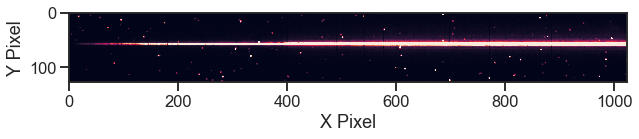

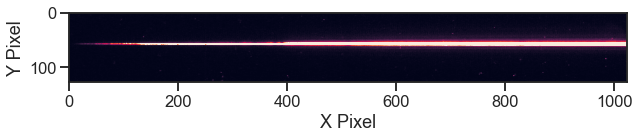

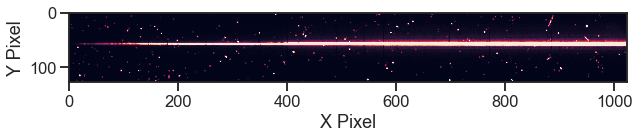

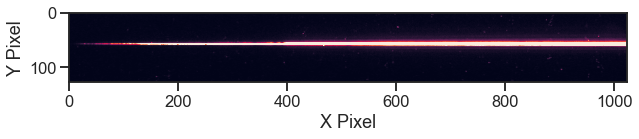

In [10]:
# comparison between the original and the cleaned image
# can easily see the lack of cosmic rays/bad pixels and removal of bad columns
plt.figure(figsize = (10,10))
im = plt.imshow(data_430[0][1])
im.set_clim(0,200)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()
plt.figure(figsize = (10,10))
cim = plt.imshow(cleaned_1_430[1])
cim.set_clim(0,200)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,10))
im = plt.imshow(data_430[0][-1])
im.set_clim(0,200)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()
plt.figure(figsize = (10,10))
cim = plt.imshow(cleaned_214_430[-1])
cim.set_clim(0,200)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()


In [11]:
data_750[5]

[0, 7, 0, 9, 0, 9, 0, 9, 0, 9]

In [12]:
# now to clean the data - default is all steps on (dq, difference_correct, hc_correct, spline_correct)
# i'm breaking up the orbits manually here, not sure what the best way to do this automatically is yet
cleaned_1_750 = clean_data(data_750[0][:3], dqs = data_750[3][:3], traces = trace_fit_750[:3])
cleaned_2_750 = clean_data(data_750[0][3:7], dqs = data_750[3][3:7], traces = trace_fit_750[3:7])

cleaned_3_750 = clean_data(data_750[0][7:10], dqs = data_750[3][7:10], traces = trace_fit_750[7:10])
cleaned_4_750 = clean_data(data_750[0][10:13], dqs = data_750[3][10:13], traces = trace_fit_750[10:13])
cleaned_5_750 = clean_data(data_750[0][13:16], dqs = data_750[3][13:16], traces = trace_fit_750[13:16])

cleaned_6_750 = clean_data(data_750[0][16:19], dqs = data_750[3][16:19], traces = trace_fit_750[16:19])
cleaned_7_750 = clean_data(data_750[0][19:22], dqs = data_750[3][19:22], traces = trace_fit_750[19:22])
cleaned_8_750 = clean_data(data_750[0][22:25], dqs = data_750[3][22:25], traces = trace_fit_750[22:25])

cleaned_9_750 = clean_data(data_750[0][25:28], dqs = data_750[3][25:28], traces = trace_fit_750[25:28])
cleaned_10_750 = clean_data(data_750[0][28:31], dqs = data_750[3][28:31], traces = trace_fit_750[28:31])
cleaned_11_750 = clean_data(data_750[0][31:34], dqs = data_750[3][31:34], traces = trace_fit_750[31:34])

cleaned_12_750 = clean_data(data_750[0][34:37], dqs = data_750[3][34:37], traces = trace_fit_750[34:37])
cleaned_13_750 = clean_data(data_750[0][37:40], dqs = data_750[3][37:40], traces = trace_fit_750[37:40])
cleaned_14_750 = clean_data(data_750[0][40:43], dqs = data_750[3][40:43], traces = trace_fit_750[40:43])

Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting difference_correct.
difference_correct complete.
Starting hc_correct.
hc_correct complete.
Starting spline_correct.
spline_correct complete.
Starting overwrite of marked pixels.
Done!
Starting dq_correct.
dq_correct complete.
Starting differenc

In [13]:
transit_750_cleaned = [*cleaned_1_750, *cleaned_2_750, *cleaned_3_750, *cleaned_4_750, *cleaned_5_750, *cleaned_6_750, *cleaned_7_750, *cleaned_8_750, *cleaned_9_750, *cleaned_10_750, *cleaned_11_750, *cleaned_12_750, *cleaned_13_750, *cleaned_14_750]
transit_430_cleaned = [*cleaned_1_430, *cleaned_2_430, *cleaned_3_430, *cleaned_4_430, *cleaned_5_430, *cleaned_6_430, *cleaned_7_430, *cleaned_8_430, *cleaned_9_430, *cleaned_10_430, *cleaned_11_430, *cleaned_12_430, *cleaned_13_430, *cleaned_14_430]
transit_430_2_cleaned = [*cleaned_21_430, *cleaned_22_430, *cleaned_23_430, *cleaned_24_430, *cleaned_25_430, *cleaned_26_430, *cleaned_27_430, *cleaned_28_430, *cleaned_29_430, *cleaned_210_430, *cleaned_211_430, *cleaned_212_430, *cleaned_213_430, *cleaned_214_430]

Frame 0


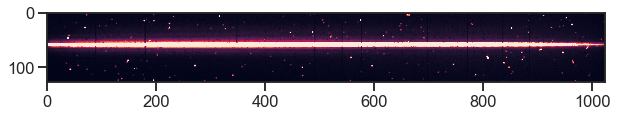

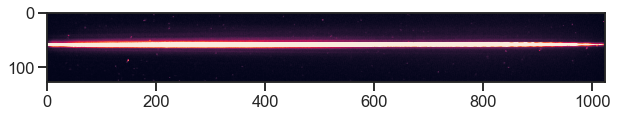

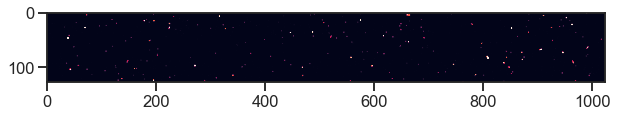

Frame 1


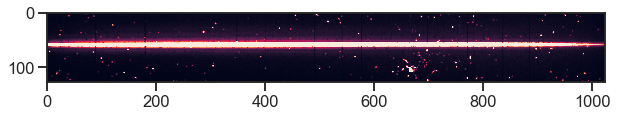

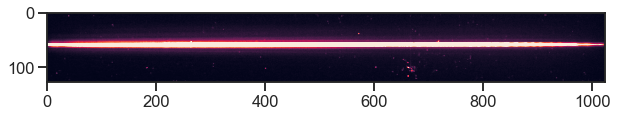

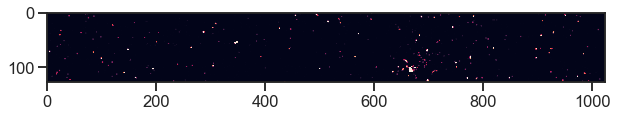

Frame 2


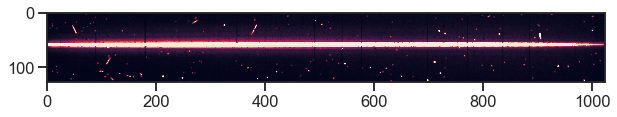

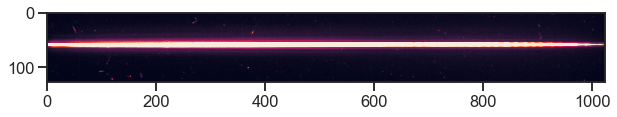

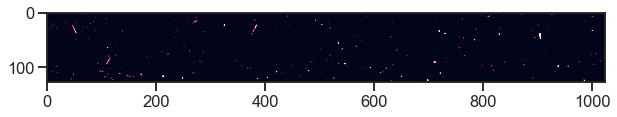

Frame 3


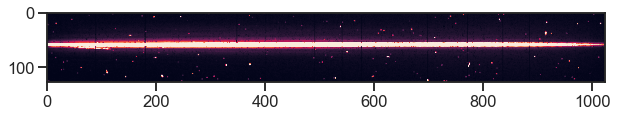

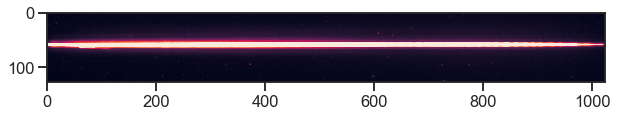

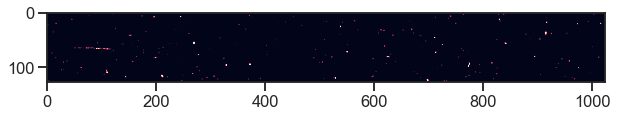

Frame 4


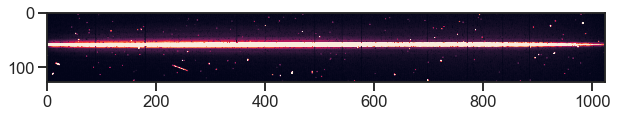

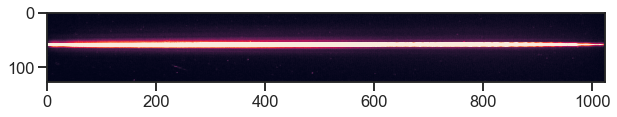

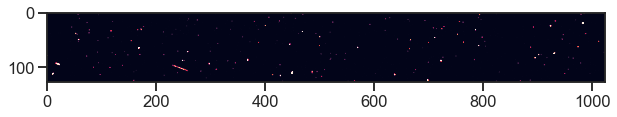

Frame 5


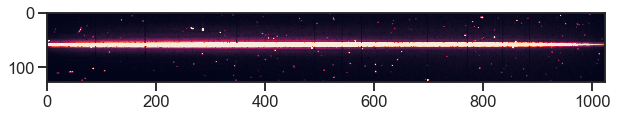

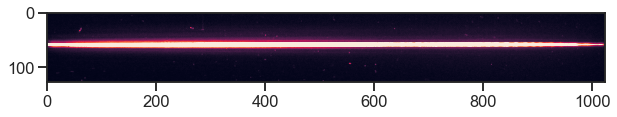

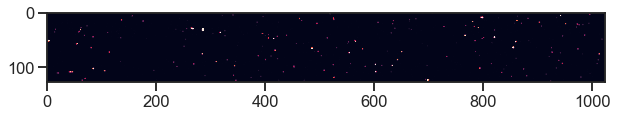

Frame 6


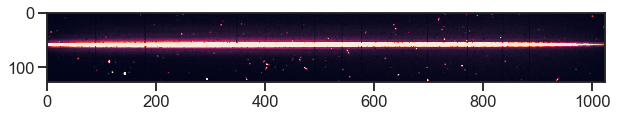

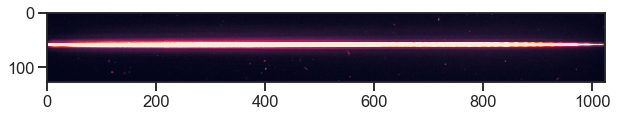

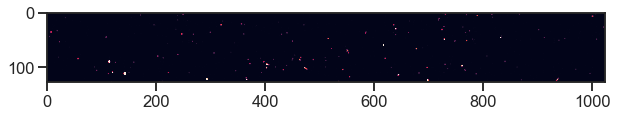

Frame 7


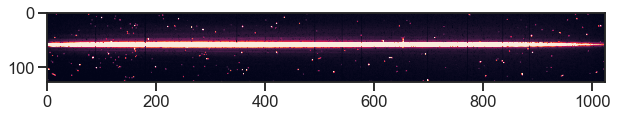

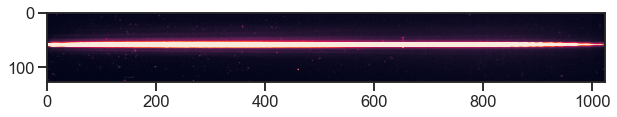

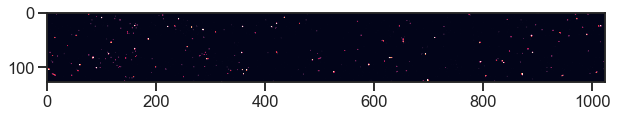

Frame 8


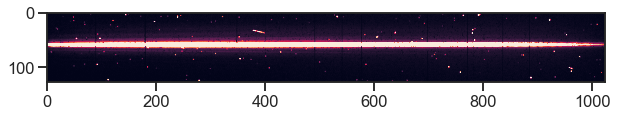

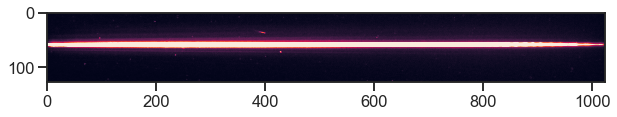

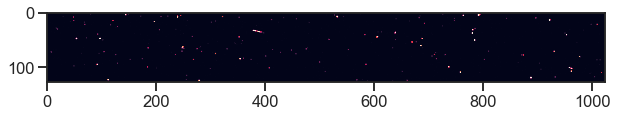

Frame 9


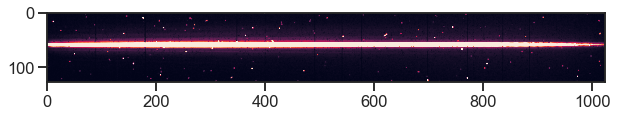

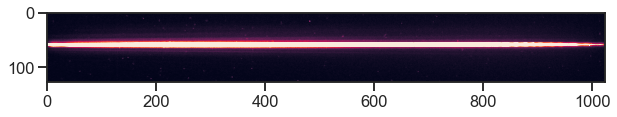

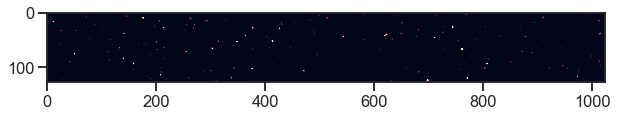

Frame 10


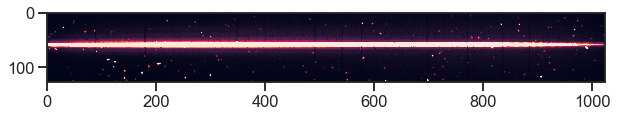

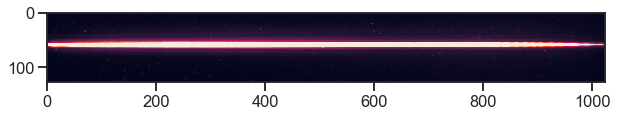

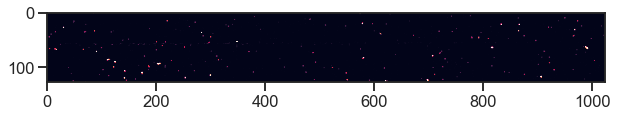

Frame 11


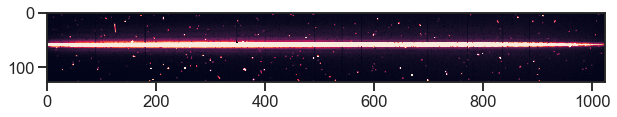

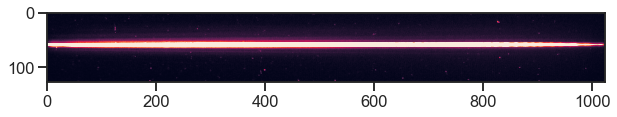

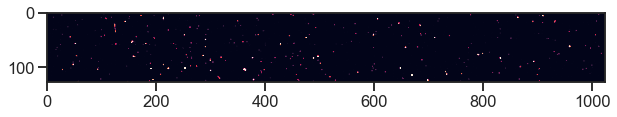

Frame 12


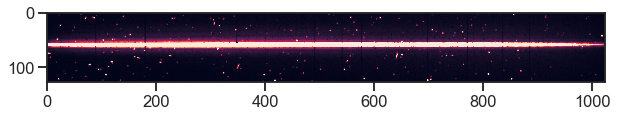

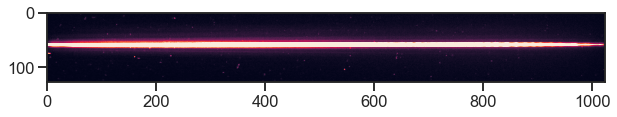

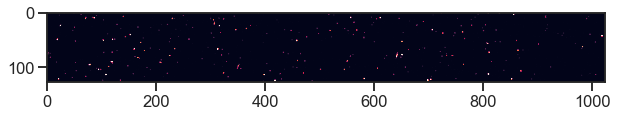

Frame 13


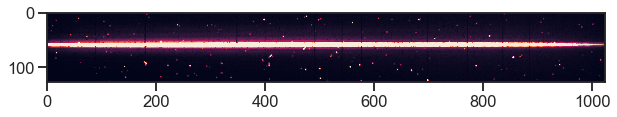

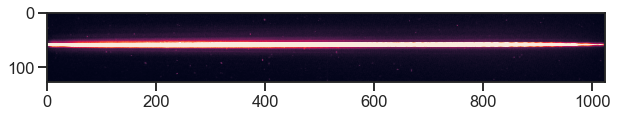

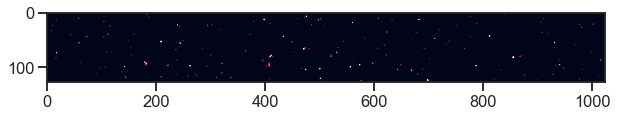

Frame 14


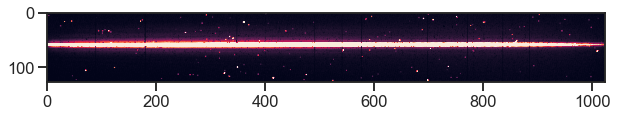

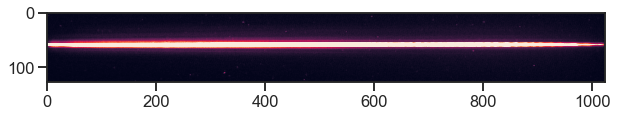

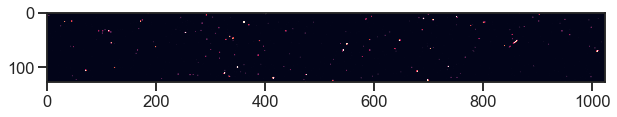

Frame 15


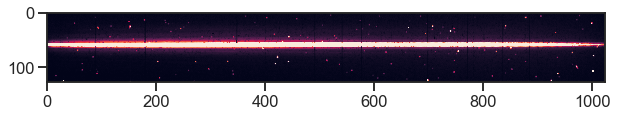

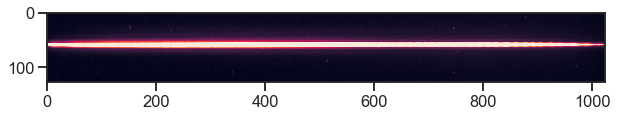

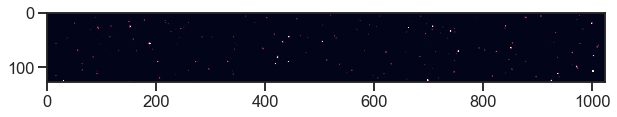

Frame 16


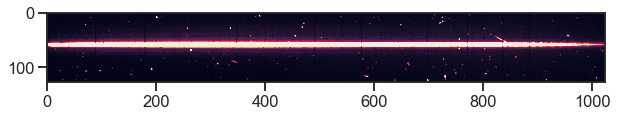

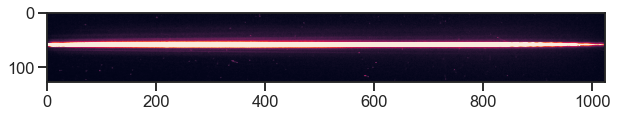

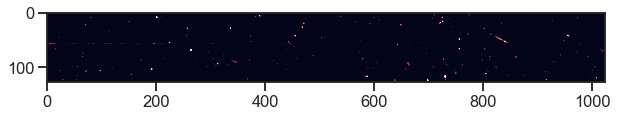

Frame 17


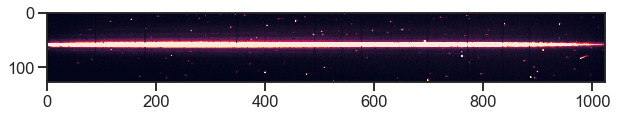

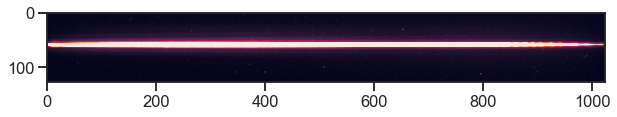

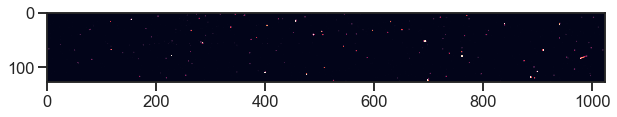

Frame 18


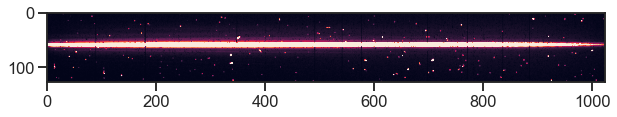

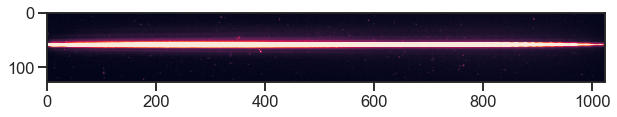

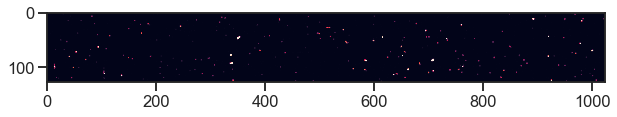

Frame 19


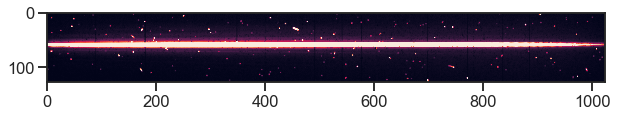

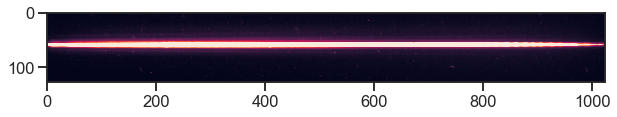

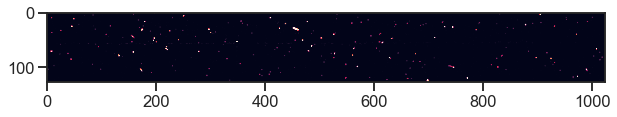

Frame 20


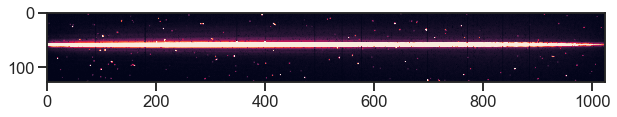

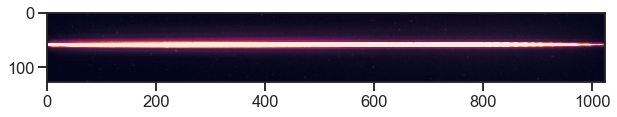

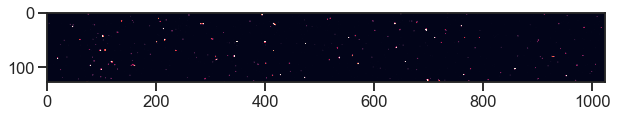

Frame 21


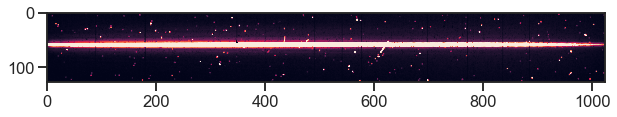

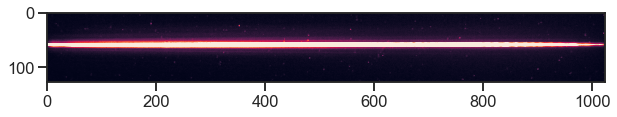

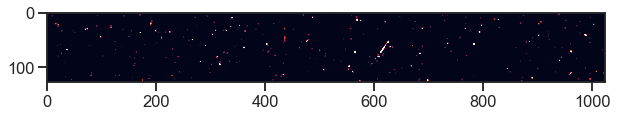

Frame 22


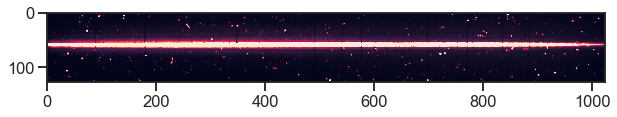

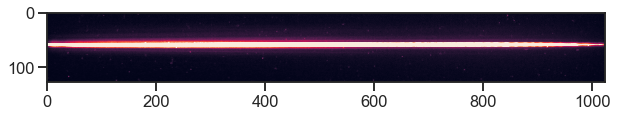

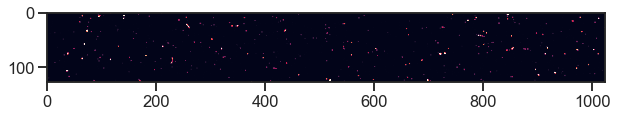

Frame 23


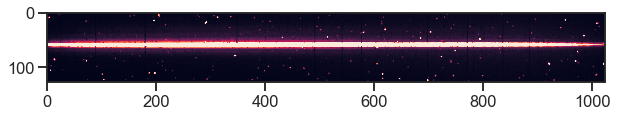

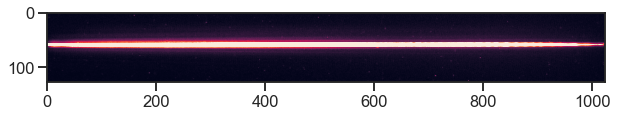

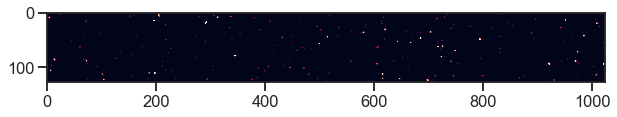

Frame 24


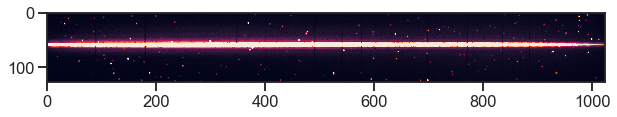

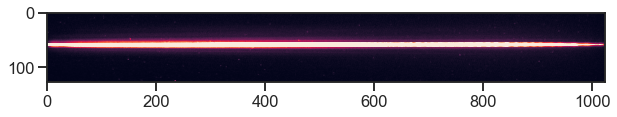

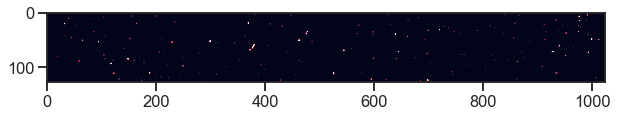

Frame 25


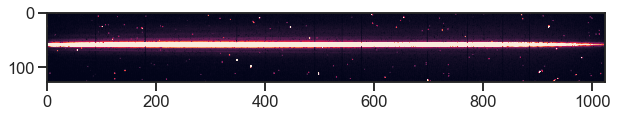

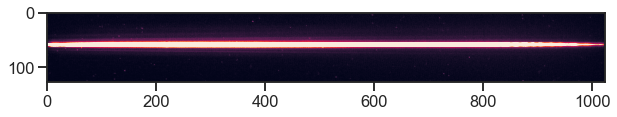

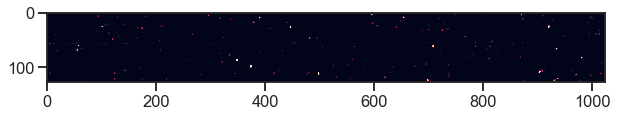

Frame 26


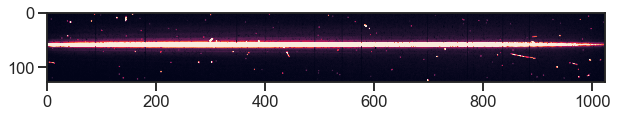

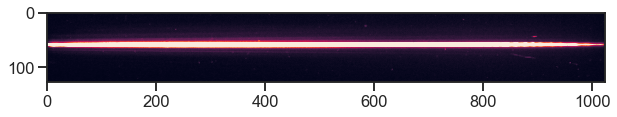

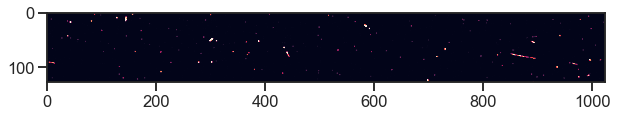

Frame 27


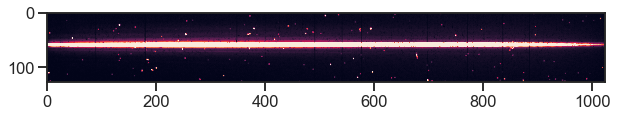

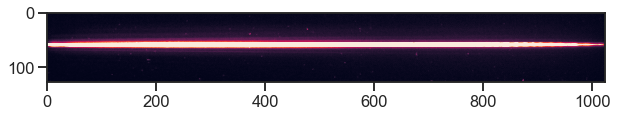

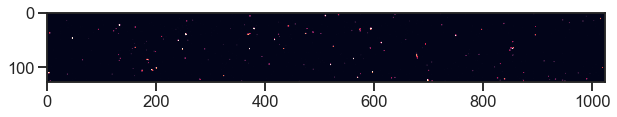

Frame 28


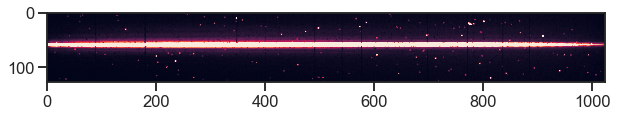

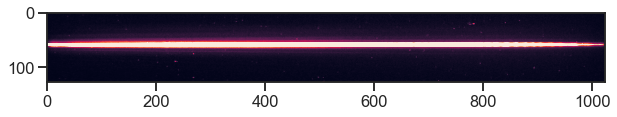

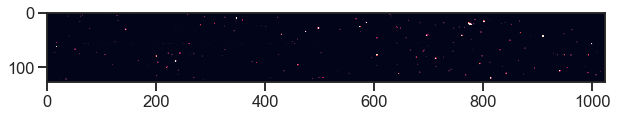

Frame 29


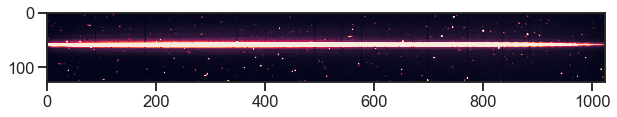

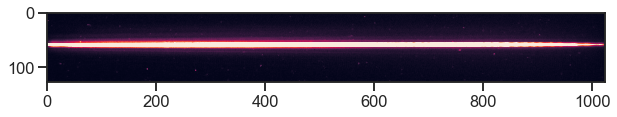

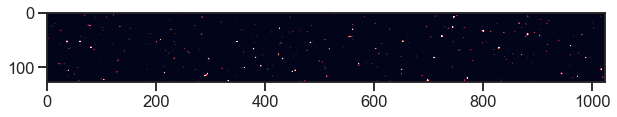

Frame 30


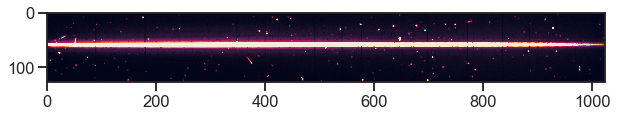

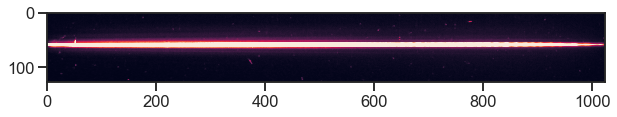

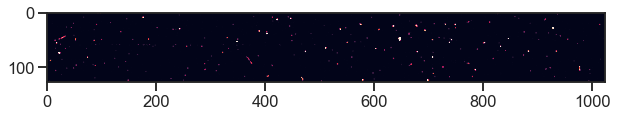

Frame 31


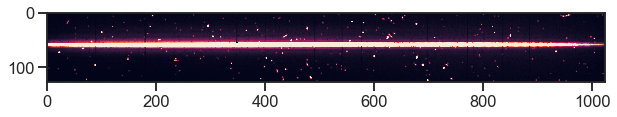

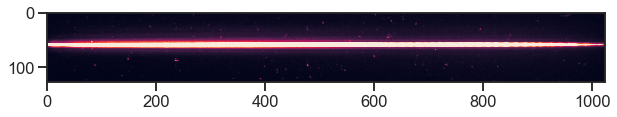

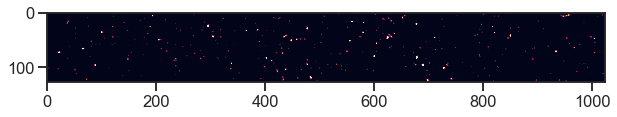

Frame 32


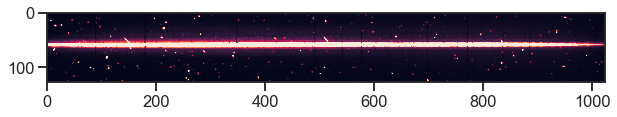

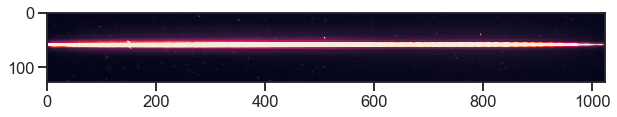

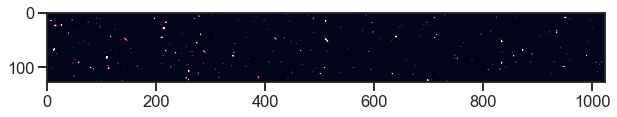

Frame 33


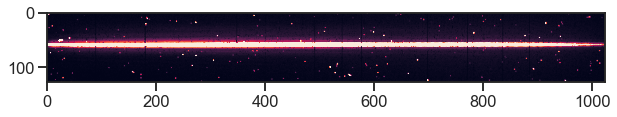

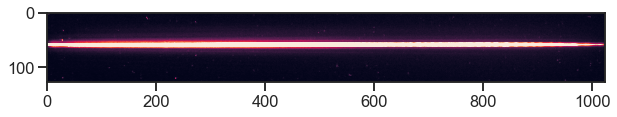

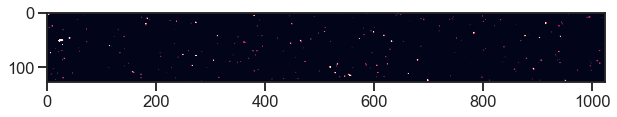

Frame 34


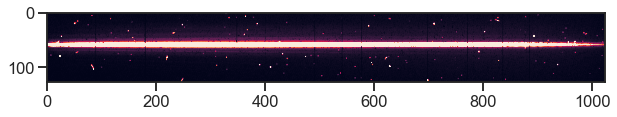

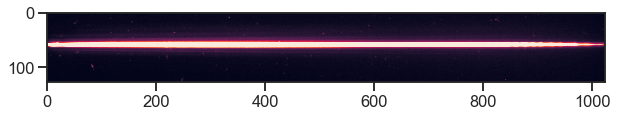

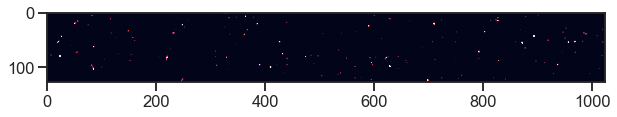

Frame 35


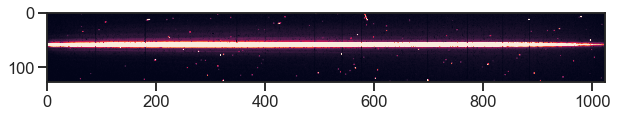

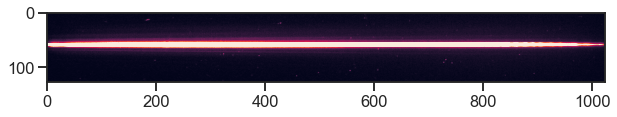

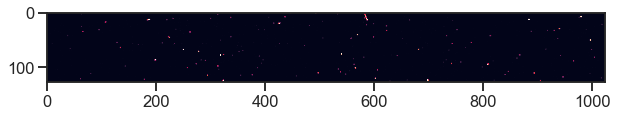

Frame 36


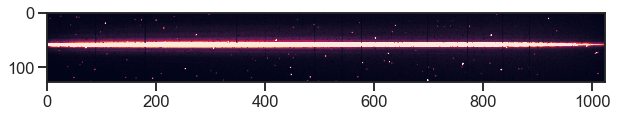

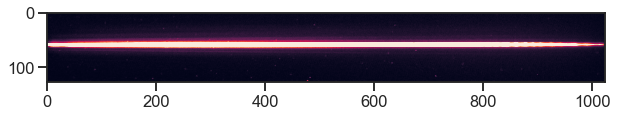

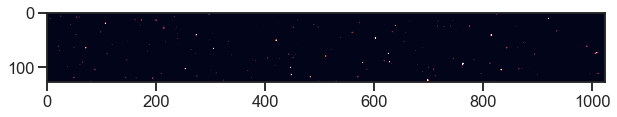

Frame 37


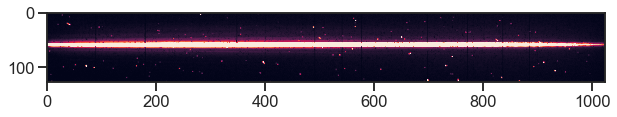

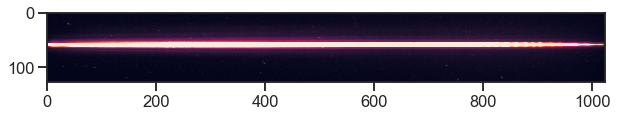

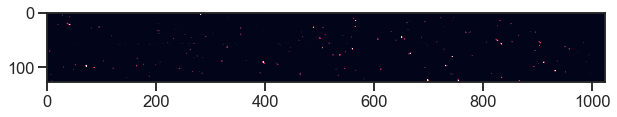

Frame 38


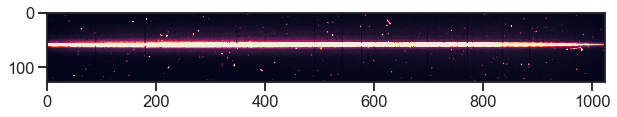

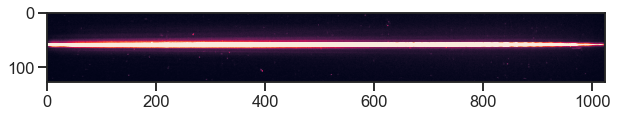

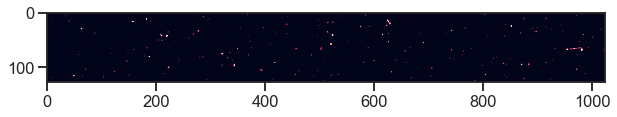

Frame 39


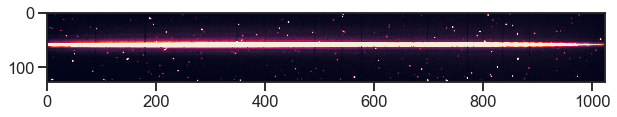

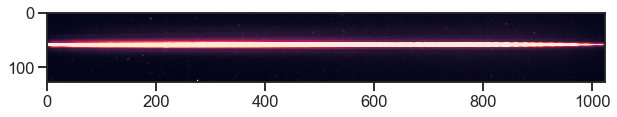

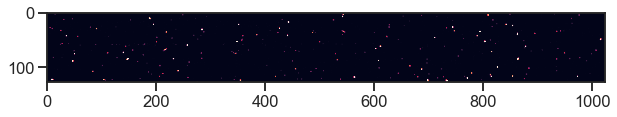

Frame 40


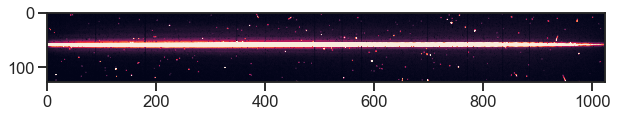

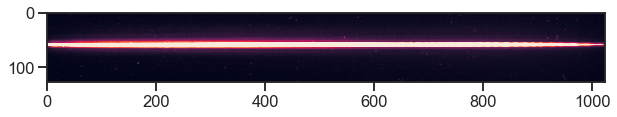

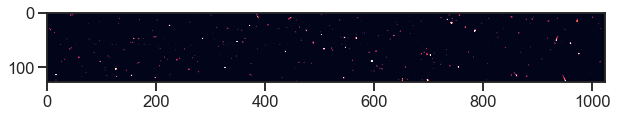

Frame 41


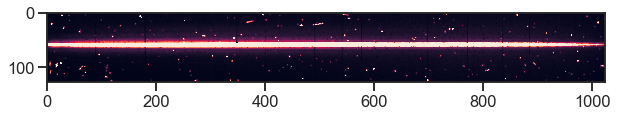

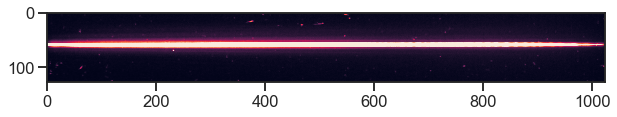

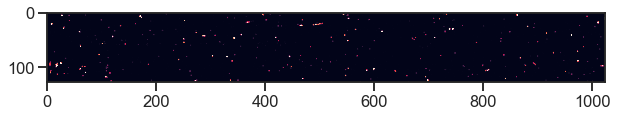

Frame 42


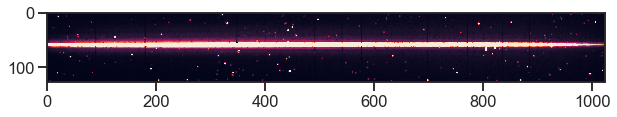

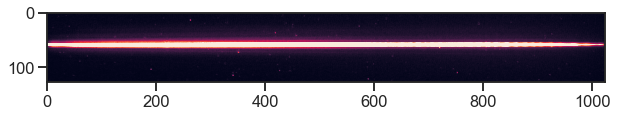

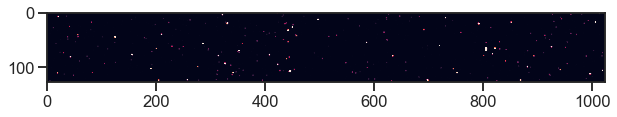

In [14]:
# let's look at the 750 data
for i in range(len(transit_750_cleaned)):
    print("Frame", i)
    plt.figure(figsize = (10,7))
    im = plt.imshow(data_750[0][i])
    im.set_clim(0,200)
    plt.show()
    
    plt.figure(figsize = (10,7))
    im = plt.imshow(transit_750_cleaned[i])
    im.set_clim(0,200)
    plt.show()
    
    plt.figure(figsize = (10,7))
    im = plt.imshow(data_750[0][i]-transit_750_cleaned[i])
    im.set_clim(0,200)
    plt.show()
        

Frame 0


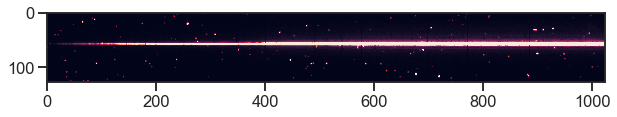

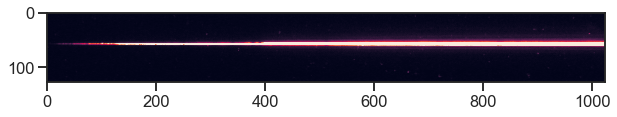

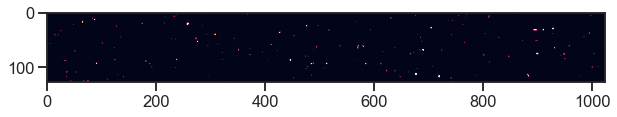

Frame 1


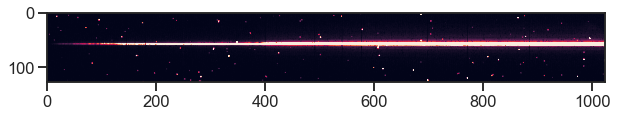

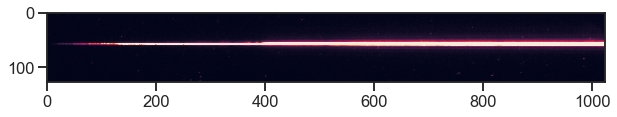

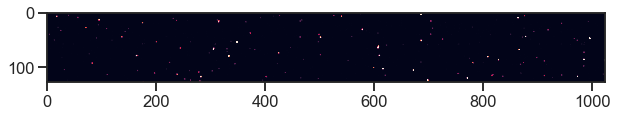

Frame 2


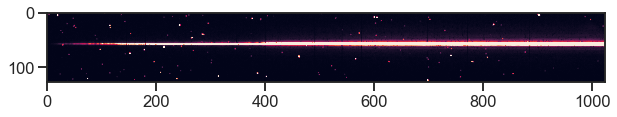

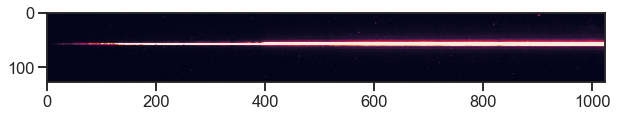

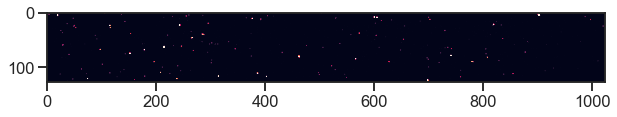

Frame 3


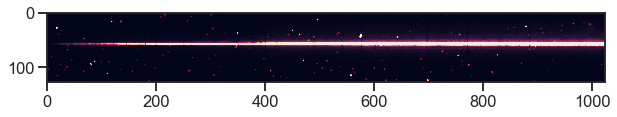

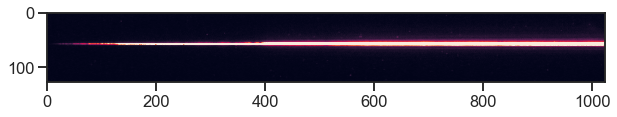

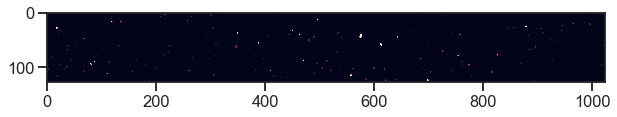

Frame 4


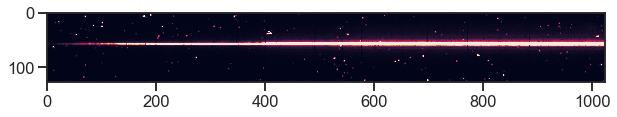

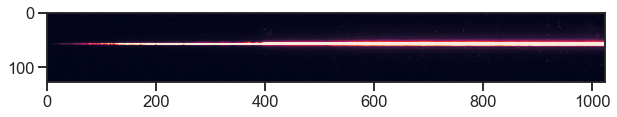

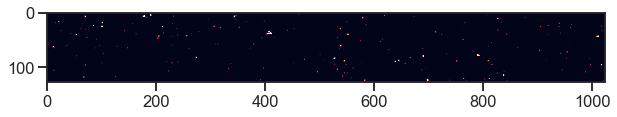

Frame 5


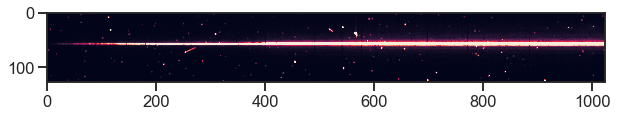

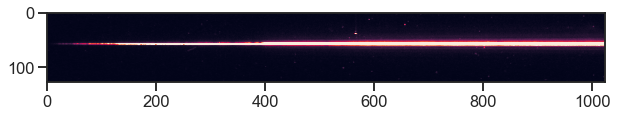

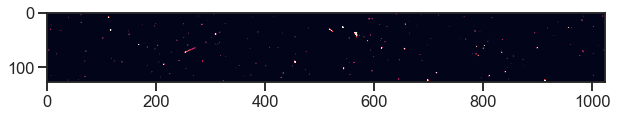

Frame 6


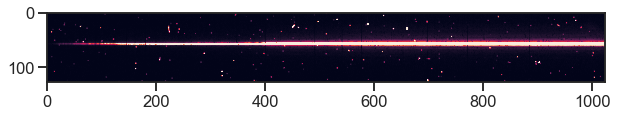

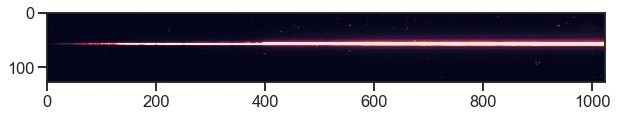

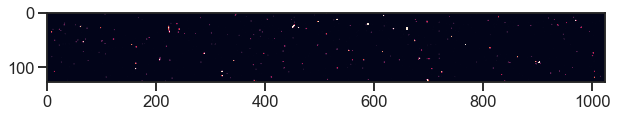

Frame 7


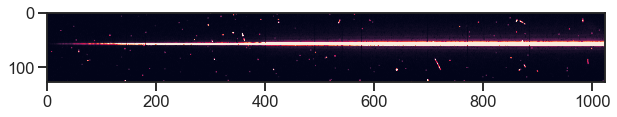

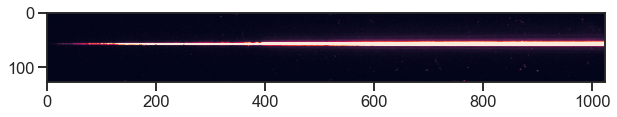

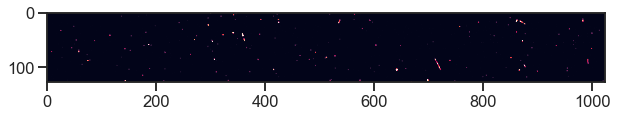

Frame 8


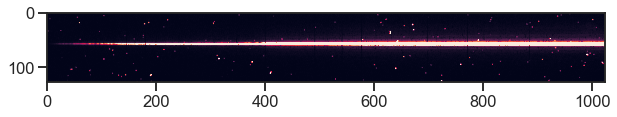

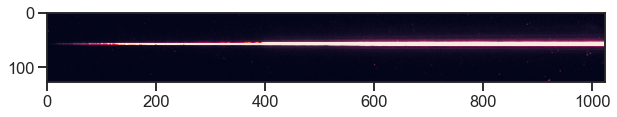

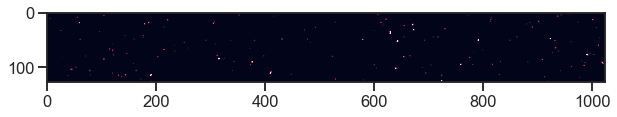

Frame 9


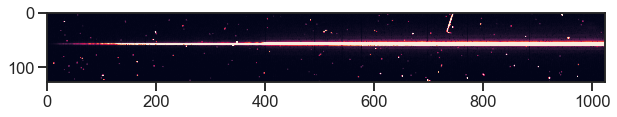

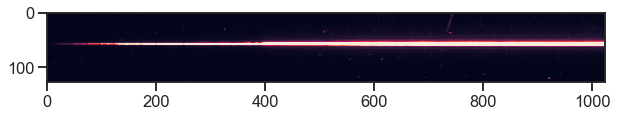

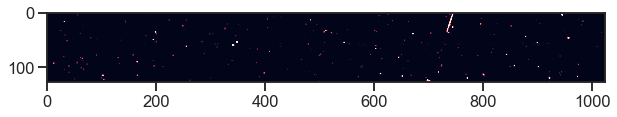

Frame 10


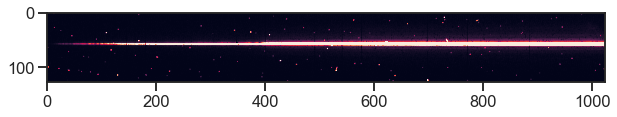

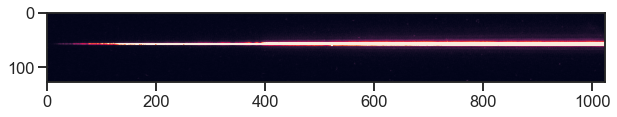

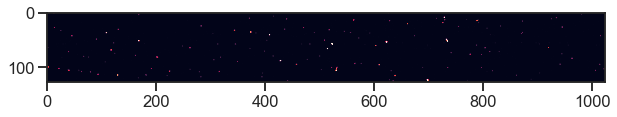

Frame 11


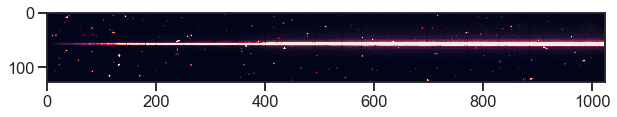

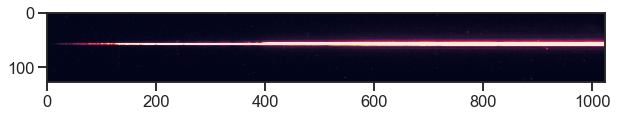

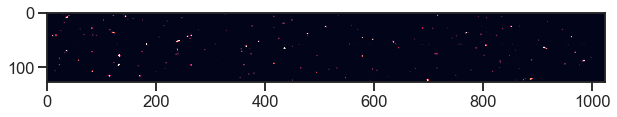

Frame 12


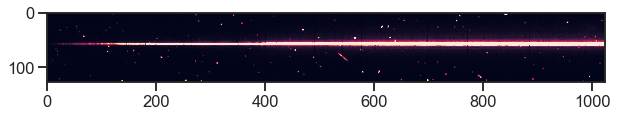

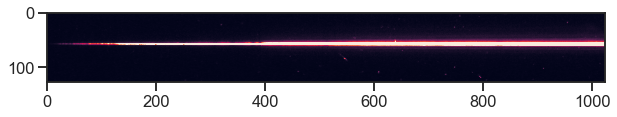

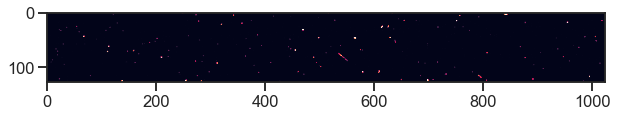

Frame 13


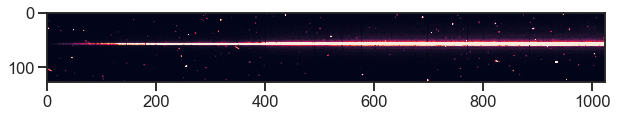

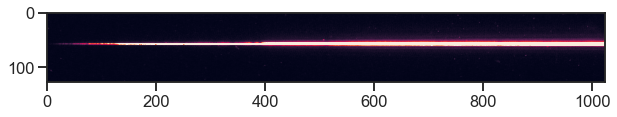

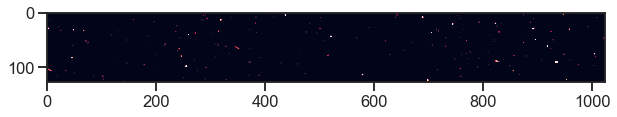

Frame 14


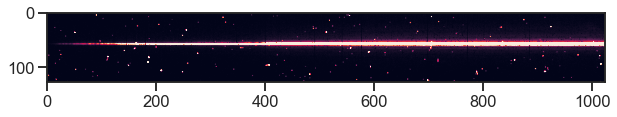

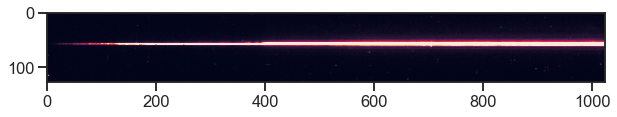

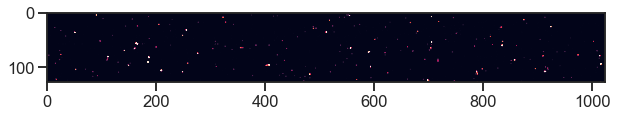

Frame 15


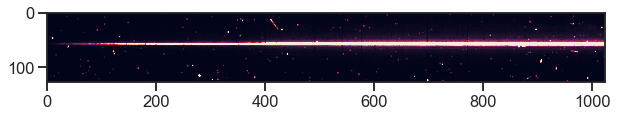

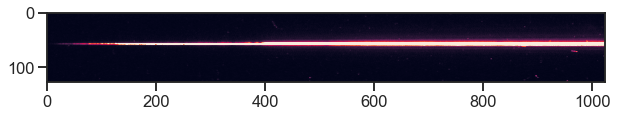

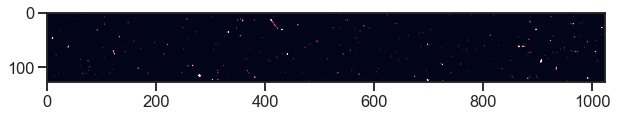

Frame 16


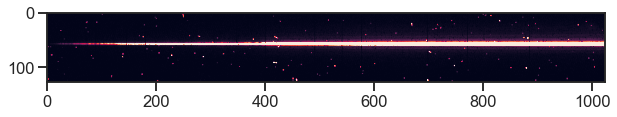

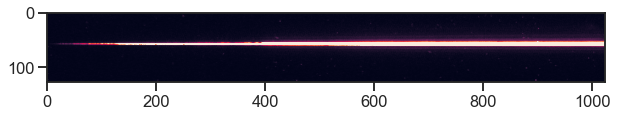

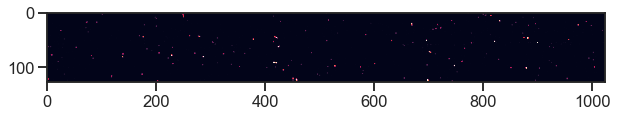

Frame 17


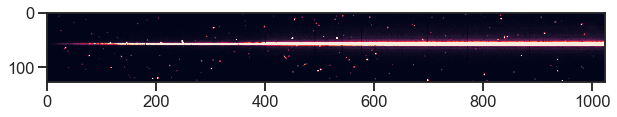

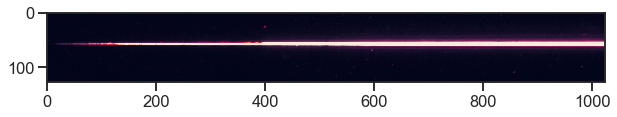

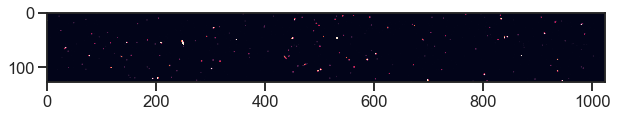

Frame 18


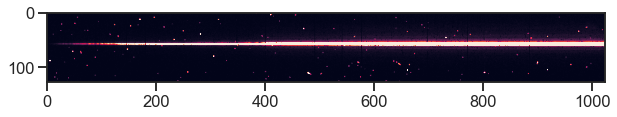

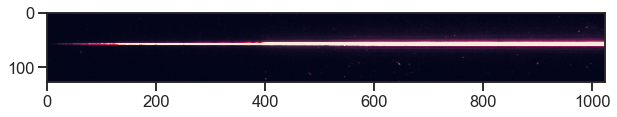

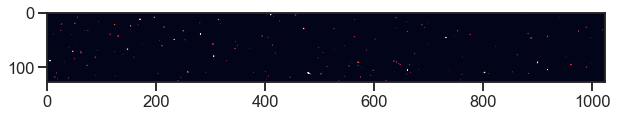

Frame 19


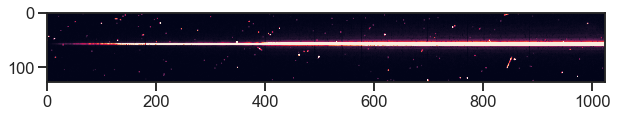

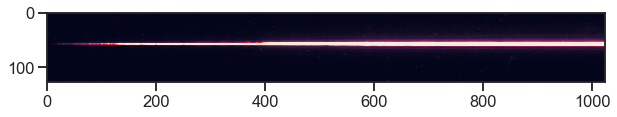

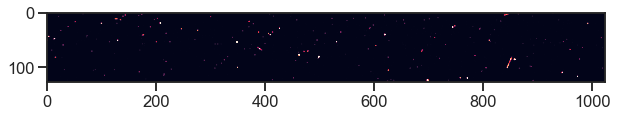

Frame 20


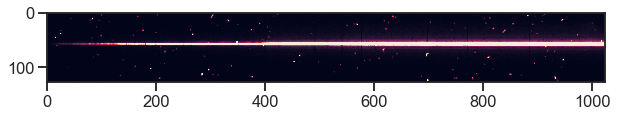

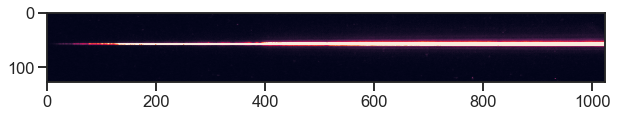

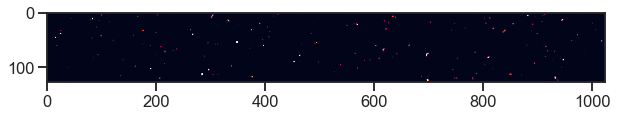

Frame 21


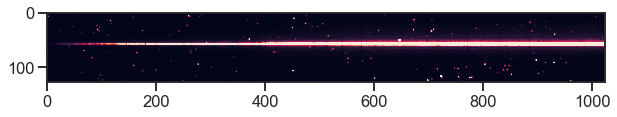

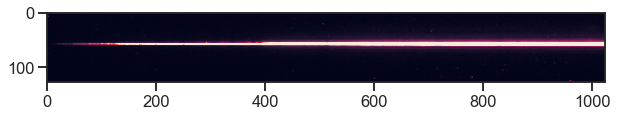

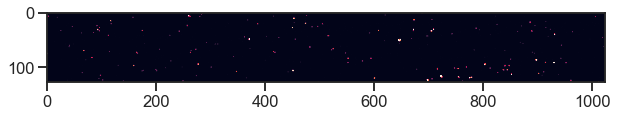

Frame 22


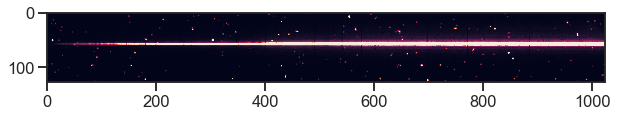

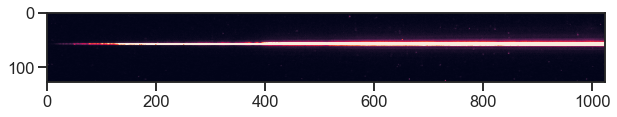

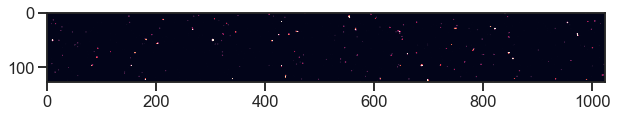

Frame 23


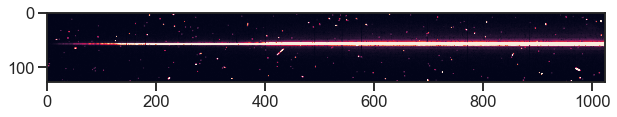

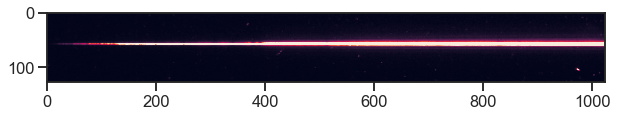

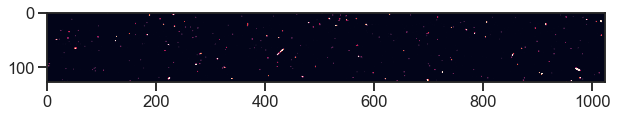

Frame 24


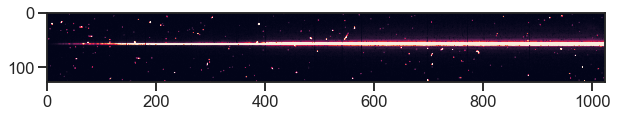

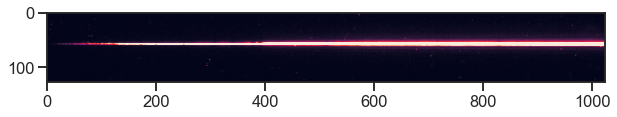

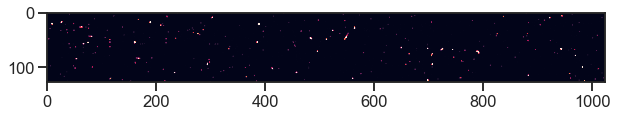

Frame 25


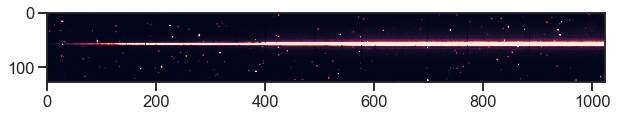

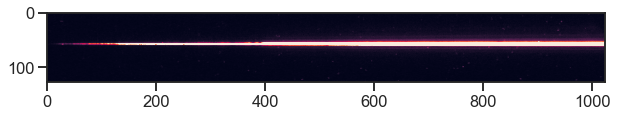

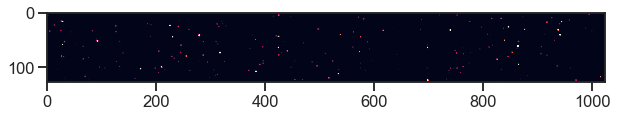

Frame 26


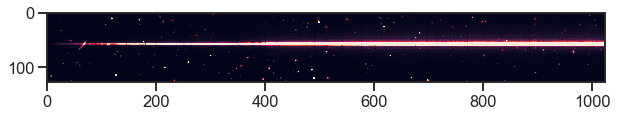

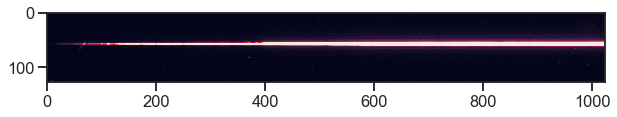

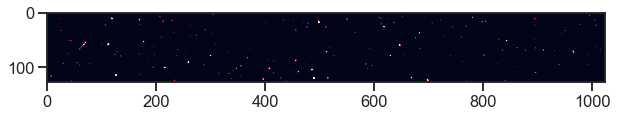

Frame 27


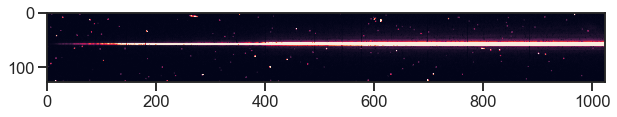

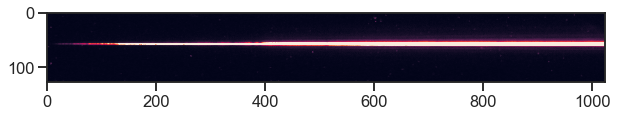

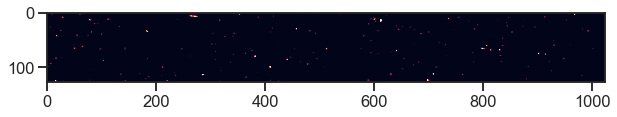

Frame 28


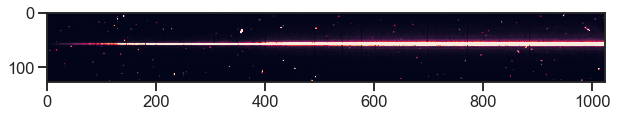

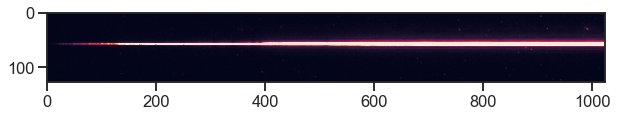

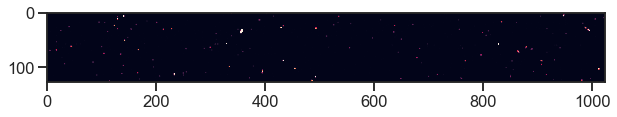

Frame 29


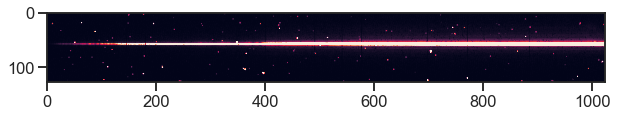

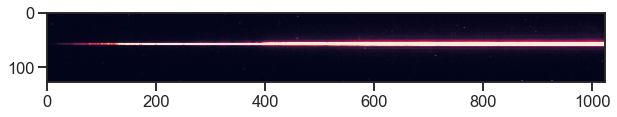

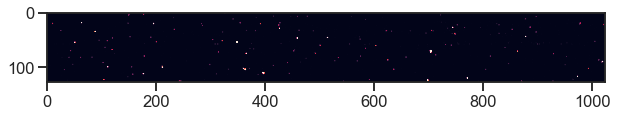

Frame 30


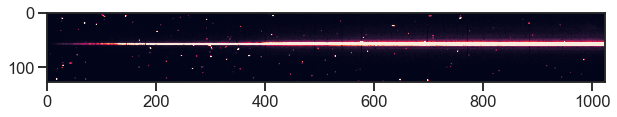

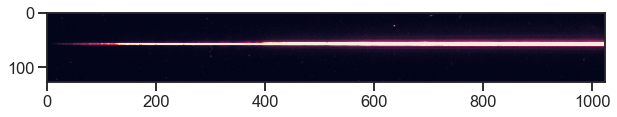

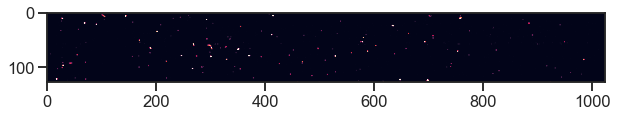

Frame 31


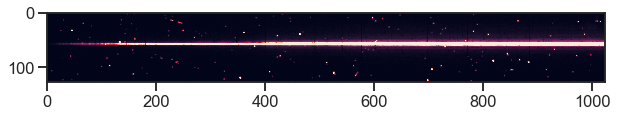

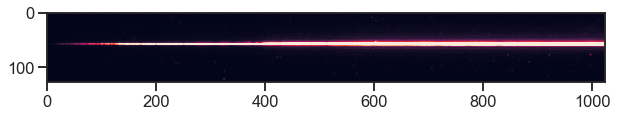

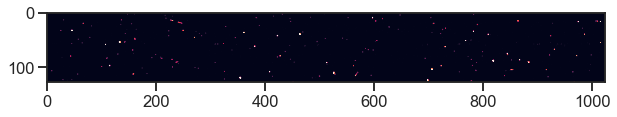

Frame 32


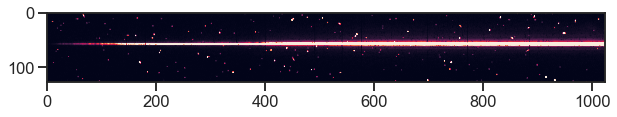

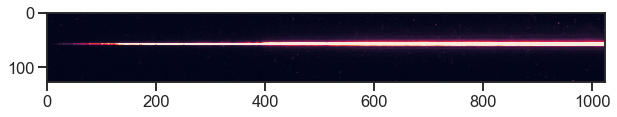

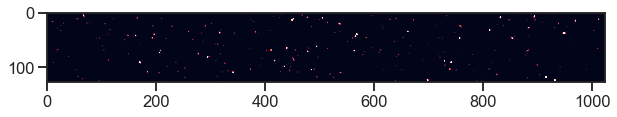

Frame 33


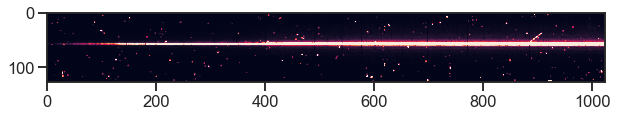

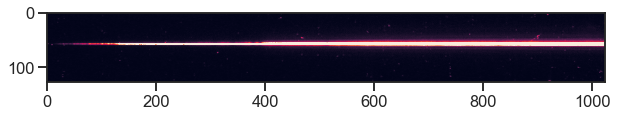

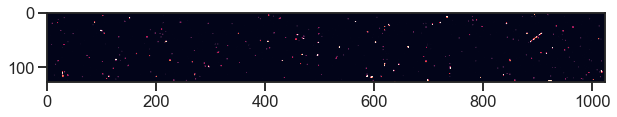

Frame 34


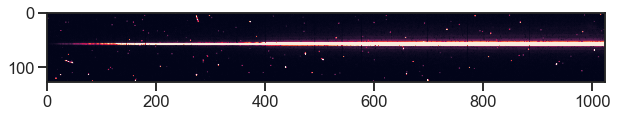

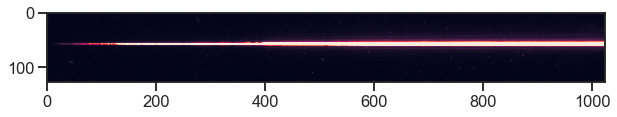

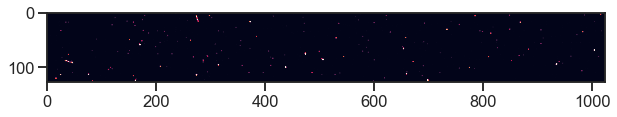

Frame 35


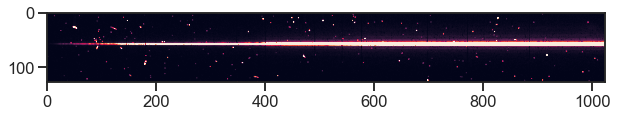

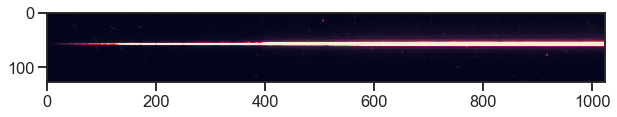

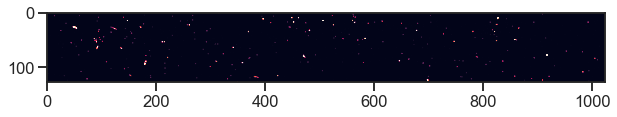

Frame 36


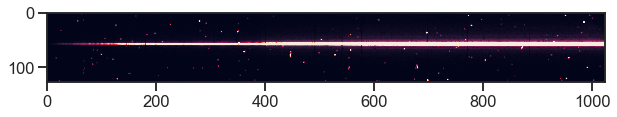

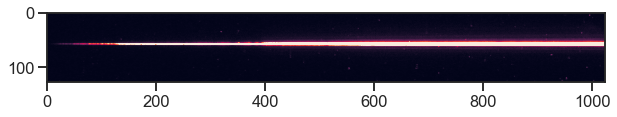

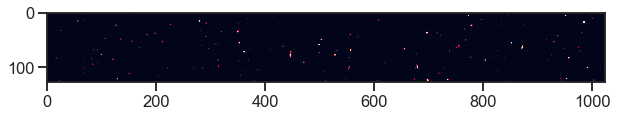

Frame 37


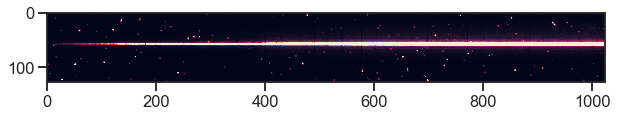

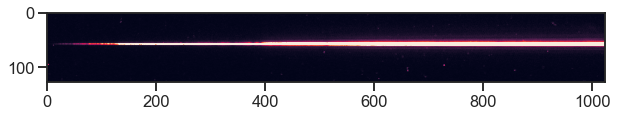

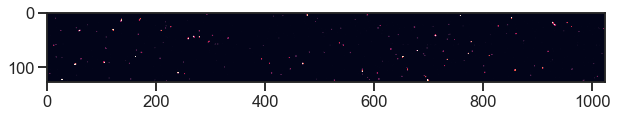

Frame 38


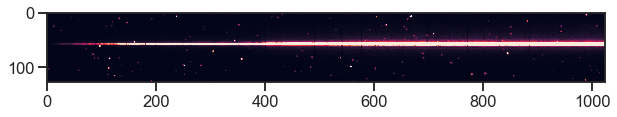

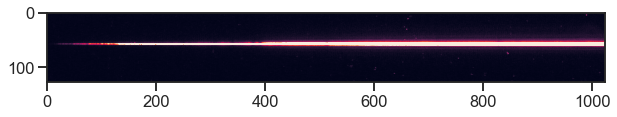

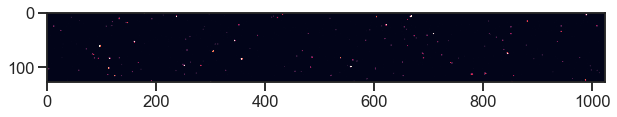

Frame 39


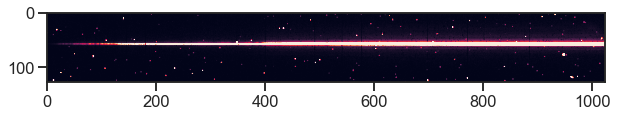

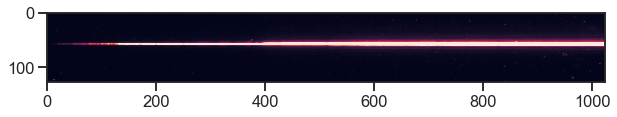

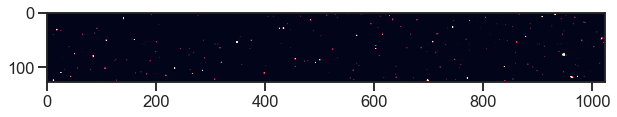

Frame 40


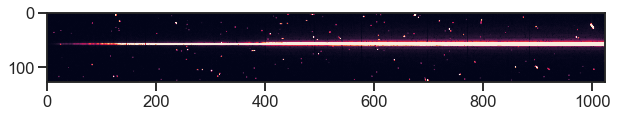

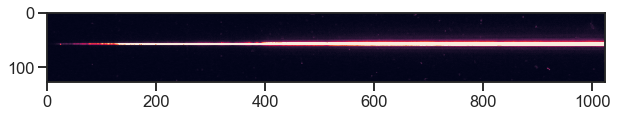

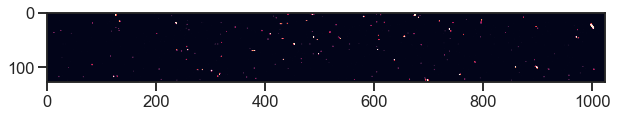

Frame 41


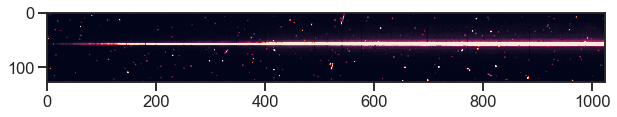

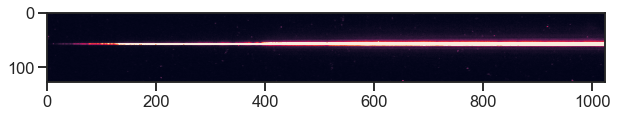

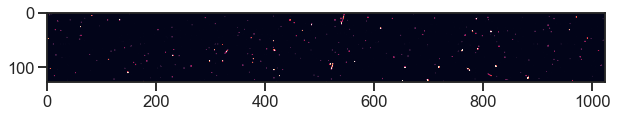

Frame 42


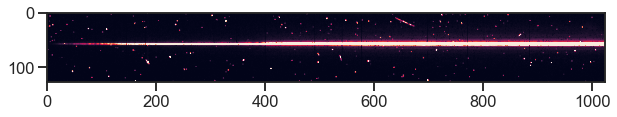

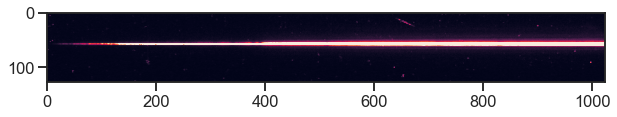

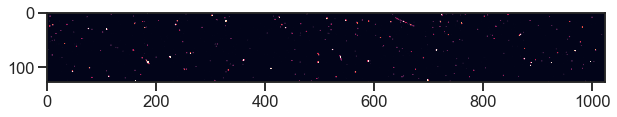

Frame 43


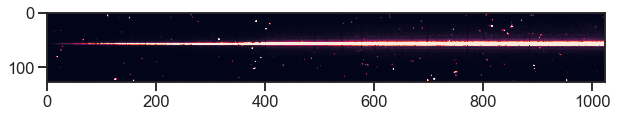

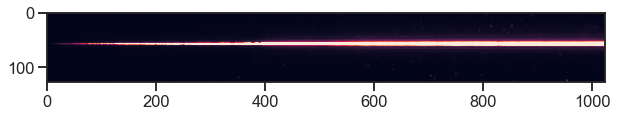

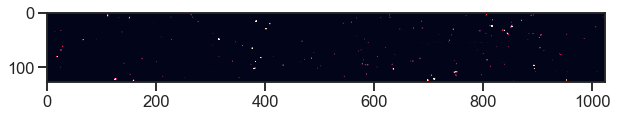

Frame 44


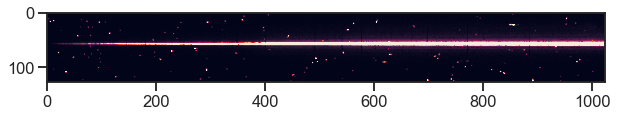

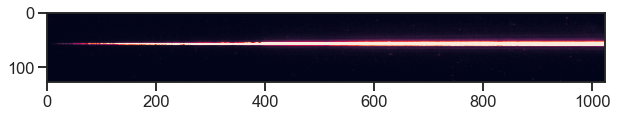

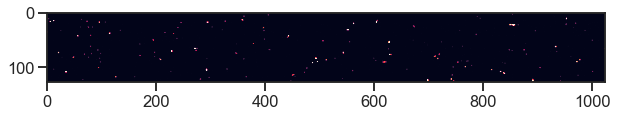

Frame 45


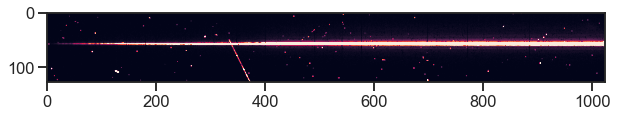

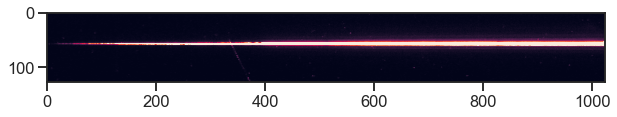

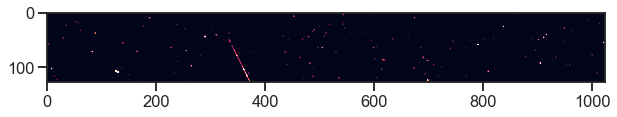

Frame 46


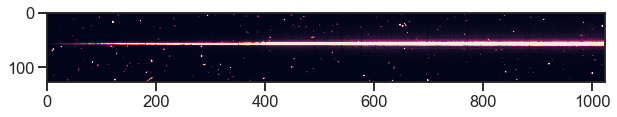

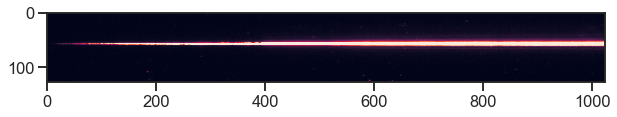

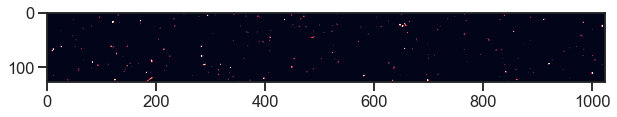

Frame 47


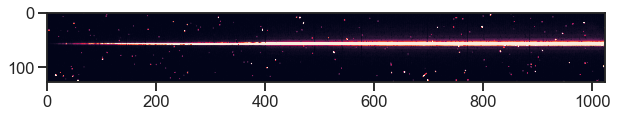

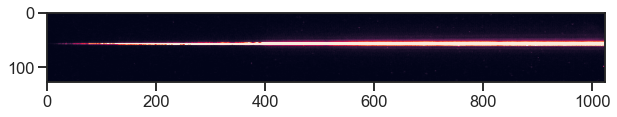

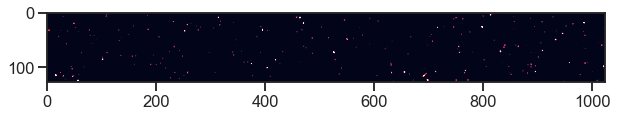

Frame 48


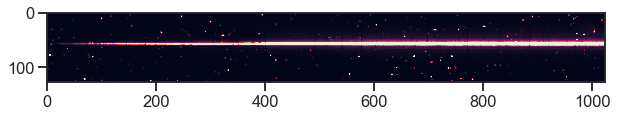

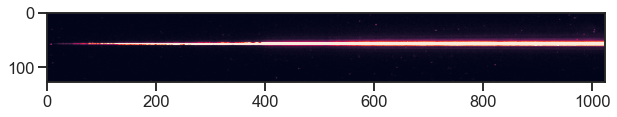

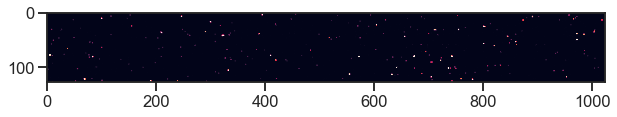

Frame 49


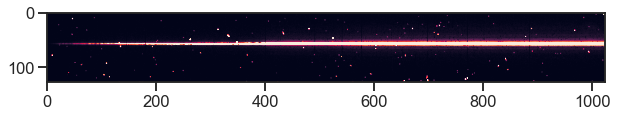

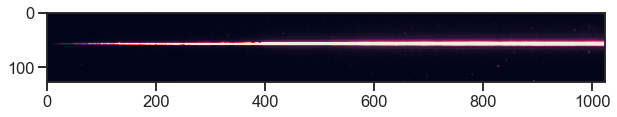

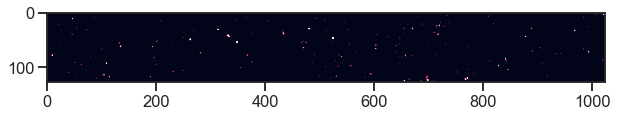

Frame 50


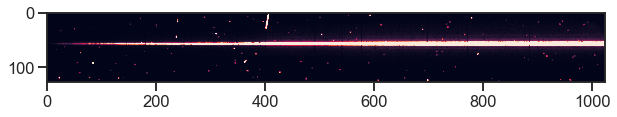

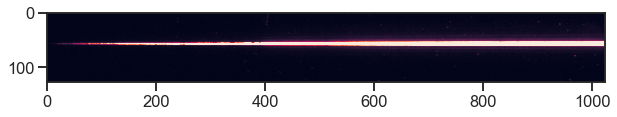

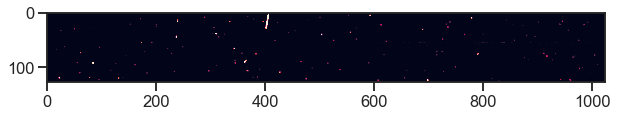

Frame 51


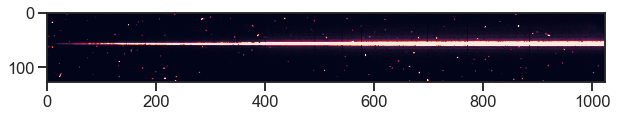

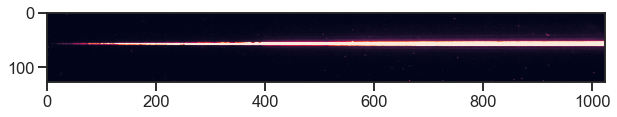

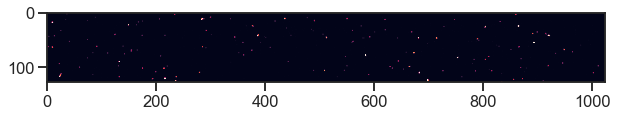

Frame 52


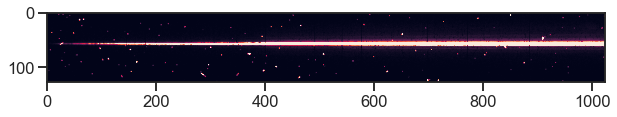

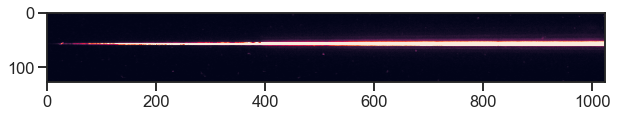

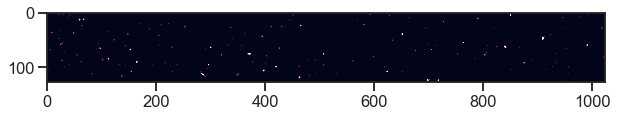

Frame 53


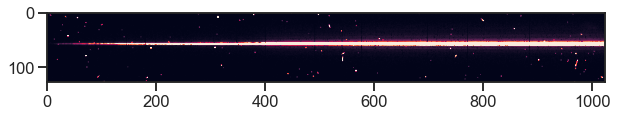

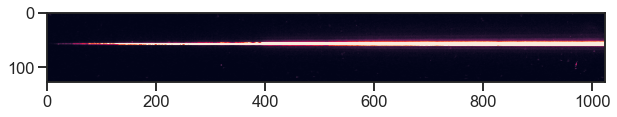

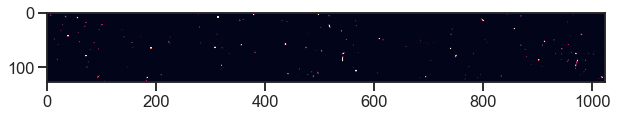

Frame 54


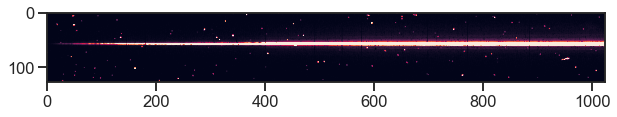

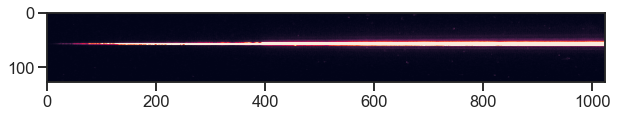

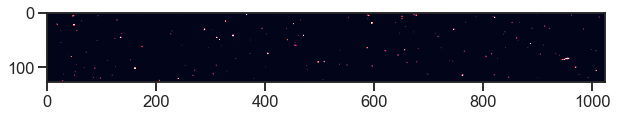

Frame 55


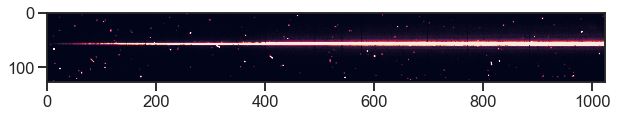

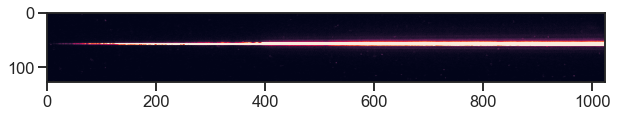

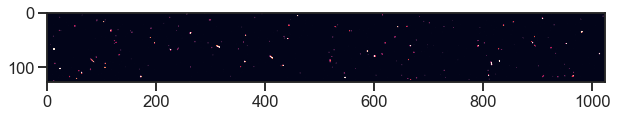

Frame 56


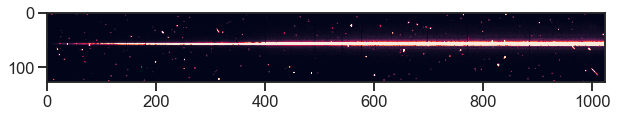

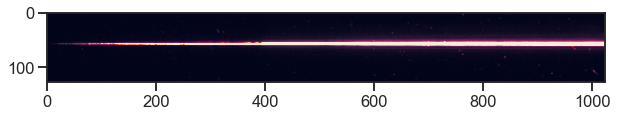

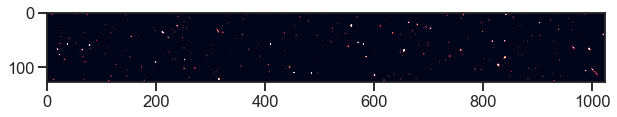

Frame 57


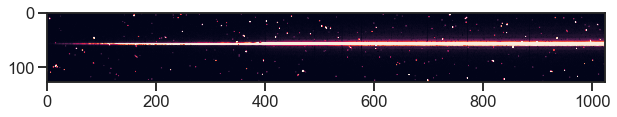

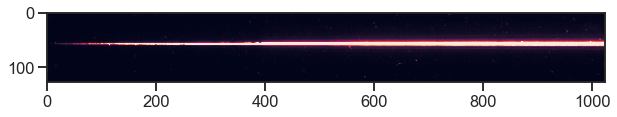

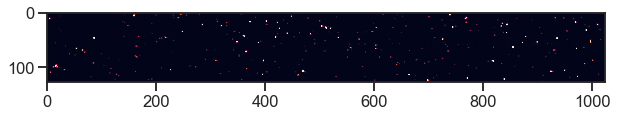

Frame 58


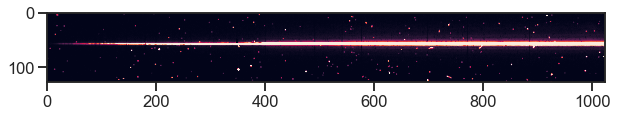

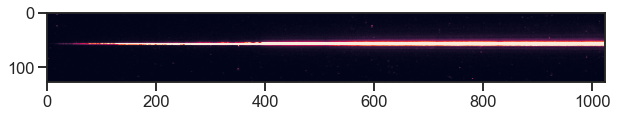

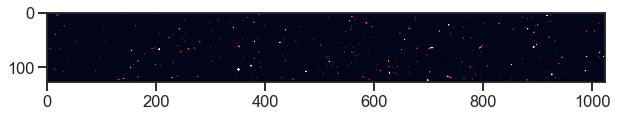

Frame 59


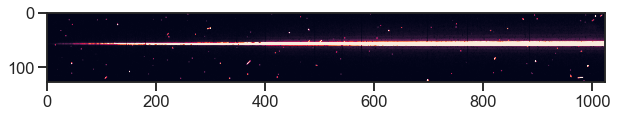

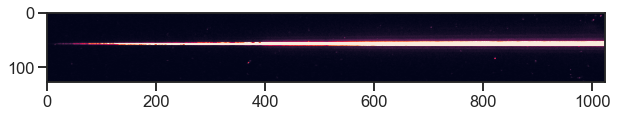

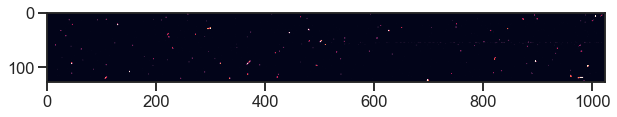

Frame 60


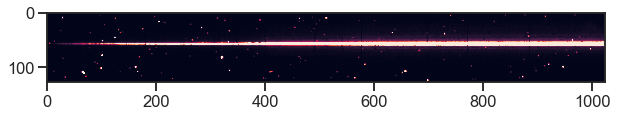

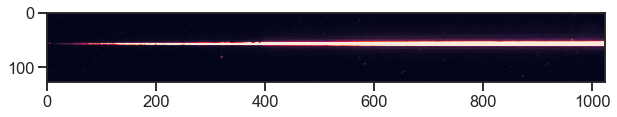

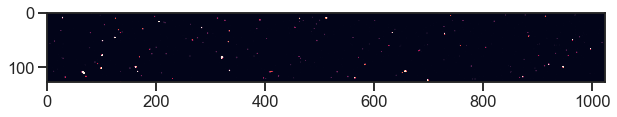

Frame 61


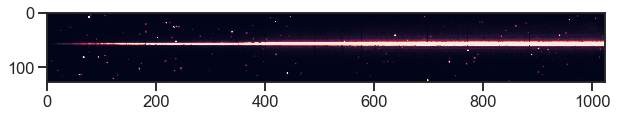

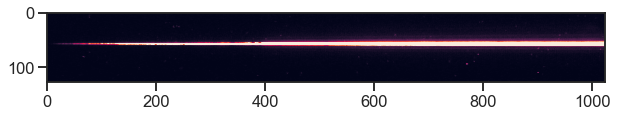

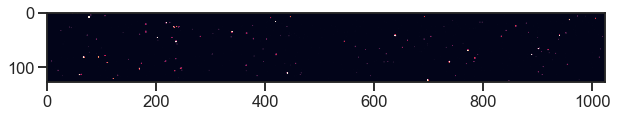

Frame 62


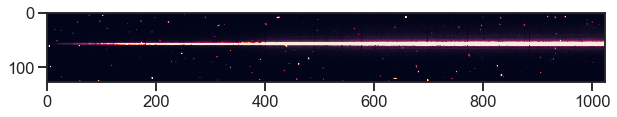

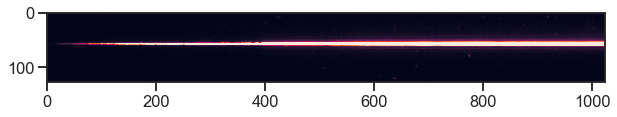

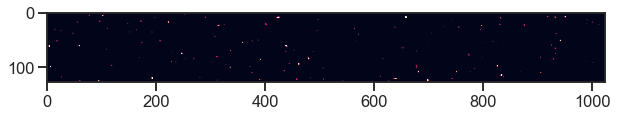

Frame 63


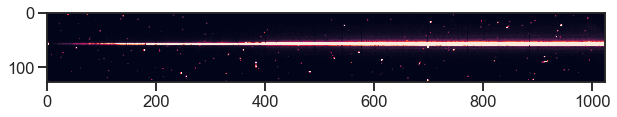

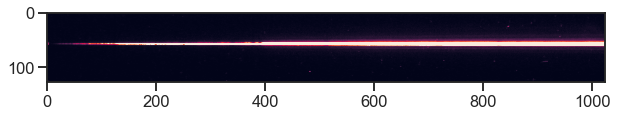

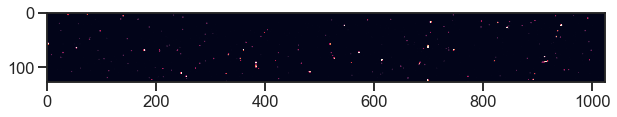

Frame 64


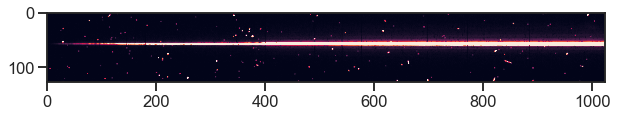

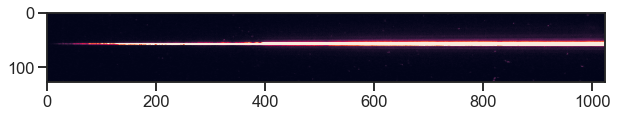

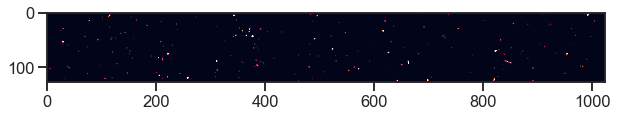

Frame 65


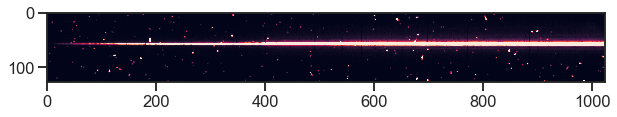

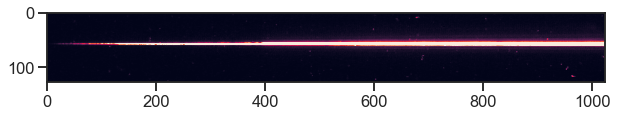

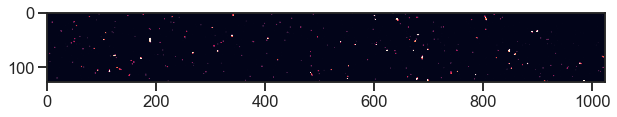

Frame 66


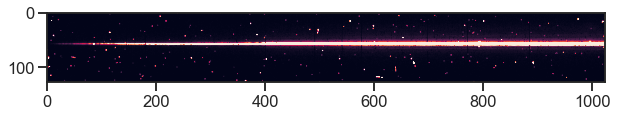

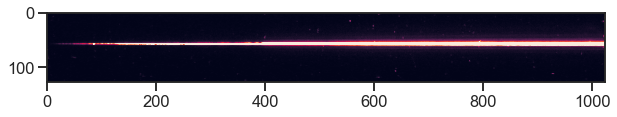

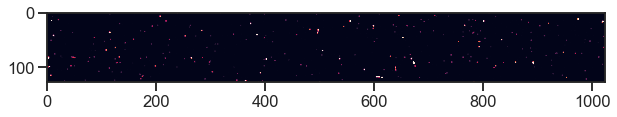

Frame 67


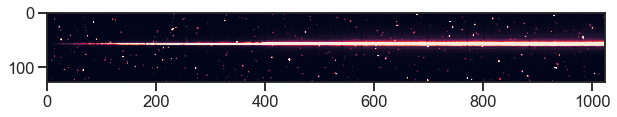

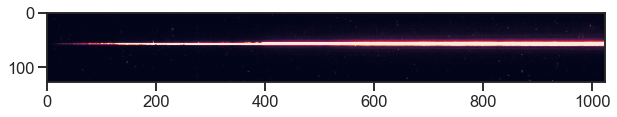

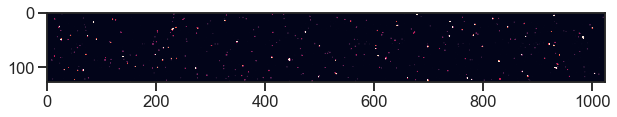

Frame 68


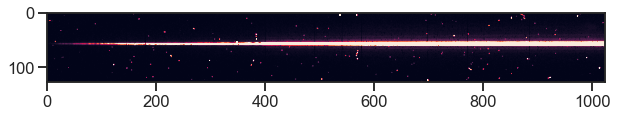

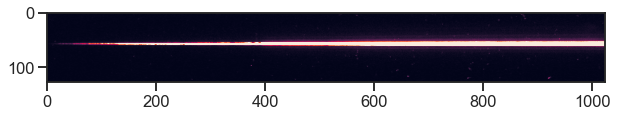

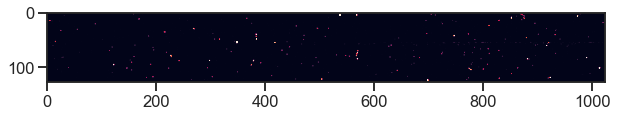

Frame 69


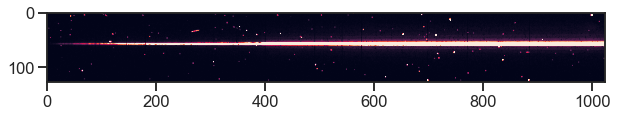

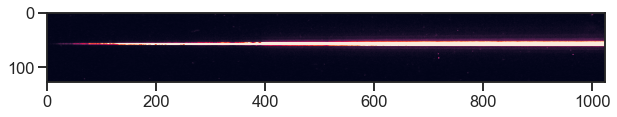

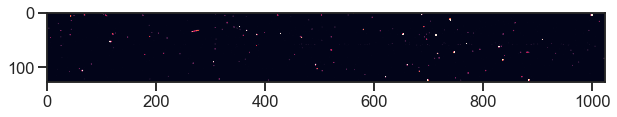

Frame 70


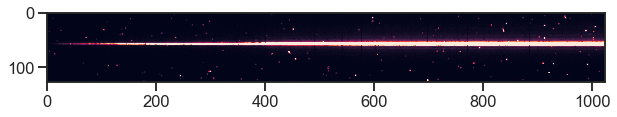

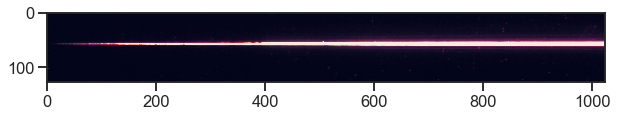

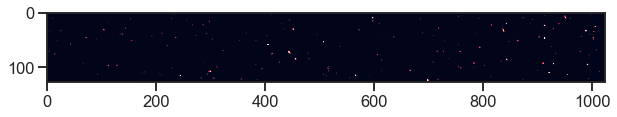

Frame 71


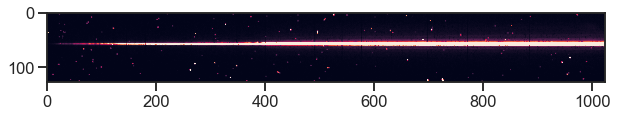

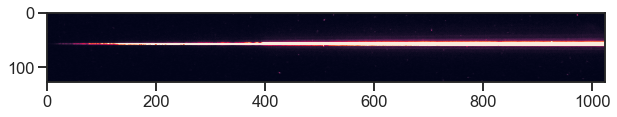

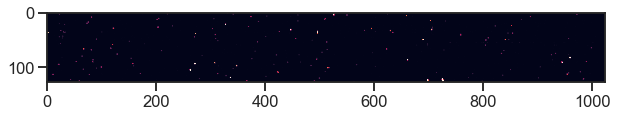

Frame 72


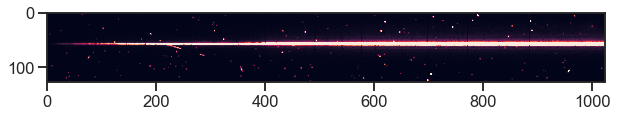

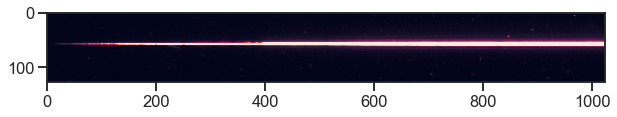

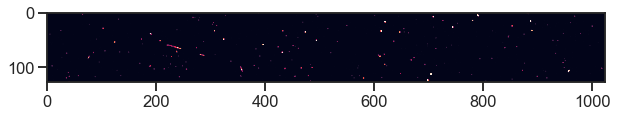

Frame 73


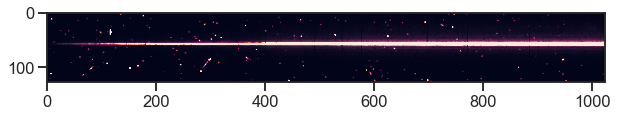

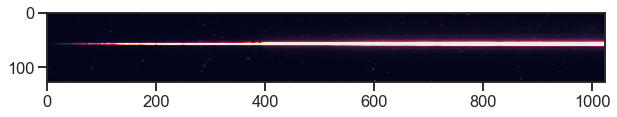

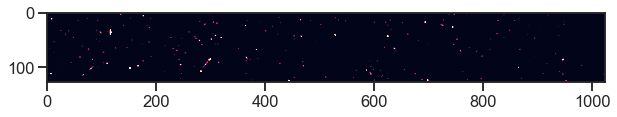

Frame 74


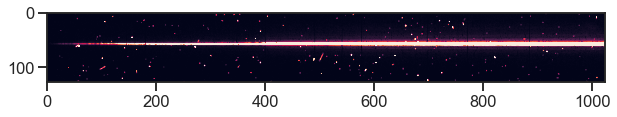

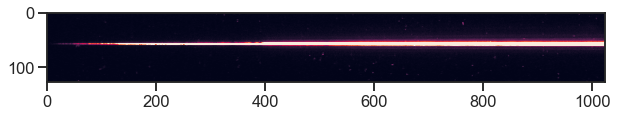

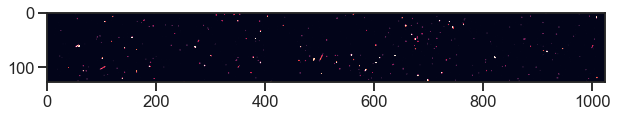

Frame 75


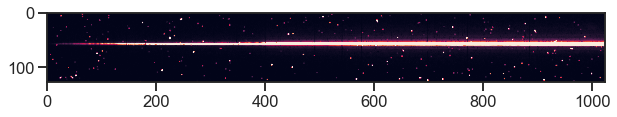

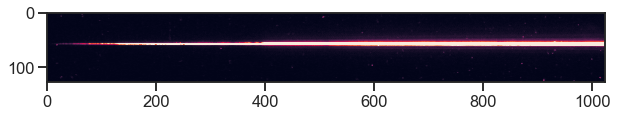

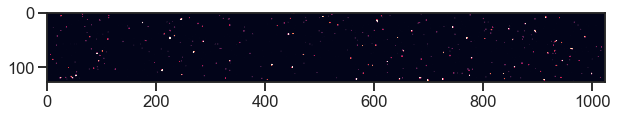

Frame 76


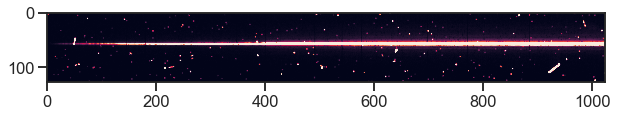

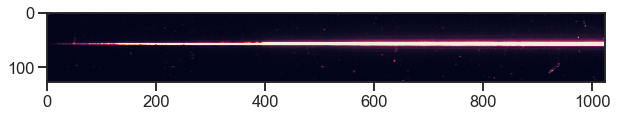

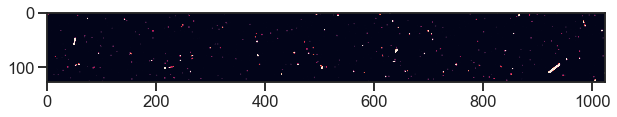

Frame 77


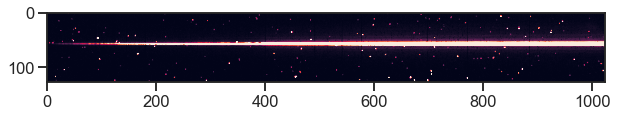

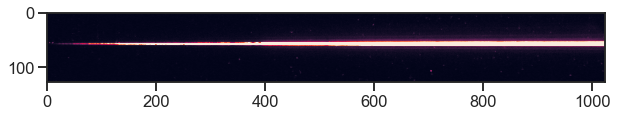

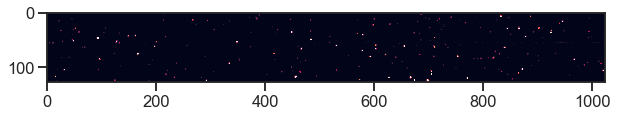

Frame 78


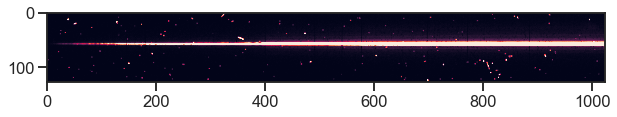

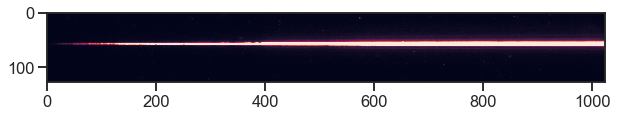

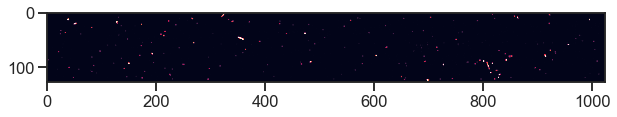

Frame 79


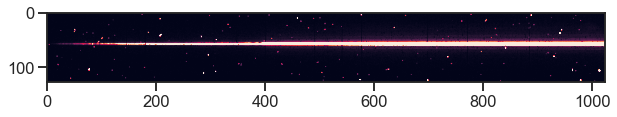

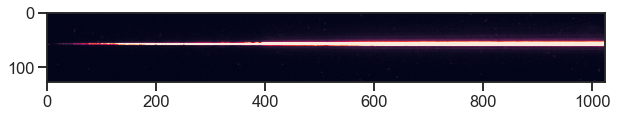

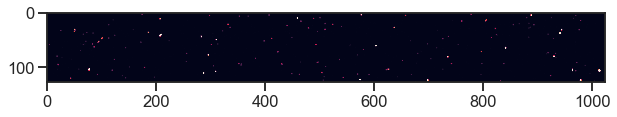

Frame 80


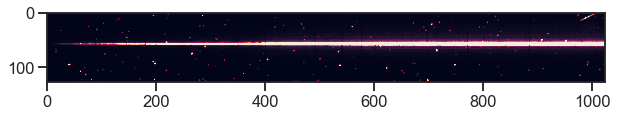

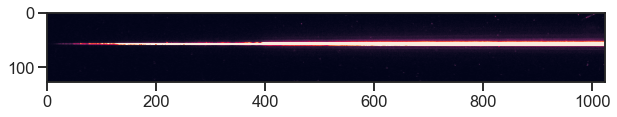

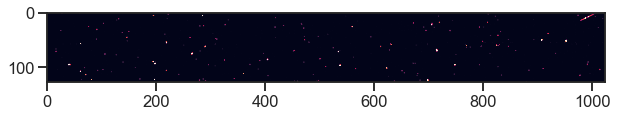

Frame 81


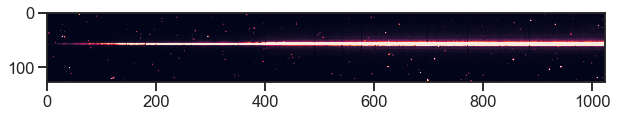

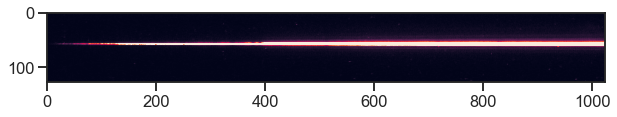

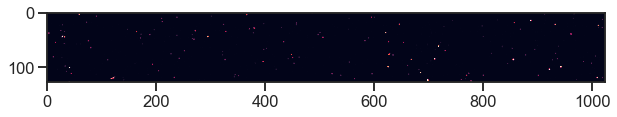

Frame 82


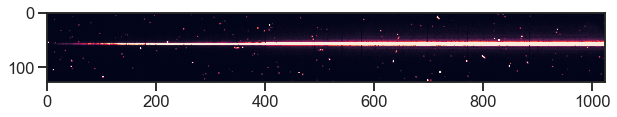

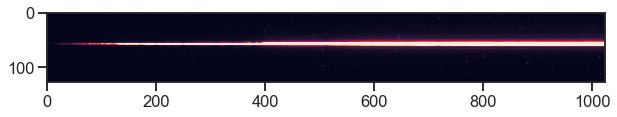

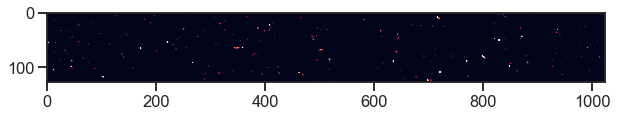

Frame 83


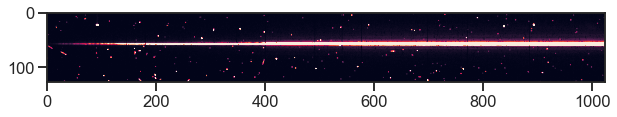

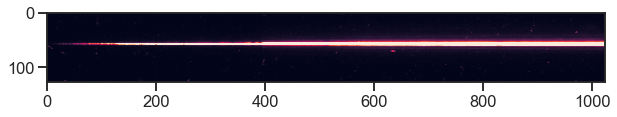

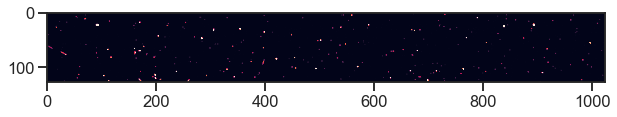

Frame 84


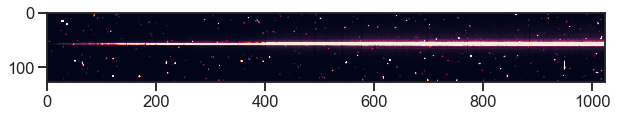

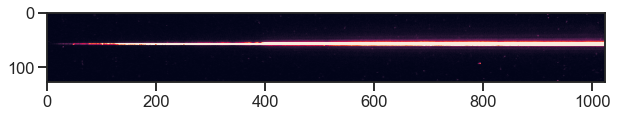

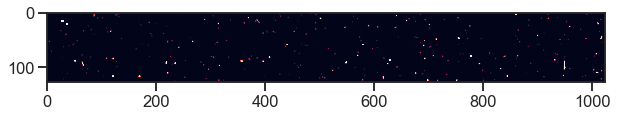

Frame 85


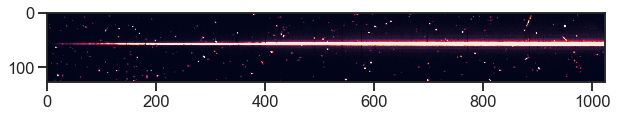

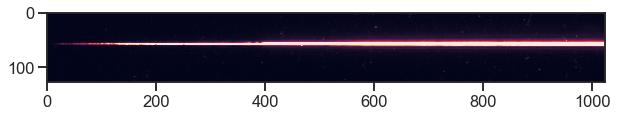

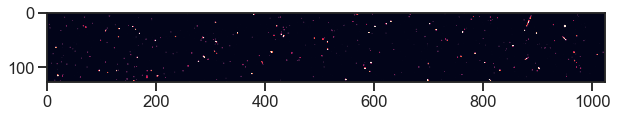

In [15]:
# and the 430 data
transit_430_cleaned_t = transit_430_cleaned + transit_430_2_cleaned

for i in range(len(transit_430_cleaned_t)):
    print("Frame", i)
    plt.figure(figsize = (10,7))
    im = plt.imshow(data_430[0][i])
    im.set_clim(0,200)
    plt.show()
    
    plt.figure(figsize = (10,7))
    im = plt.imshow(transit_430_cleaned_t[i])
    im.set_clim(0,200)
    plt.show()
    
    plt.figure(figsize = (10,7))
    im = plt.imshow(data_430[0][i]-transit_430_cleaned_t[i])
    im.set_clim(0,200)
    plt.show()
        

In [17]:
# save all of the cleaned images - doing this manually now, but will implement into the function later
# probably want to save the file names for the used data files to use
name = "cleaned_data_wasp39_nov17"

if os.path.exists(name) != True:
    os.makedirs(name)
for i in range(len(transit_750_cleaned)):
    filename = "cleaned_750_1_" + str(i).zfill(3) + ".fits"
    fits.writeto(name + "/"+ filename, transit_750_cleaned[i], data_750[1][i], overwrite=True)
    fits.append(name + "/"+ filename, data_750[4][i])
    
for i in range(len(transit_430_cleaned)):
    filename = "cleaned_430_1_" + str(i).zfill(3) + ".fits"
    fits.writeto(name + "/"+ filename, transit_430_cleaned[i], data_430[1][i], overwrite=True)
    fits.append(name + "/"+ filename, data_430[4][i])
    
for i in range(len(transit_430_2_cleaned)):
    filename = "cleaned_430_2_" + str(i).zfill(3) + ".fits"
    fits.writeto(name + "/"+ filename, transit_430_2_cleaned[i], data_430[1][43+i], overwrite=True)
    fits.append(name + "/"+ filename, data_430[4][43+i])


In [18]:
# and then just write the jitter dictionary to a pickle file for later use
with open('jitter_750.pkl', 'wb') as handle:
    pickle.dump(data_750[2], handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('jitter_430.pkl', 'wb') as handle:
    pickle.dump(data_430[2], handle, protocol=pickle.HIGHEST_PROTOCOL)

In [2]:
# now that we have the cleaned files, we don't need to run any of the above code a second time
# read those files in to have this as a new starting point
name = "cleaned_data_wasp39_nov17"

cleaned_data_430_1 = sorted(glob.glob(name + "/cleaned_430_1*"))
transit_430_cleaned = []
headers_430 = []
errs_430 = []
for i in cleaned_data_430_1:
    c_data, hdr = fits.getdata(i, ext = 0, header = True)
    transit_430_cleaned.append(c_data)
    headers_430.append(hdr)
    e_data = fits.getdata(i, ext = 1)
    errs_430.append(e_data)
    
cleaned_data_430_2 = sorted(glob.glob(name + "/cleaned_430_2*"))
transit_430_2_cleaned = []
headers_430_2 = []
errs_430_2 = []
for i in cleaned_data_430_2:
    c_data, hdr = fits.getdata(i, ext = 0, header = True)
    transit_430_2_cleaned.append(c_data)
    headers_430_2.append(hdr)
    e_data = fits.getdata(i, ext = 1)
    errs_430_2.append(e_data)

with open('jitter_430.pkl', 'rb') as handle:
    jit_430 = pickle.load(handle)

In [3]:
cleaned_data_750 = sorted(glob.glob(name + "/cleaned_750*"))
transit_750_cleaned = []
headers_750 = []
errs_750 = []
for i in cleaned_data_750:
    c_data, hdr = fits.getdata(i, ext = 0, header = True)
    transit_750_cleaned.append(c_data)
    headers_750.append(hdr)
    e_data = fits.getdata(i, ext = 1)
    errs_750.append(e_data)

with open('jitter_750.pkl', 'rb') as handle:
    jit_750 = pickle.load(handle)

In [4]:
with open('jitter_430.pkl', 'rb') as handle:
    jit_430 = pickle.load(handle)
with open('jitter_750.pkl', 'rb') as handle:
    jit_750 = pickle.load(handle)

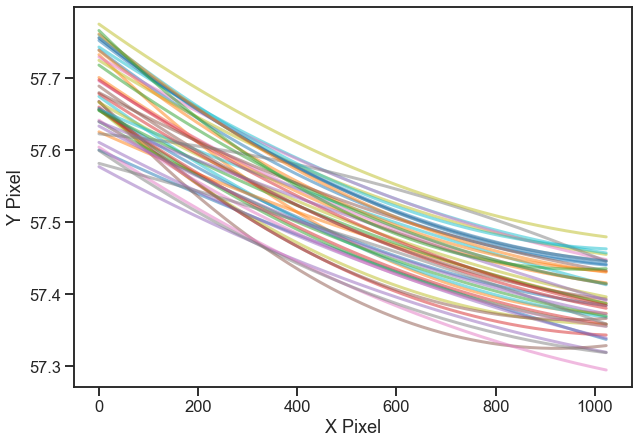

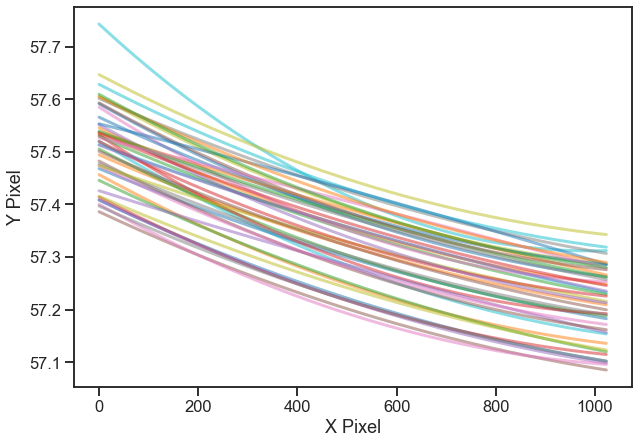

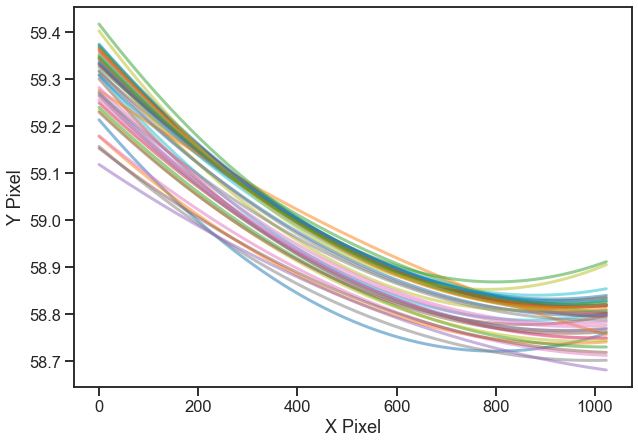

In [5]:
# now to retrace the cleaned data
trace_430_list = []
plt.figure(figsize = (10,7))
for i in transit_430_cleaned:
    trace = trace_spectrum(i, 200,1000,60)
    trace_430_list.append(trace)

trace_430_coeffs = []
trace_430_fit = []
for j in trace_430_list:
    coeffs1 = chebyshev.chebfit(j[0], j[1], deg=2)
    plt.plot(np.arange(len(transit_430_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_430_cleaned[0][0])),coeffs1),lw=3, alpha = 0.5)
    trace = [np.arange(len(transit_430_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_430_cleaned[0][0])),coeffs1)]
    trace_430_fit.append(trace)
    trace_430_coeffs.append(coeffs1)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

trace_430_2_list = []
plt.figure(figsize = (10,7))
for i in transit_430_2_cleaned:
    trace = trace_spectrum(i, 200,1000,60)
    trace_430_2_list.append(trace)

trace_430_2_coeffs = []
trace_430_2_fit = []
for j in trace_430_2_list:
    coeffs1 = chebyshev.chebfit(j[0], j[1], deg=2)
    plt.plot(np.arange(len(transit_430_2_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_430_2_cleaned[0][0])),coeffs1),lw=3, alpha = 0.5)
    trace = [np.arange(len(transit_430_2_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_430_2_cleaned[0][0])),coeffs1)]
    trace_430_2_fit.append(trace)
    trace_430_2_coeffs.append(coeffs1)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()

trace_750_list = []
plt.figure(figsize = (10,7))
for i in transit_750_cleaned:
    trace = trace_spectrum(i, 200,1000,60)
    trace_750_list.append(trace)

trace_750_coeffs = []
trace_750_fit = []
for j in trace_750_list:
    coeffs1 = chebyshev.chebfit(j[0], j[1], deg=2)
    plt.plot(np.arange(len(transit_750_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_750_cleaned[0][0])),coeffs1),lw=3, alpha = 0.5)
    trace = [np.arange(len(transit_750_cleaned[0][0])),chebyshev.chebval(np.arange(len(transit_750_cleaned[0][0])),coeffs1)]
    trace_750_fit.append(trace)
    trace_750_coeffs.append(coeffs1)
plt.ylabel("Y Pixel")
plt.xlabel("X Pixel")
plt.show()


In [6]:
# now for the spectral extraction - I use optimal and I feed in the ron and gain values from the header
spectra_430 = []
for i in range(len(transit_430_cleaned)):
    spec = spectral_extraction(transit_430_cleaned[i], trace_430_fit[i], method = "optimal", gain = 4.0159998, ron = 8.2327986, polynomial_order = 3, nsigma = 12)
    spectra_430.append(spec)

In [7]:
spectra_430_2 = []
for i in range(len(transit_430_2_cleaned)):
    spec = spectral_extraction(transit_430_2_cleaned[i], trace_430_2_fit[i], method = "optimal", gain = 4.0159998, ron = 8.2327986, polynomial_order = 3, nsigma = 12)
    spectra_430_2.append(spec)

In [8]:
spectra_750 = []
for i in range(len(transit_750_cleaned)):
    spec = spectral_extraction(transit_750_cleaned[i], trace_750_fit[i], method = "optimal", gain = 4.0159998, ron = 8.2327986, polynomial_order = 3, nsigma = 12)
    spectra_750.append(spec)

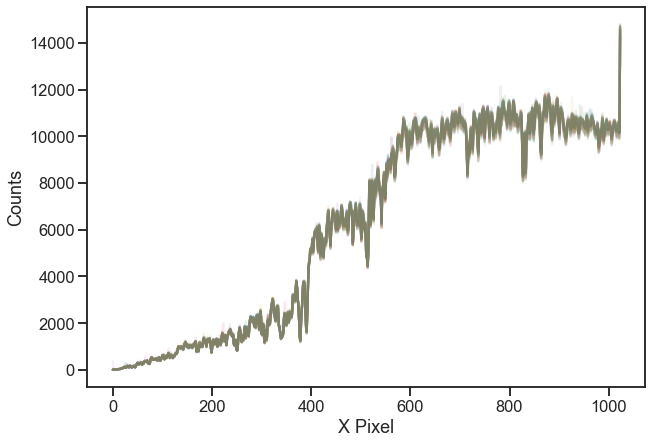

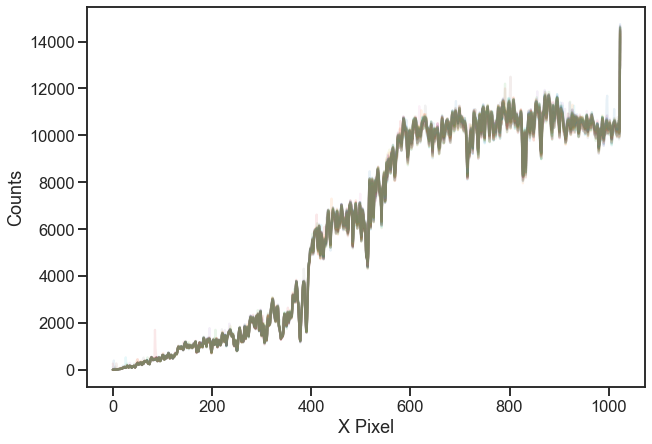

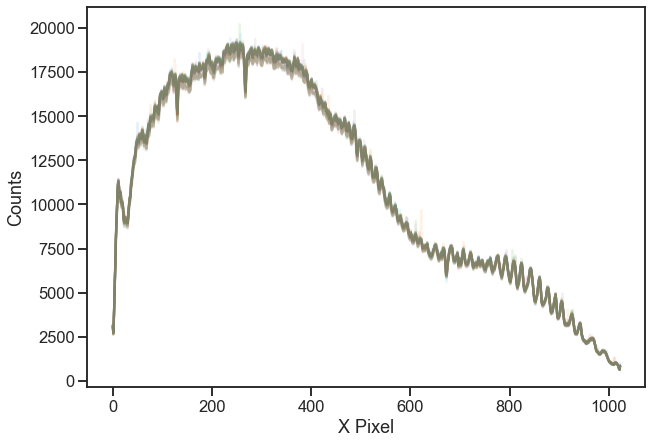

In [9]:
# plot all of the spectra on top of each other 
%matplotlib inline
plt.figure(figsize = (10,7))
for i in spectra_430:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,7))
for i in spectra_430_2:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,7))
for i in spectra_750:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

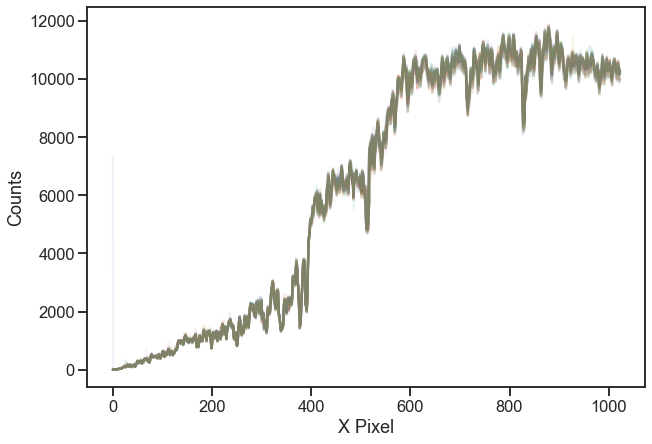

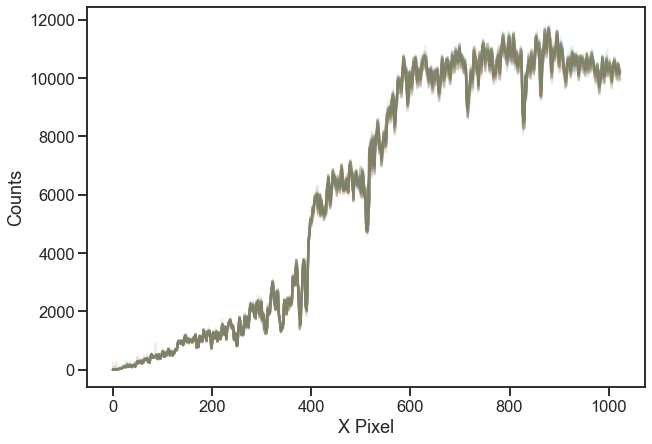

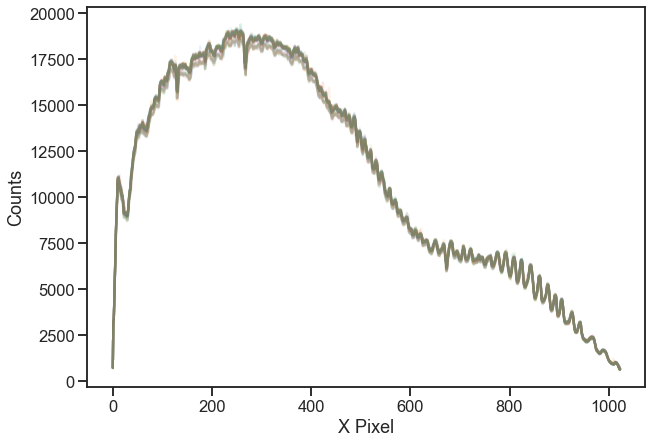

In [10]:
# hm, there's maybe a few outliers, so let's just try to get rid of some of those using a basic median filter function
spectra_430 = spectrum_outliers(spectra_430)
spectra_430_2 = spectrum_outliers(spectra_430_2)
spectra_750 = spectrum_outliers(spectra_750)

plt.figure(figsize = (10,7))
for i in spectra_430:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,7))
for i in spectra_430_2:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

plt.figure(figsize = (10,7))
for i in spectra_750:
    plt.plot(i[1], alpha = 0.1)
plt.ylabel("Counts")
plt.xlabel("X Pixel")
plt.show()

In [11]:
# sum up each of the spectra for the white light curve
lc_430 = []
lc_err_430 = []
for i in spectra_430:
    point = np.nansum(i[1])
    # i assume error prop is just like sqrt(sum of squares of errors)
    # optimal extraction outputs inverse variance, so assume np.sqrt(np.nansum((1/np.sqrt(i[2]))**2)) 
    # is the error on each point
    err = np.sqrt(np.nansum((1/np.sqrt(i[2]))**2))
    lc_430.append(point)
    lc_err_430.append(err)
    
lc_430_2 = []
lc_err_430_2 = []
for i in spectra_430_2:
    point = np.nansum(i[1])
    err = np.sqrt(np.nansum((1/np.sqrt(i[2]))**2))
    lc_430_2.append(point)
    lc_err_430_2.append(err)
    
lc_750 = []
lc_err_750 = []
for i in spectra_750:
    point = np.nansum(i[1])
    err = np.sqrt(np.nansum((1/np.sqrt(i[2]))**2))
    lc_750.append(point)
    lc_err_750.append(err)

In [12]:
# now to deal with the timestamps. HST header times come in JDUTC, we want BJD-TBD 
times_430 = times_to_bjd(headers_430, starname = "WASP-39")
times_start_430 = times_430[0][0]
times_end_430 = times_430[0][1]

times_430_2 = times_to_bjd(headers_430_2, starname = "WASP-39")
times_start_430_2 = times_430_2[0][0]
times_end_430_2 = times_430_2[0][1]

times_750 = times_to_bjd(headers_750, starname = "WASP-39")
times_start_750 = times_750[0][0]
times_end_750 = times_750[0][1]

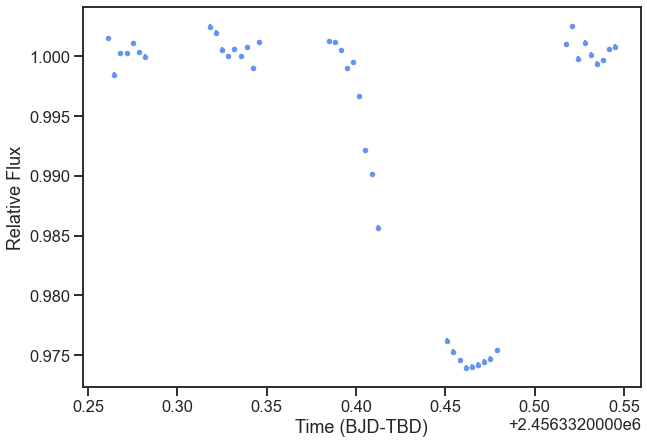

In [13]:
# should now be able to plot our raw white light curve
plt.figure(figsize = (10,7))
plt.errorbar(times_start_430, lc_430/np.nanmedian(lc_430), yerr = lc_err_430/np.nanmedian(lc_430), fmt = ".", color = "cornflowerblue", label = "var")
plt.xlabel("Time (BJD-TBD)")
plt.ylabel("Relative Flux")
#plt.ylim(0.95, 1.01)
plt.show()

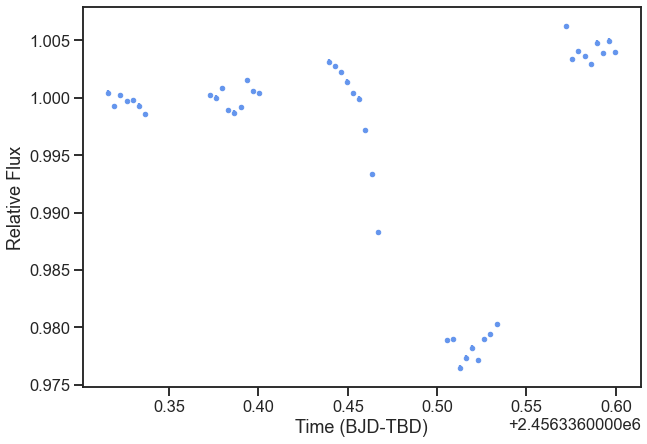

In [14]:
plt.figure(figsize = (10,7))
plt.errorbar(times_start_430_2, lc_430_2/np.nanmedian(lc_430_2), yerr = lc_err_430_2/np.nanmedian(lc_430_2), fmt = ".", color = "cornflowerblue", label = "var")
plt.xlabel("Time (BJD-TBD)")
plt.ylabel("Relative Flux")
#plt.ylim(0.95, 1.01)
plt.show()

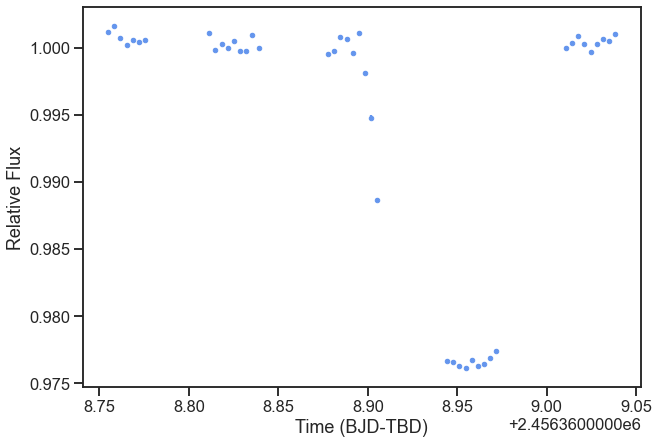

In [15]:
plt.figure(figsize = (10,7))
plt.errorbar(times_start_750, lc_750/np.nanmedian(lc_750), yerr = lc_err_750/np.nanmedian(lc_750), fmt = ".", color = "cornflowerblue", label = "var")
plt.xlabel("Time (BJD-TBD)")
plt.ylabel("Relative Flux")
#plt.ylim(0.95, 1.01)
plt.show()

In [16]:
# calculate trace polynomial movement - another detrending vector
template_430 = np.nanmedian(trace_430_coeffs, axis = 0)
movement_430 = []
movement_coeff1_430 = []
movement_coeff2_430 = []
for i in trace_430_coeffs:
    #plt.plot(template_430-i)
    #movement_430.append(np.nanmedian(template_430-i[1]))
    movement_430.append((template_430-i)[0])
    movement_coeff1_430.append((template_430-i)[1])
    movement_coeff2_430.append((template_430-i)[2])
    
#jit_430["Y"] = movement_430

template_430_2 = np.nanmedian(trace_430_2_coeffs, axis = 0)
movement_430_2 = []
movement_coeff1_430_2 = []
movement_coeff2_430_2 = []
for i in trace_430_2_coeffs:
    #plt.plot(template_430-i)
    #movement_430.append(np.nanmedian(template_430-i[1]))
    movement_430_2.append((template_430-i)[0])
    movement_coeff1_430_2.append((template_430-i)[1])
    movement_coeff2_430_2.append((template_430-i)[2])

#jit_430["Y"] = movement_430 + movement_430_2
jit_430["T_move"] = movement_430 + movement_430_2
jit_430["T_coeff1"] = movement_coeff1_430 + movement_coeff1_430_2
jit_430["T_coeff2"] = movement_coeff2_430 + movement_coeff2_430_2

In [17]:
template_750 = np.nanmedian(trace_750_coeffs, axis = 0)
movement_750 = []
movement_coeff1_750 = []
movement_coeff2_750 = []
for i in trace_750_coeffs:
    #plt.plot(template_430-i)
    #movement_430.append(np.nanmedian(template_430-i[1]))
    movement_750.append((template_750-i)[0])
    movement_coeff1_750.append((template_750-i)[1])
    movement_coeff2_750.append((template_750-i)[2])
#jit_750["Y"] = movement_750
jit_750["T_move"] = movement_750
jit_750["T_coeff1"] = movement_coeff1_750
jit_750["T_coeff2"] = movement_coeff2_750

In [18]:
# before fitting, we just need to normalize our jitter vectors into standard deviation
# these are the detrending vectors to use
jit_use = ["V2_roll", "V3_roll", "Latitude", "Longitude", "RA", "DEC", "T_move", "T_coeff1", "T_coeff2"]

norm_jit_750 = {}
for i in jit_use:
    norm = (jit_750[i]/np.nanmean(jit_750[i]))-1
    norm_jit_750[i] = norm/np.std(norm)

In [19]:
jit_use = ["V2_roll", "V3_roll", "Latitude", "Longitude", "RA", "DEC", "T_move", "T_coeff1", "T_coeff2"]
norm_jit_430 = {}
for i in jit_use:
    norm = (jit_430[i][:43]/np.nanmean(jit_430[i][:43]))-1
    norm_jit_430[i] = norm/np.std(norm)
    
norm_jit_430_2 = {}
for i in jit_use:
    norm = (jit_430[i][43:]/np.nanmean(jit_430[i][43:]))-1
    norm_jit_430_2[i] = norm/np.std(norm)

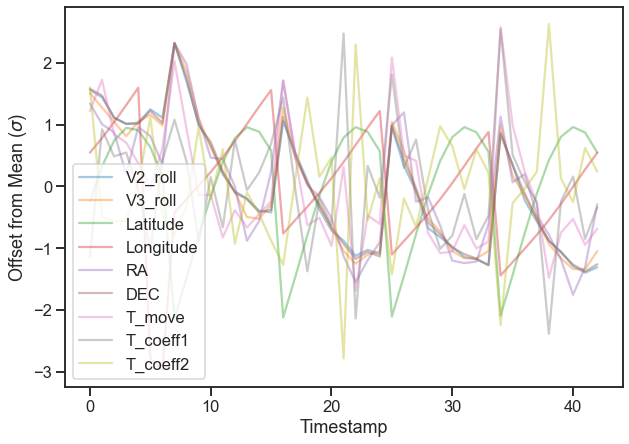

In [20]:
# check them out 
plt.figure(figsize = (10,7))
for i in norm_jit_750:
    plt.plot(norm_jit_750[i], alpha = 0.4, label = str(i))
plt.xlabel("Timestamp")
plt.ylabel(r"Offset from Mean ($\sigma$)")
plt.legend()
plt.show()

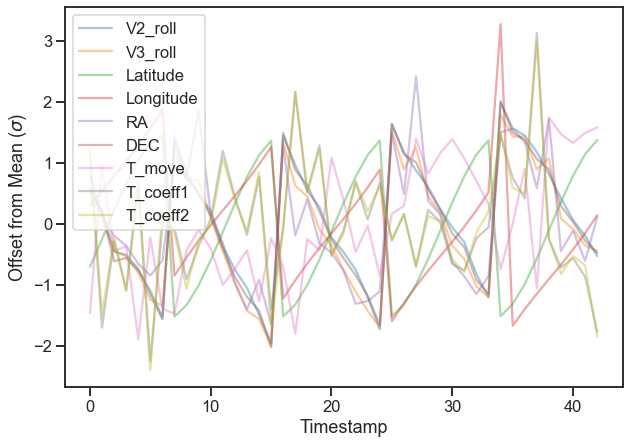

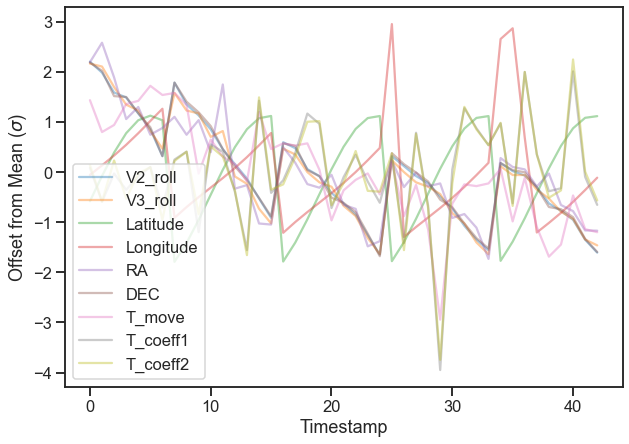

In [21]:
plt.figure(figsize = (10,7))
for i in norm_jit_430:
    plt.plot(norm_jit_430[i], alpha = 0.4, label = str(i))
plt.xlabel("Timestamp")
plt.ylabel(r"Offset from Mean ($\sigma$)")
plt.legend()
plt.show()

plt.figure(figsize = (10,7))
for i in norm_jit_430_2:
    plt.plot(norm_jit_430_2[i], alpha = 0.4, label = str(i))
plt.xlabel("Timestamp")
plt.ylabel(r"Offset from Mean ($\sigma$)")
plt.legend()
plt.show()

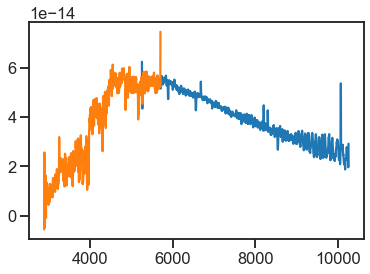

In [22]:
# next, we get the wavelength solution (even though we don't necessarily need it for the white light
# we do need it for the limb darkening coefficients)
wl_sol_750 = fits.getdata("wasp-39/HST/G750L/obri23010/obri23010_x1d.fits", ext = 1)
for i, order_750 in enumerate(wl_sol_750):
    plt.plot(order_750["WAVELENGTH"], order_750["FLUX"])
    
wl_sol_430 = fits.getdata("wasp-39/HST/G430L/obri13010/obri13010_x1d.fits", ext = 1)
for i, order_430 in enumerate(wl_sol_430):
    plt.plot(order_430["WAVELENGTH"], order_430["FLUX"])

In [59]:
order_430["WAVELENGTH"]

array([2895.88814424, 2898.63274046, 2901.37736263, ..., 5700.30093288,
       5703.03866589, 5705.77635972])

In [23]:
# we're going to fix limb darkening for now
# u1 = 2*sqrt(q1)*q2, u2 = sqrt(q1)*(1-2*q2) or q1 = (u1+u2)^2, q2 = u1/(2*(u1+u2)). 

from exotic_ld import StellarLimbDarkening

sld = StellarLimbDarkening(
            M_H=0.01, Teff=5400, logg=4.45, ld_model='1D',
            ld_data_path="/Users/natalieallen/Documents/Grad/Sing Research/exotic-ld_data")

c1_430, c2_430 = sld.compute_quadratic_ld_coeffs(
            wavelength_range=np.array([order_430["WAVELENGTH"][0], order_430["WAVELENGTH"][-1]]),
            mode='HST_STIS_G430L')

c1_750, c2_750 = sld.compute_quadratic_ld_coeffs(
            wavelength_range=np.array([order_750["WAVELENGTH"][0], order_750["WAVELENGTH"][-1]]),
            mode='HST_STIS_G750L')

In [24]:
# to read into the white_light_fit functions, just need to create a dictionary like this - 
# put just the value if it should be fixed, and the value and range in a list if it should be fit
params_430 = {"P": [4.0552889], "t0": [2459791.612097, 0.1], "p": [0.14, 0.05], "b": [0.4467], "a": [11.389], "ecc": [0], "omega": [90], "c1": [c1_430], "c2": [c2_430], "rho": [1699.4, 6.9]}

In [25]:
params_750 = {"P": [4.0552889],"t0": [2459791.612097, 0.1], "p": [0.14, 0.05], "b": [0.4467], "a": [11.389], "ecc": [0], "omega": [90], "c1": [c1_750], "c2": [c2_750], "rho": [1699.4, 6.9]}

In [26]:
# now for a bunch of light curve fitting
# to quickly describe, there are three main "options" for different fitting methods
# there is a gp detrending method (using juliet), and two jitter detrending methods - one using juliet,
# and another just using a quick LM fit function (mostly just for test purposes)
# the juliet fits can use any of the available samplers, although right now I only have the default pymultinest and
# dynesty set up

# first, a jitter systematics detrending fit using the quick LM method
jitter_fit_lm = white_light_fit(params_430, times_start_430, lc_430, lc_err_430, norm_jit_430, sys_method = "jitter", sampler = "LM")
# this outputs a data cube [fit_param, fit_uncs, model_final, lc]

In [27]:
# here are the results of that fit
jitter_fit_lm[0]

{'t0': 2459791.6134859803,
 'p': 0.13762260098857287,
 'rho': 1699.4,
 'V2_roll': 0.0003015409627845701,
 'V3_roll': -0.0005002239989983527,
 'Latitude': -0.0005235708111360701,
 'Longitude': -2.2600392022591273e-05,
 'RA': 0.0005055425420043206,
 'DEC': -0.00018268879728287218,
 'T_move': 0.0,
 'T_coeff1': 0.0,
 'T_coeff2': 0.0,
 'f0': 6450618.415604047}

In [28]:
# then, a gp systematics detrending fit
# if you use the gp method, you need to provide a name for an output folder with juliet_name
gp_fit = white_light_fit(params_430, times_start_430, lc_430, lc_err_430, norm_jit_430, sys_method = "gp", juliet_name = "wasp-39_430", gp_kernel = "Matern")
# this outputs a juliet "results" type - will show some ways of how to use that below

  analysing data from juliet_fits/wasp-39_430/jomnest_.txt


In [29]:
# here are the results for that fit
for i in gp_fit.posteriors['posterior_samples'].keys():
    print(i, np.median(gp_fit.posteriors['posterior_samples'][i]))

unnamed 0.814672042629921
loglike 237.0017756461546
t0_p1 2459791.6178626507
p_p1 0.14512871453174134
rho 1698.1851620894074
mflux_STIS 0.0008452619247746777
sigma_w_STIS 96.45253527587286
GP_sigma_STIS 478.22231122194046
GP_malpha0_STIS 0.5655015139127426
GP_malpha1_STIS 0.5672202761711939
GP_malpha2_STIS 0.9513988347993586
GP_malpha3_STIS 0.8977906412193108
GP_malpha4_STIS 0.6559079895902132
GP_malpha5_STIS 0.6943515856385438
GP_malpha6_STIS 0.8059915437068361
GP_malpha7_STIS 0.4094135156092998
GP_malpha8_STIS 0.45510525328861284


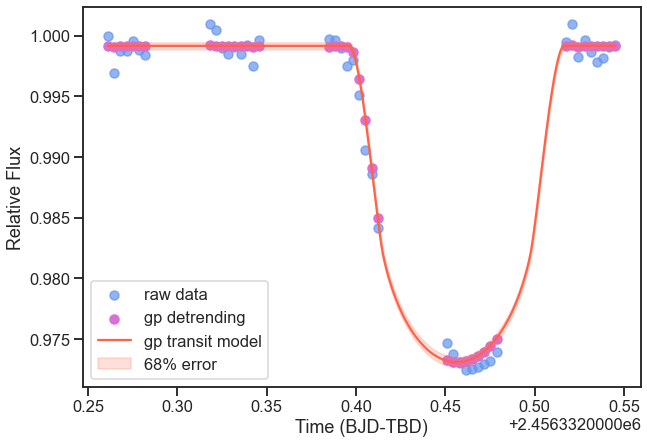

In [79]:
%matplotlib inline
# let's plot the results of this fit 
plt.figure(figsize = (10,7))
t_final = np.linspace(times_start_430[0], times_start_430[-1], 1000)
# then the gp detrending
transit_plus_GP_model = gp_fit.lc.evaluate('STIS')
transit_model = gp_fit.lc.evaluate('STIS', evaluate_transit = True)
transit_model_resamp, error68_up, error68_down = gp_fit.lc.evaluate('STIS', evaluate_transit = True, t = t_final, return_err = True)

#gp_model = transit_plus_GP_model - transit_model

#transit_plus_GP_model = gp_fit.lc.evaluate('STIS', t = t_final, GPregressors = t_gp)
#transit_model = gp_fit.lc.model['STIS']['deterministic']
#gp_model = gp_fit.lc.model['STIS']['GP']
# there may be a small vertical offset between the two models because of the different normalizations - account for that
offset = 0
plt.scatter(times_start_430, (lc_430/lc_430[0]), label = "raw data", color = "cornflowerblue", alpha = 0.7)
plt.scatter(times_start_430, (lc_430/lc_430[0]) - (transit_plus_GP_model - transit_model) + offset,alpha=1, label = "gp detrending", color = "orchid")
#plt.plot(t_final, batman_model(t_final), color='black',zorder=10, label = "gp transit model (batman)")
plt.plot(np.linspace(times_start_430[0], times_start_430[-1], 1000), transit_model_resamp + offset, color='tomato',zorder=10, label = "gp transit model")
plt.fill_between(t_final, error68_up, error68_down, color = "tomato", alpha = 0.2, label = "68% error")

plt.legend()
plt.ylabel("Relative Flux")
plt.xlabel("Time (BJD-TBD)")
plt.show()

In [30]:
gp_fit_2 = white_light_fit(params_430, times_start_430_2, lc_430_2, lc_err_430_2, norm_jit_430_2, sys_method = "gp", juliet_name = "wasp-39_430_2", gp_kernel = "Matern")


  analysing data from juliet_fits/wasp-39_430_2/jomnest_.txt


In [31]:
# here are the results for that fit
for i in gp_fit_2.posteriors['posterior_samples'].keys():
    print(i, np.median(gp_fit_2.posteriors['posterior_samples'][i]))

unnamed 0.5259963936393048
loglike 221.86558658836674
t0_p1 2459791.6174717625
p_p1 0.14423221280286339
rho 1699.7268498816995
mflux_STIS -0.0017130635912534723
sigma_w_STIS 76.01348015884193
GP_sigma_STIS 685.6750692299629
GP_malpha0_STIS 0.5021889511614507
GP_malpha1_STIS 0.4176588734114585
GP_malpha2_STIS 0.5982611890863175
GP_malpha3_STIS 0.6258213759812912
GP_malpha4_STIS 0.39802782138847514
GP_malpha5_STIS 0.398221105567045
GP_malpha6_STIS 0.5279970107533555
GP_malpha7_STIS 0.21509800225339565
GP_malpha8_STIS 0.19588095781887654


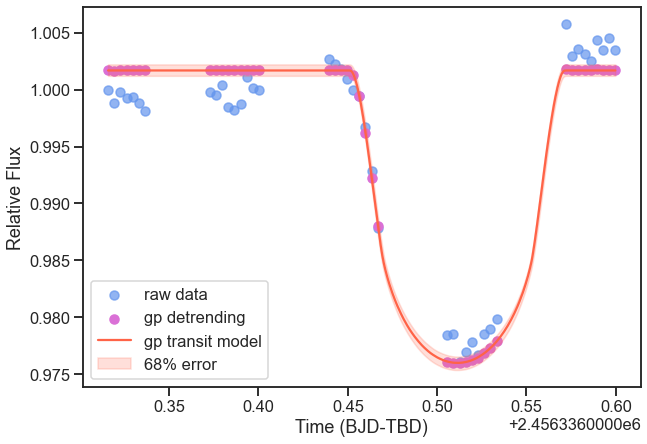

In [80]:
# let's plot the results of this fit 
plt.figure(figsize = (10,7))
t_final = np.linspace(times_start_430_2[0], times_start_430_2[-1], 1000)
# then the gp detrending
transit_plus_GP_model = gp_fit_2.lc.evaluate('STIS')
transit_model = gp_fit_2.lc.evaluate('STIS', evaluate_transit = True)
transit_model_resamp, error68_up, error68_down = gp_fit_2.lc.evaluate('STIS', evaluate_transit = True, t = t_final, return_err = True)

#gp_model = transit_plus_GP_model - transit_model

#transit_plus_GP_model = gp_fit.lc.evaluate('STIS', t = t_final, GPregressors = t_gp)
#transit_model = gp_fit.lc.model['STIS']['deterministic']
#gp_model = gp_fit.lc.model['STIS']['GP']
# there may be a small vertical offset between the two models because of the different normalizations - account for that
offset = 0
plt.scatter(times_start_430_2, (lc_430_2/lc_430_2[0]), color = "cornflowerblue", alpha = 0.7, label = "raw data")
plt.scatter(times_start_430_2, (lc_430_2/lc_430_2[0]) - (transit_plus_GP_model - transit_model) + offset,alpha=1, label = "gp detrending", color = "orchid")
#plt.plot(t_final, batman_model(t_final), color='black',zorder=10, label = "gp transit model (batman)")
plt.plot(t_final, transit_model_resamp + offset, color='tomato',zorder=10, label = "gp transit model")
plt.fill_between(t_final, error68_up, error68_down, color = "tomato", alpha = 0.2, label = "68% error")

plt.legend()
plt.ylabel("Relative Flux")
plt.xlabel("Time (BJD-TBD)")
plt.show()

In [33]:
gp_fit_750 = white_light_fit(params_750, times_start_750, lc_750, lc_err_750, norm_jit_750, sys_method = "gp", juliet_name = "wasp-39_750", gp_kernel = "Matern")


  analysing data from juliet_fits/wasp-39_750/jomnest_.txt


In [34]:
for i in gp_fit_750.posteriors['posterior_samples'].keys():
    print(i, np.median(gp_fit_750.posteriors['posterior_samples'][i]))

unnamed 0.7866592525782893
loglike 219.74565290398922
t0_p1 2459791.6176541187
p_p1 0.14350124900677774
rho 1698.4887165953787
mflux_STIS 0.0008264170583056119
sigma_w_STIS 48.56282400680818
GP_sigma_STIS 936.259602346412
GP_malpha0_STIS 0.7252451095298866
GP_malpha1_STIS 0.6441648973987152
GP_malpha2_STIS 0.4576655485553373
GP_malpha3_STIS 0.42875067298315367
GP_malpha4_STIS 0.9481598105495859
GP_malpha5_STIS 0.6087240846286844
GP_malpha6_STIS 0.8340279612729228
GP_malpha7_STIS 0.6082138846600488
GP_malpha8_STIS 0.5396920976838789


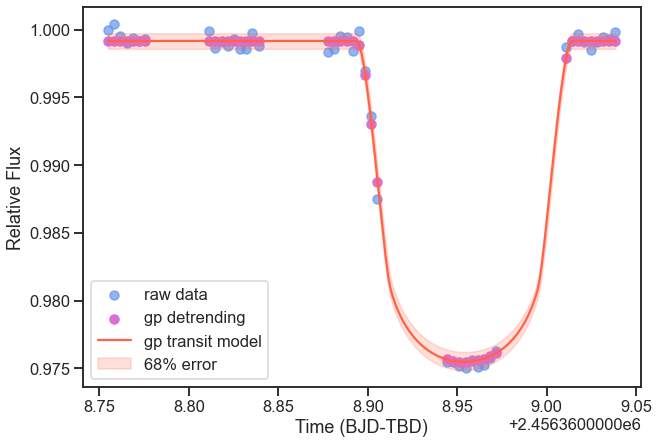

In [81]:
# let's plot the results of this fit 
plt.figure(figsize = (10,7))
t_final = np.linspace(times_start_750[0], times_start_750[-1], 1000)
# then the gp detrending
transit_plus_GP_model = gp_fit_750.lc.evaluate('STIS')
transit_model = gp_fit_750.lc.evaluate('STIS', evaluate_transit = True)
transit_model_resamp, error68_up, error68_down = gp_fit_750.lc.evaluate('STIS', evaluate_transit = True, t = t_final, return_err = True)

#gp_model = transit_plus_GP_model - transit_model

#transit_plus_GP_model = gp_fit.lc.evaluate('STIS', t = t_final, GPregressors = t_gp)
#transit_model = gp_fit.lc.model['STIS']['deterministic']
#gp_model = gp_fit.lc.model['STIS']['GP']
# there may be a small vertical offset between the two models because of the different normalizations - account for that
offset = 0
plt.scatter(times_start_750, (lc_750/lc_750[0]), color = "cornflowerblue", alpha = 0.7, label = "raw data")
plt.scatter(times_start_750, (lc_750/lc_750[0]) - (transit_plus_GP_model - transit_model) + offset,alpha=1, label = "gp detrending", color = "orchid")
#plt.plot(t_final, batman_model(t_final), color='black',zorder=10, label = "gp transit model (batman)")
plt.plot(t_final, transit_model_resamp + offset, color='tomato',zorder=10, label = "gp transit model")
plt.fill_between(t_final, error68_up, error68_down, color = "tomato", alpha = 0.2, label = "68% error")

plt.legend()
plt.ylabel("Relative Flux")
plt.xlabel("Time (BJD-TBD)")
plt.show()

<IPython.core.display.Javascript object>


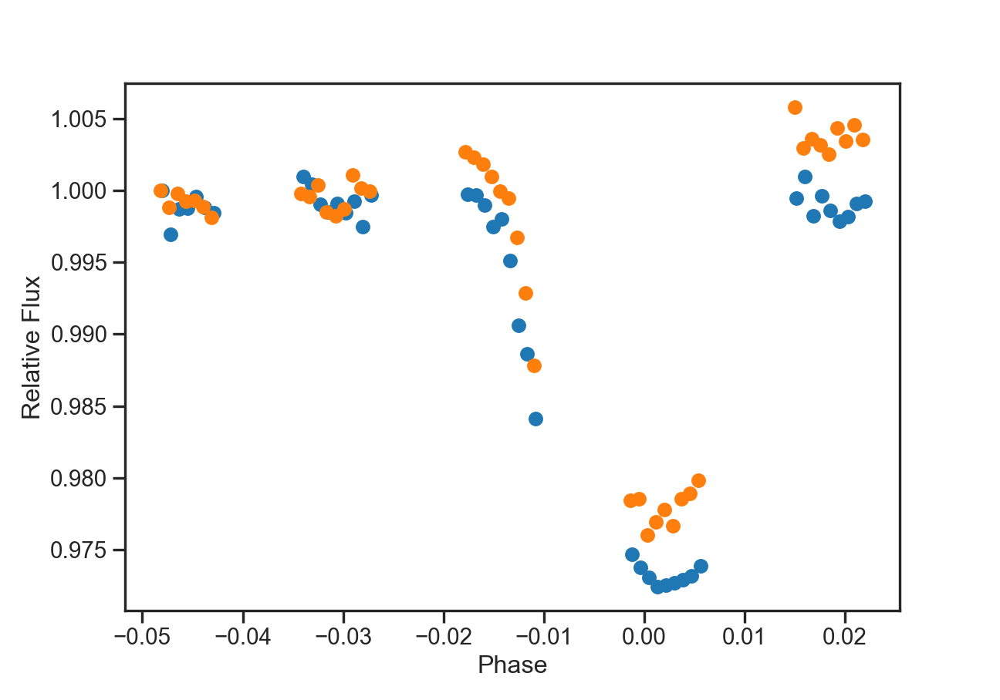

Text(0.5, 0, 'Phase')

In [54]:
phases = juliet.utils.get_phases(times_start_430, 4.0552889, 2459791.6174717625)
phases_2 = juliet.utils.get_phases(times_start_430_2, 4.0552889, 2459791.6174717625)

plt.figure(figsize = (10,7))
plt.scatter(phases, lc_430/lc_430[0])
plt.scatter(phases_2, lc_430_2/lc_430_2[0])
plt.ylabel("Relative Flux")
plt.xlabel("Phase")

In [35]:
# so now, instead, we fit multiple transits at the same time with the GP method
gp_fit_joint = joint_white_light_fit(params_430, times_start_430, lc_430, lc_err_430, norm_jit_430, times_start_430_2, lc_430_2, lc_err_430_2, norm_jit_430_2, sys_method = "gp", juliet_name = "wasp-39_joint", gp_kernel = "Matern", limb_darkening = "fixed")


  analysing data from juliet_fits/wasp-39_joint/jomnest_.txt


In [37]:
for i in gp_fit_joint.posteriors['posterior_samples'].keys():
    print(i, np.median(gp_fit_joint.posteriors['posterior_samples'][i]))

unnamed 0.6302939760786122
loglike 456.4359540398492
t0_p1 2459791.6178589016
p_p1 0.14500325500915023
rho 1697.9510323695035
mflux_STIS1 0.0010397087998492943
sigma_w_STIS1 73.43248268391602
GP_sigma_STIS1 457.86910160941693
mflux_STIS2 -0.0017023591564647835
sigma_w_STIS2 54.63935744455454
GP_sigma_STIS2 830.9465225166778
GP_malpha0_STIS1 0.7331384002434349
GP_malpha1_STIS1 0.7442399184462598
GP_malpha2_STIS1 0.8451460744499786
GP_malpha3_STIS1 0.5087138450459254
GP_malpha4_STIS1 0.5972704873673106
GP_malpha5_STIS1 0.6997054031841901
GP_malpha6_STIS1 0.9982692633624041
GP_malpha7_STIS1 0.6800182060506381
GP_malpha8_STIS1 0.6580626416908009
GP_malpha0_STIS2 0.30231958159474803
GP_malpha1_STIS2 0.44946022096819727
GP_malpha2_STIS2 0.4417010427275643
GP_malpha3_STIS2 0.5097510119357638
GP_malpha4_STIS2 0.4626134295015038
GP_malpha5_STIS2 0.4460440856676118
GP_malpha6_STIS2 0.4868632085259797
GP_malpha7_STIS2 0.34607139286121336
GP_malpha8_STIS2 0.29443405902130393


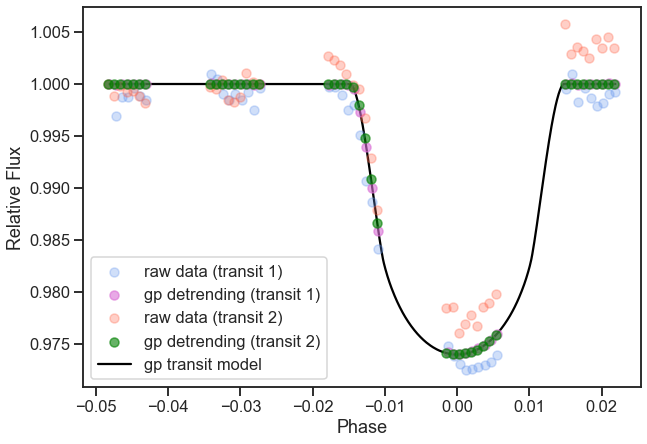

In [85]:
# then phased together

plt.figure(figsize = (10,7))

phases = juliet.utils.get_phases(times_start_430, 4.0552889, np.median(gp_fit_joint.posteriors['posterior_samples']["t0_p1"]))
phases_2 = juliet.utils.get_phases(times_start_430_2, 4.0552889, np.median(gp_fit_joint.posteriors['posterior_samples']["t0_p1"]))

transit_plus_GP_model1 = gp_fit_joint.lc.evaluate('STIS1')
transit_model1 = gp_fit_joint.lc.evaluate('STIS1', evaluate_transit = True)

gp_model1 = transit_plus_GP_model1 - transit_model1

transit_plus_GP_model2 = gp_fit_joint.lc.evaluate('STIS2')
transit_model2 = gp_fit_joint.lc.evaluate('STIS2', evaluate_transit = True)

gp_model2 = transit_plus_GP_model2 - transit_model2

offset1 = jitter_fit_lm[2][1][0] - transit_model1[0]

offset2 = jitter_fit_lm[2][1][0] - transit_model2[0]

t_final = np.linspace(times_start_430[0], times_start_430[-1], 1000)
transit_model2_resamp = gp_fit_joint.lc.evaluate('STIS2', evaluate_transit = True, t = t_final)
model_phases = juliet.utils.get_phases(t_final, 4.0552889, np.median(gp_fit_joint.posteriors['posterior_samples']["t0_p1"]))

offset3 = jitter_fit_lm[2][1][0] - transit_model2_resamp[0]
#q1 = [v for (k,v) in gp_fit_joint.posteriors['posterior_samples'].items() if 'q1' in k][0]
#q2 = [v for (k,v) in gp_fit_joint.posteriors['posterior_samples'].items() if 'q2' in k][0]
#b_model = batman_model_j_gp(t_final, np.median(gp_fit_joint.posteriors['posterior_samples']["t0_p1"]), np.median(gp_fit_joint.posteriors['posterior_samples']["p_p1"]))
#model_phases = juliet.utils.get_phases(t_final, 1.274925, np.median(gp_fit_joint.posteriors['posterior_samples']["t0_p1"]))

plt.scatter(phases, (lc_430/lc_430[0]),alpha=0.3, label = "raw data (transit 1)", color = "cornflowerblue",)
plt.scatter(phases, (lc_430/lc_430[0]) - (transit_plus_GP_model1 - transit_model1) + offset1,alpha=0.6, label = "gp detrending (transit 1)", color = "orchid")
#plt.plot(t_final, batman_model(t_final), color='black',zorder=10, label = "gp transit model (batman)")
#plt.plot(phases, transit_model1 + offset1, color='cornflowerblue',zorder=10, label = "gp transit model (transit 1)")

plt.scatter(phases_2, (lc_430_2/lc_430_2[0]),alpha=0.3, label = "raw data (transit 2)", color = "tomato",)
plt.scatter(phases_2, (lc_430_2/lc_430_2[0]) - (transit_plus_GP_model2 - transit_model2) + offset2,alpha=0.6, label = "gp detrending (transit 2)", color = "green")

#plt.plot(t_final, batman_model(t_final), color='black',zorder=10, label = "gp transit model (batman)")
#plt.plot(phases_2, transit_model2 + offset2, color='tomato',zorder=10, label = "gp transit model (transit 2)")
plt.plot(model_phases, transit_model2_resamp + offset3, color = "black", label = "gp transit model", zorder = 0)

plt.legend()
plt.ylabel("Relative Flux")
plt.xlabel("Phase")
plt.show()


In [45]:
# then, some spectroscopic light curve fits
bins_joint, rp_joint, rp_e_joint = joint_spectroscopic_lightcurve_fit(params_430, order_430["WAVELENGTH"],\
                                                                      times_start_430, spectra_430, norm_jit_430,\
                                                                      times_start_430_2, spectra_430_2, norm_jit_430_2,\
                                                                      "wasp-121_g430_bins", sld,\
                                                                      sys_method = "gp", juliet_name = "wasp-39_430_spec",\
                                                                      mode = 'HST_STIS_G430L', plot = True)

1.2876614429756887 -0.3336474679359257
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin001/posteriors.pkl
0.8383142852516487 0.03176442914400465
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin002/posteriors.pkl
0.9312290449840546 -0.10640989554333156
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin003/posteriors.pkl
0.8576671415475484 0.017401608107994578
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin004/posteriors.pkl
0.8538874217607398 0.0174166650086226
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin005/posteriors.pkl
0.872444687555364 -0.00011248232848998055
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_430_spec/wasp-39_430_spec_bin006/posterior

0.5240092089856642 0.23640324987434633
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin001/posteriors.pkl


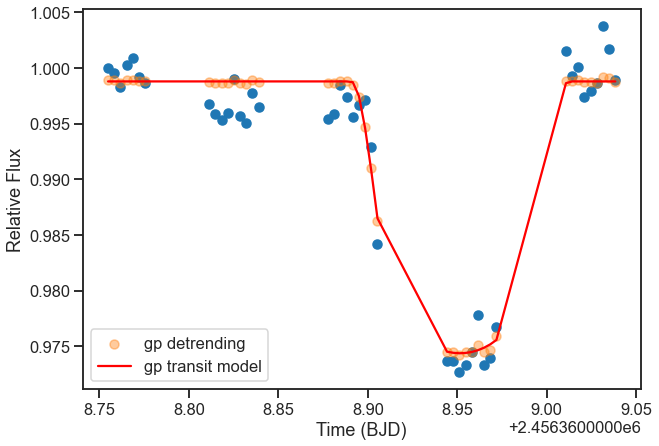

0.490758888796696 0.26302692501284536
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin002/posteriors.pkl


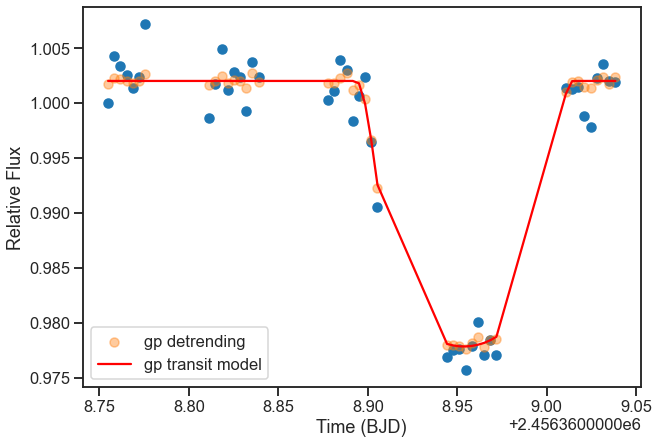

0.480573605772806 0.26567737956471765
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin003/posteriors.pkl


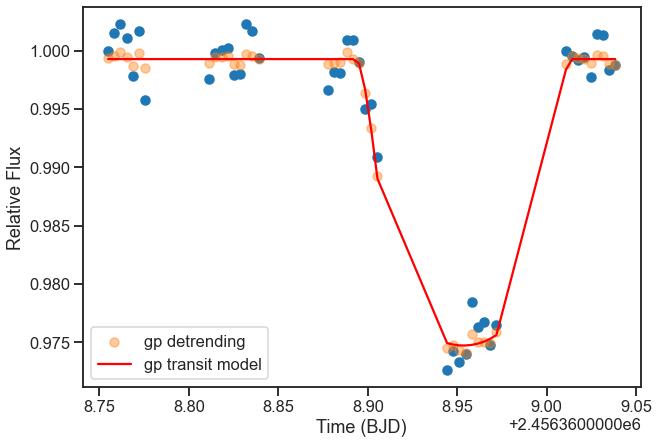

0.4662821028102962 0.27210706586795835
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin004/posteriors.pkl


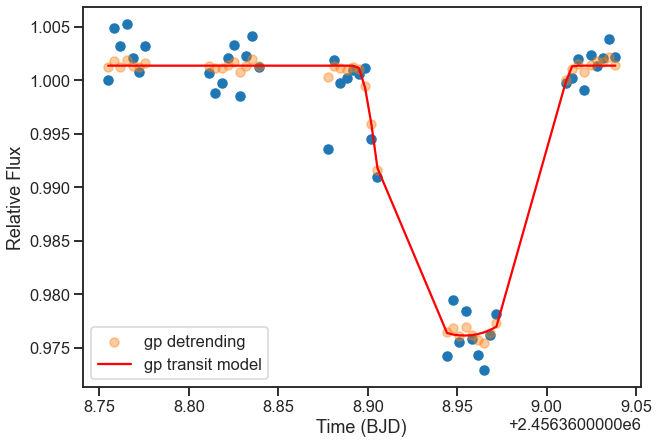

0.45080539956445614 0.280505918426501
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin005/posteriors.pkl


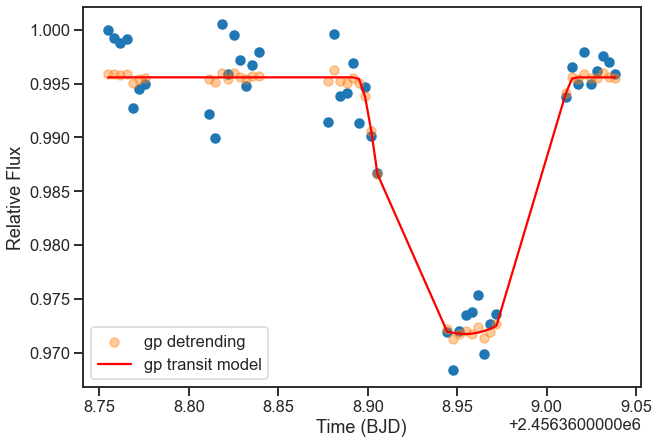

0.43427403264439307 0.2877732842313517
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin006/posteriors.pkl


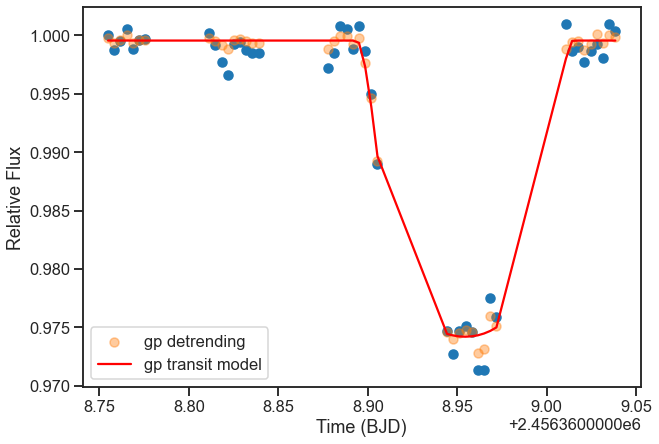

0.42192564475759187 0.2812867275487353
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin007/posteriors.pkl


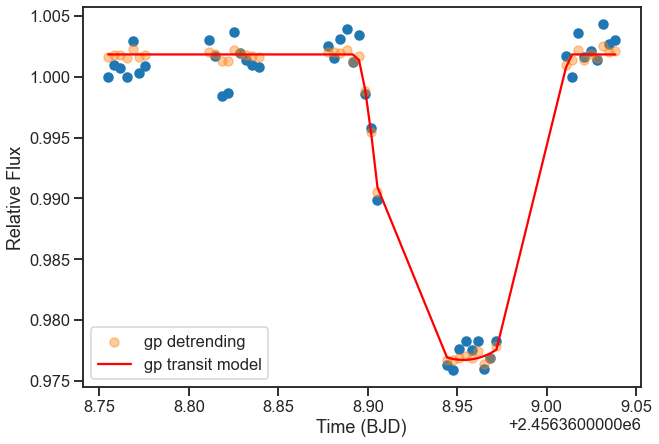

0.4129723211687988 0.2869731805163287
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin008/posteriors.pkl


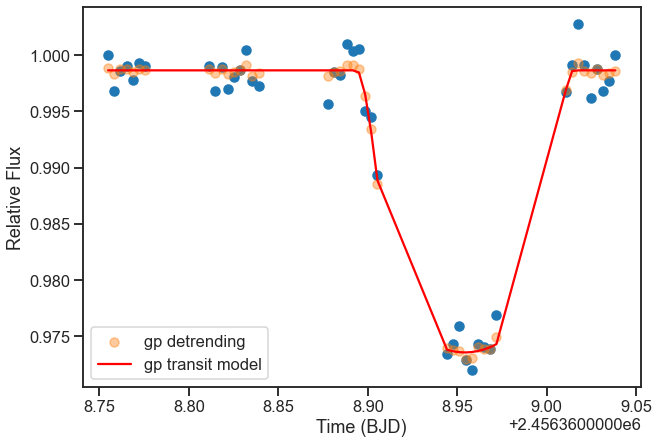

0.403115808525624 0.29150128770775535
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin009/posteriors.pkl


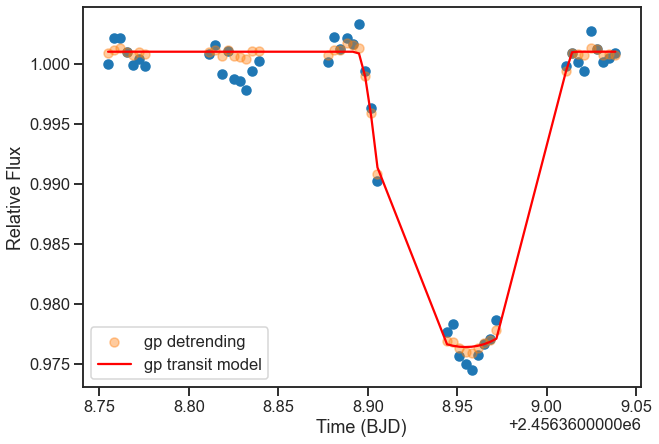

0.3906468187777984 0.2985884405187273
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin010/posteriors.pkl


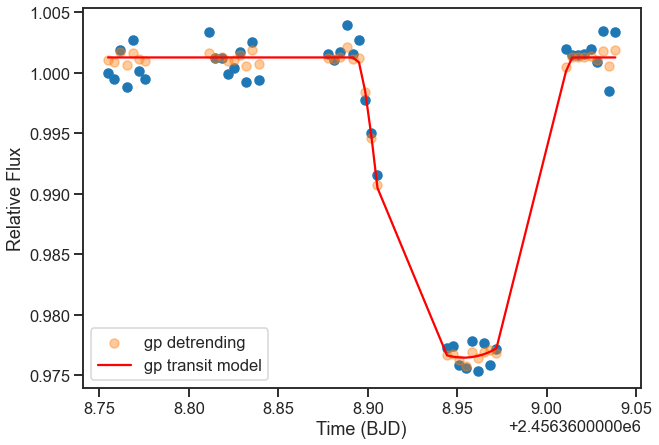

0.3667159464199781 0.31178101881093284
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin011/posteriors.pkl


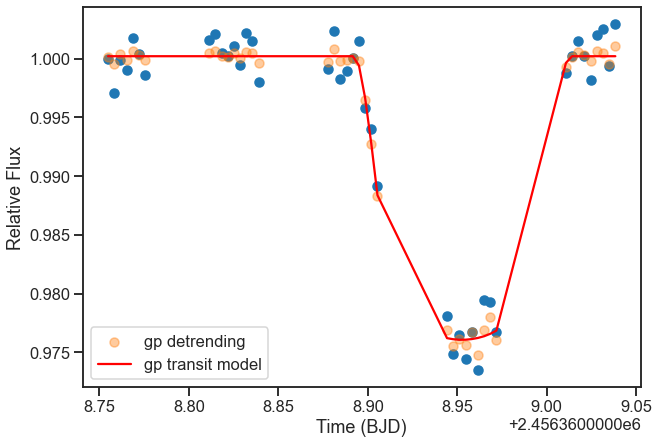

0.3644781602705375 0.30944139116838193
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin012/posteriors.pkl


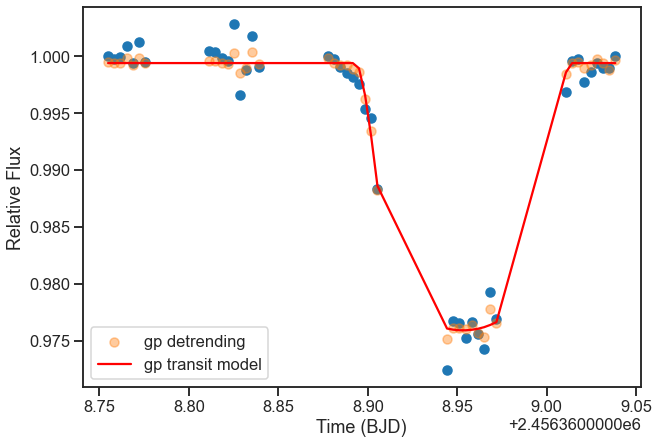

0.3727981334036898 0.3014300781096777
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin013/posteriors.pkl


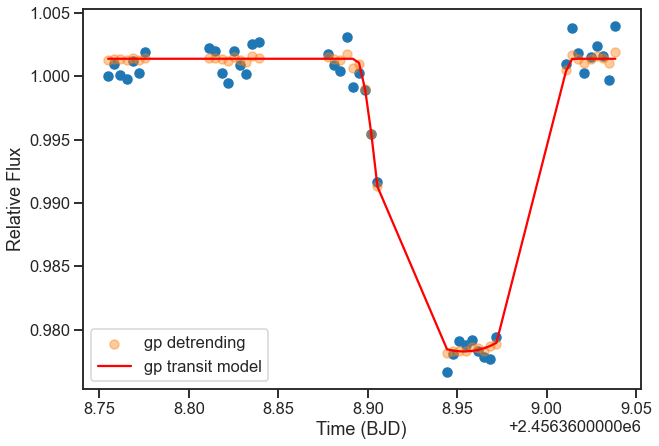

0.3701642638178969 0.29909845281029407
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin014/posteriors.pkl


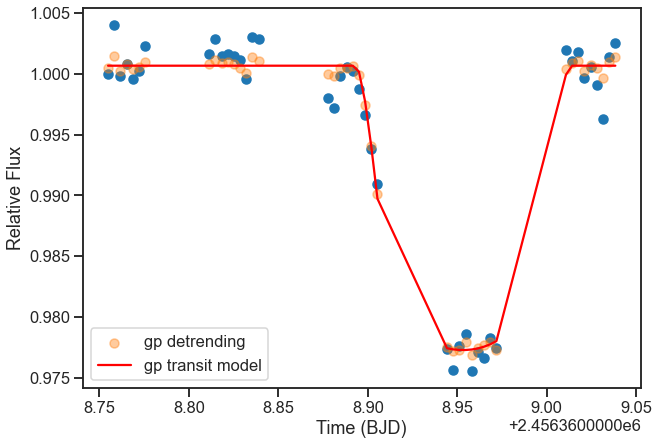

0.3606186922798465 0.3029717789988668
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin015/posteriors.pkl


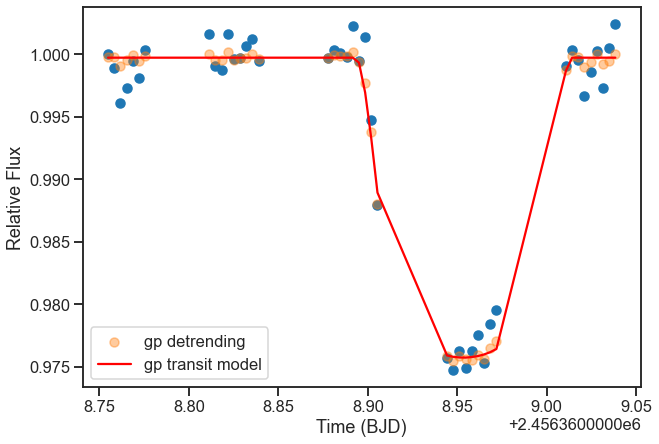

0.35703041908290417 0.2984704708800262
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin016/posteriors.pkl


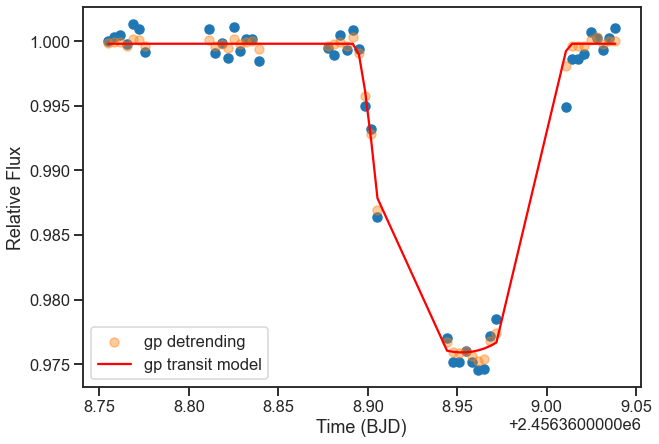

0.35064898560963154 0.2953422624860814
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin017/posteriors.pkl


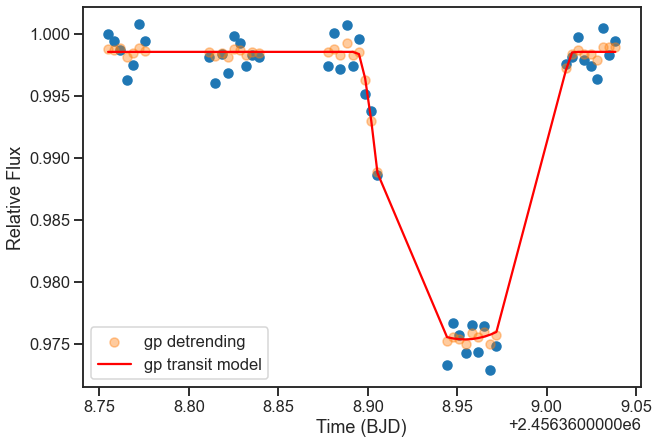

0.3402497473620668 0.30598636263653406
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin018/posteriors.pkl


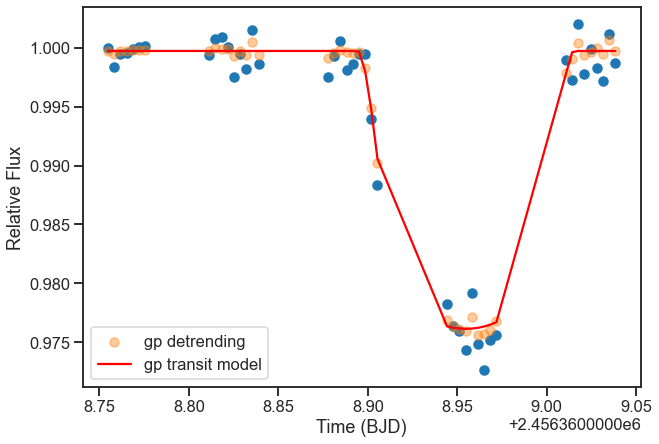

0.3349933757006641 0.30259279994104704
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin019/posteriors.pkl


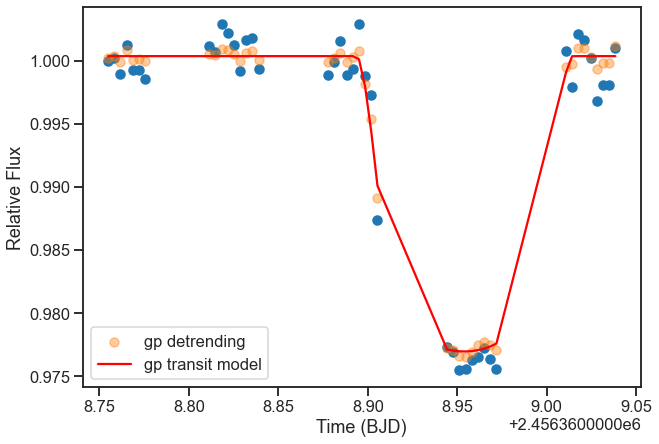

0.3234432353354691 0.29791150485240714
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin020/posteriors.pkl


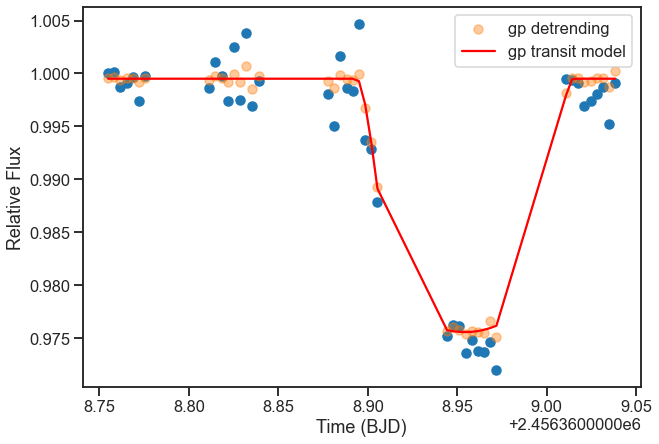

0.3164827289480579 0.3038507275232554
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin021/posteriors.pkl


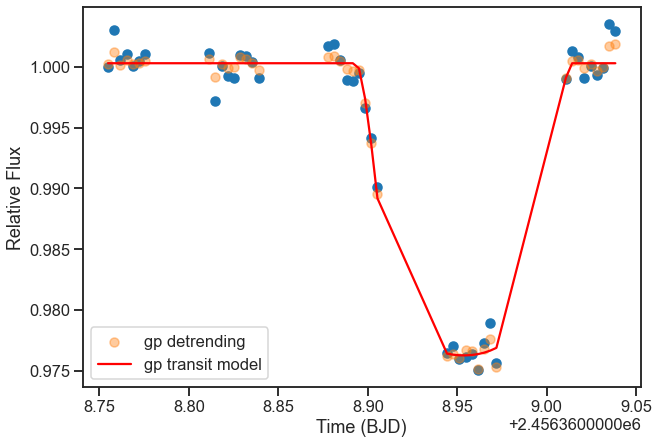

0.31243201410303123 0.3038716378693245
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin022/posteriors.pkl


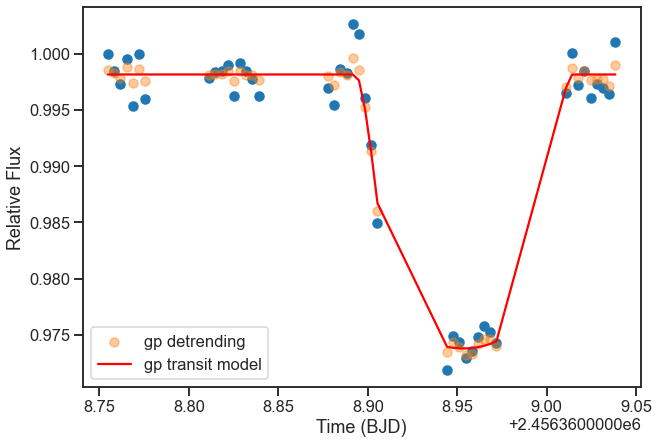

0.3047181722040922 0.30705148838536683
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin023/posteriors.pkl


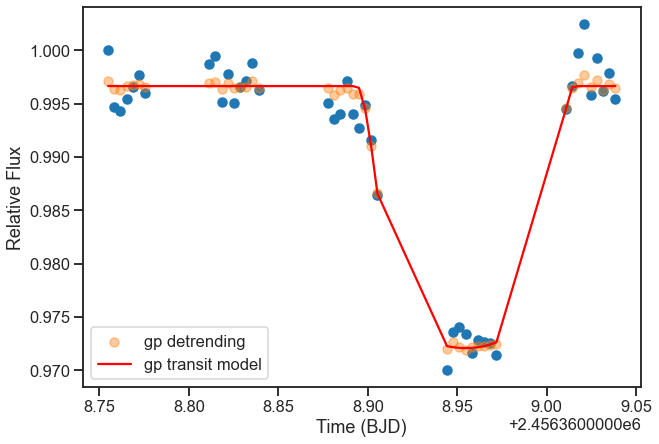

0.30150608247303995 0.3059446833880353
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin024/posteriors.pkl


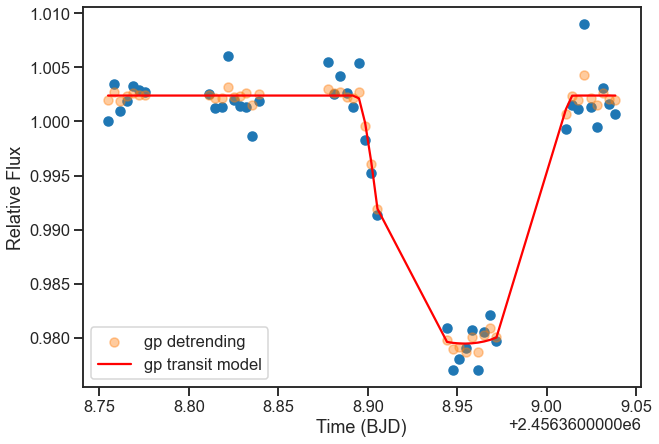

0.2954926826382067 0.30385273682282626
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin025/posteriors.pkl


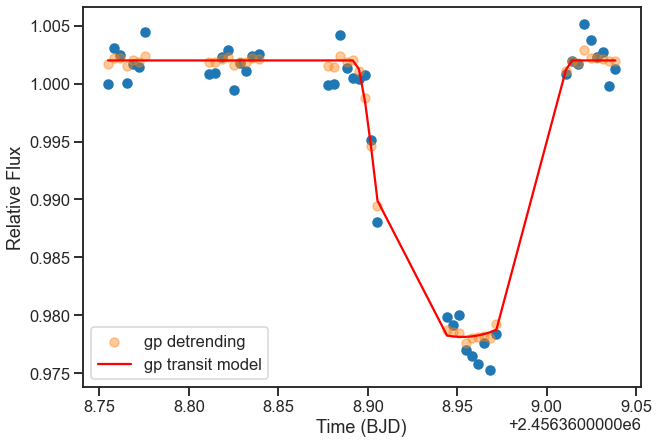

0.2955488086565781 0.3059243463761855
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin026/posteriors.pkl


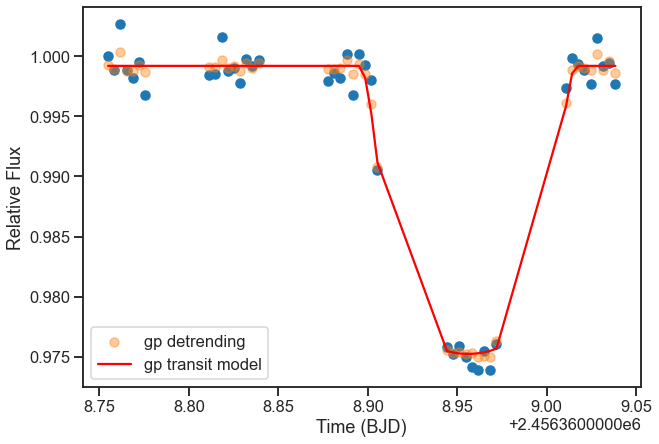

0.27832619896666877 0.30351589859058425
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin027/posteriors.pkl


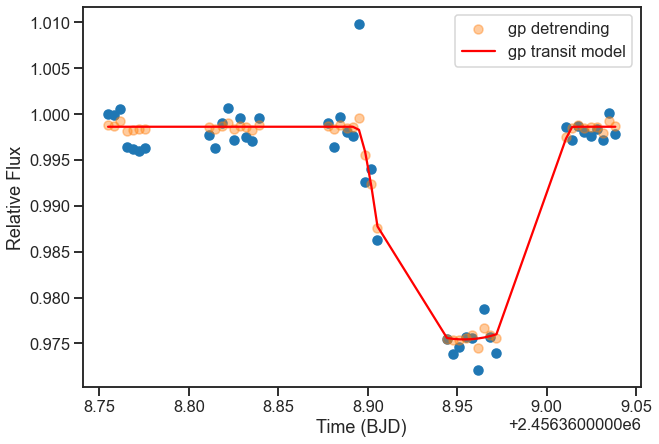

0.2808808320547053 0.29975729885805324
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin028/posteriors.pkl


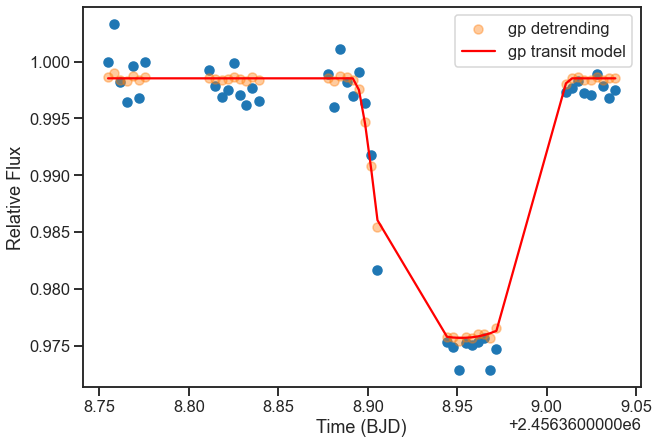

0.23572074593000802 0.3079497108147652
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin029/posteriors.pkl


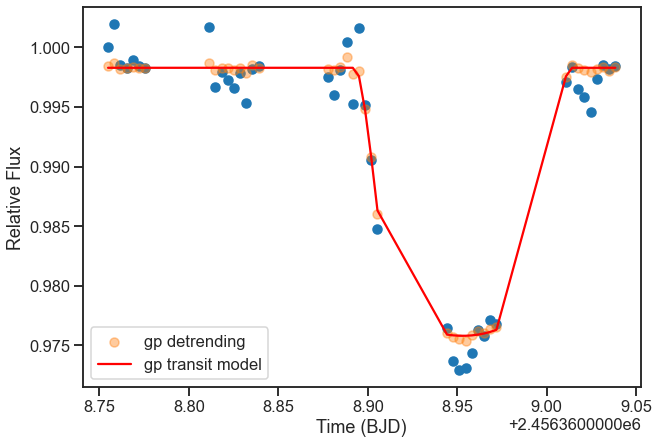

0.2429555608740668 0.30333651668186523
Detected multinest sampler output files --- extracting from juliet_fits/wasp-39_750_spec/wasp-39_750_spec_bin030/posteriors.pkl


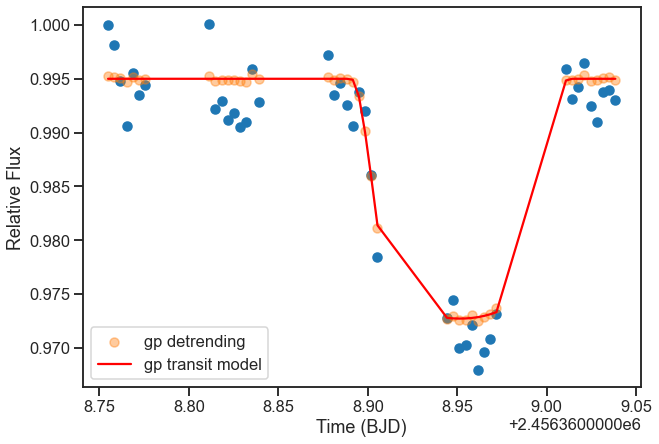

In [46]:
bins_750, rp_750, rp_e_750 = spectroscopic_lightcurve_fit(params_750, order_750["WAVELENGTH"], times_start_750, spectra_750, norm_jit_750,\
                                                       "wasp-121_g750_bins", sld, juliet_name = "wasp-39_750_spec", mode = 'HST_STIS_G750L', plot = True)

In [86]:
wakeford = np.genfromtxt("/Users/natalieallen/Downloads/WASP-39b_Wakeford_2018_AJ.csv", delimiter = ",")

(3000.0, 10000.0)

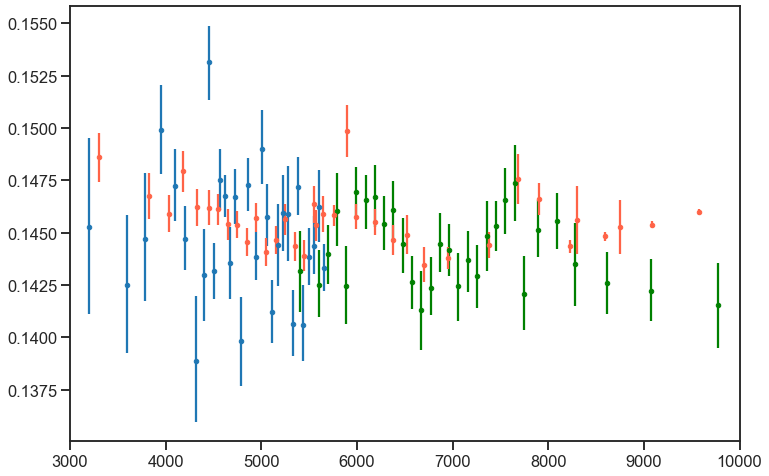

In [89]:
# this is using the bins from wasp-121, which clearly don't align with the wakeford bins we're comparing to 
%matplotlib inline
plt.figure(figsize = (12,8))
#plt.errorbar(bins_2, rp_2, yerr = np.array(rp_e_2).T, fmt = ".")
#plt.errorbar(bins_rg, rp_rg, yerr = np.array(rp_e_rg).T, fmt = ".")
plt.errorbar(bins_joint, rp_joint, yerr = np.array(rp_e_joint).T, fmt = ".")
plt.errorbar(bins_750, rp_750, yerr = np.array(rp_e_750).T, fmt = ".", color = "green")
plt.errorbar(wakeford[:,0]*10000, wakeford[:,2], yerr = wakeford[:,3], fmt = ".", color = "tomato")

#plt.errorbar(bins_7, rp_7, yerr = np.array(rp_e_7).T, fmt = ".")
plt.xlim(3000,10000)

In [91]:
# spectroscopic light curve fits with wakeford bins
bins_joint_w, rp_joint_w, rp_e_joint_w = joint_spectroscopic_lightcurve_fit(params_430, order_430["WAVELENGTH"],\
                                                                      times_start_430, spectra_430, norm_jit_430,\
                                                                      times_start_430_2, spectra_430_2, norm_jit_430_2,\
                                                                      "wasp-39_g430_bins.txt", sld,\
                                                                      sys_method = "gp", juliet_name = "wasp-39_430_spec_wbins",\
                                                                      mode = 'HST_STIS_G430L', plot = True)

0.8382891668276602 0.031784855602158754
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin001/jomnest_.txt
0.8667211286214112 -0.02105307437924823
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin002/jomnest_.txt
0.8580429843388189 0.017309256916670037
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin003/jomnest_.txt
0.8412753321792602 0.03253840192886455
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin004/jomnest_.txt
0.7983747325819317 0.04783287238082232
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin005/jomnest_.txt
0.7732541219676592 0.058498734046518876
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin006/jomnest_.txt
0.680749482749712 0.16985814147012254
  analysing data from juliet_fits/wasp-39_430_spec_wbins/wasp-39_430_spec_wbins_bin007/jomnest_.txt
0.6578749733910616 0.178

0.5239483473343258 0.23607650064909802
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin001/jomnest_.txt


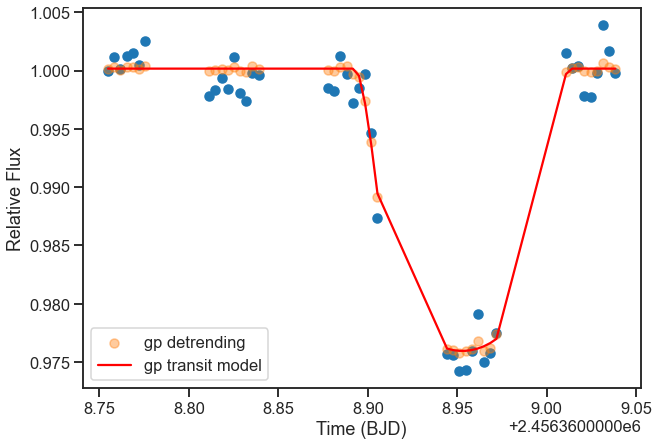

0.4805654948068096 0.2656828112634371
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin002/jomnest_.txt


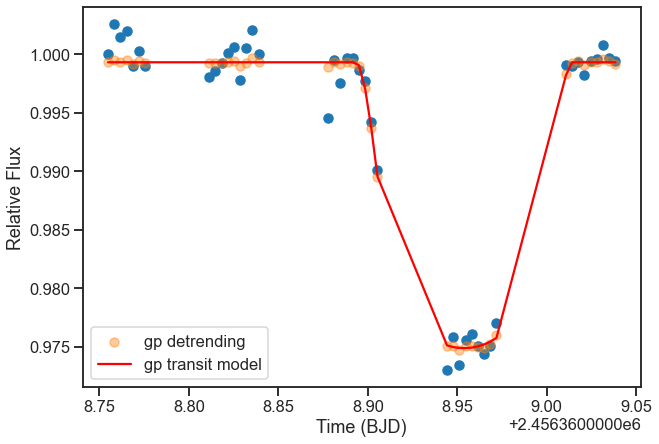

0.44764433496563594 0.2704259383946098
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin003/jomnest_.txt


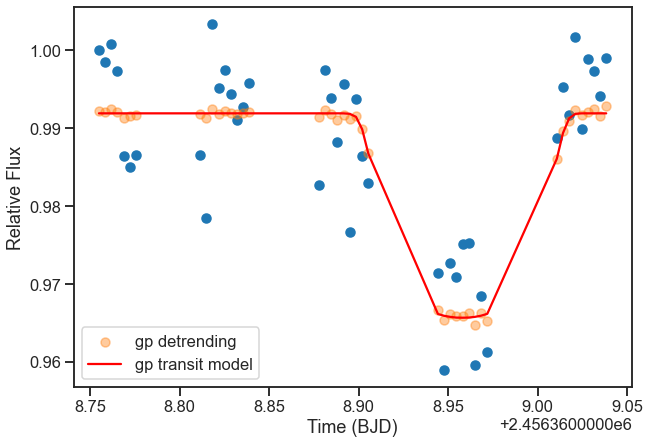

0.43651727718854505 0.28667610094906176
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin004/jomnest_.txt


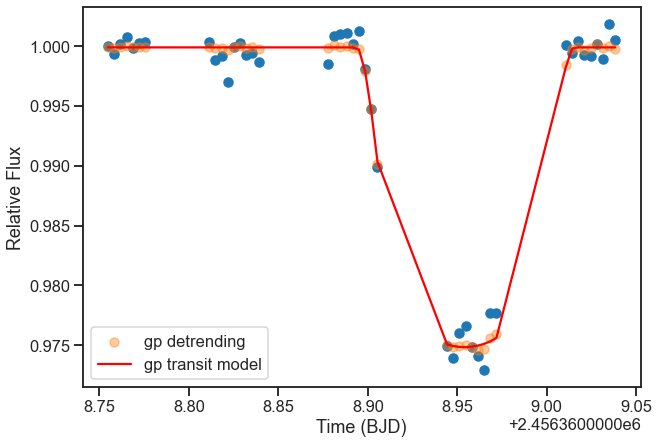

0.40449812360375054 0.295801344380147
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin005/jomnest_.txt


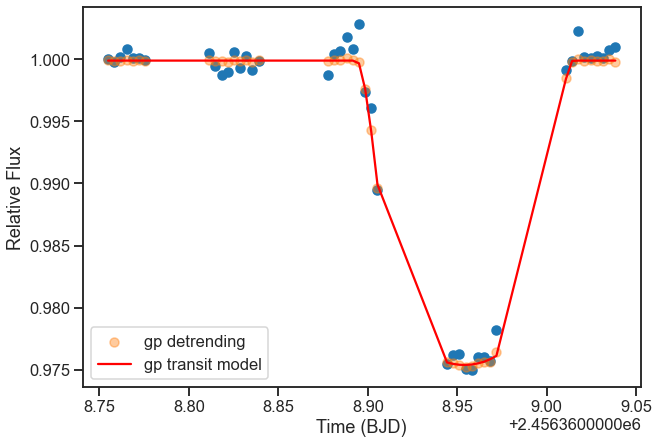

0.3864272707549942 0.29612676369662694
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin006/jomnest_.txt


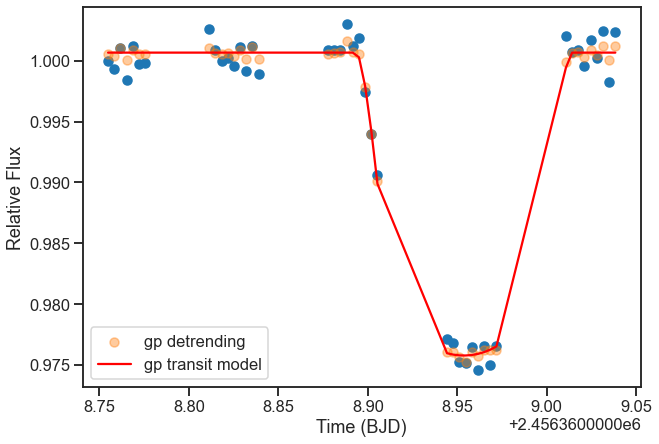

0.3866225558461021 0.300843689450699
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin007/jomnest_.txt


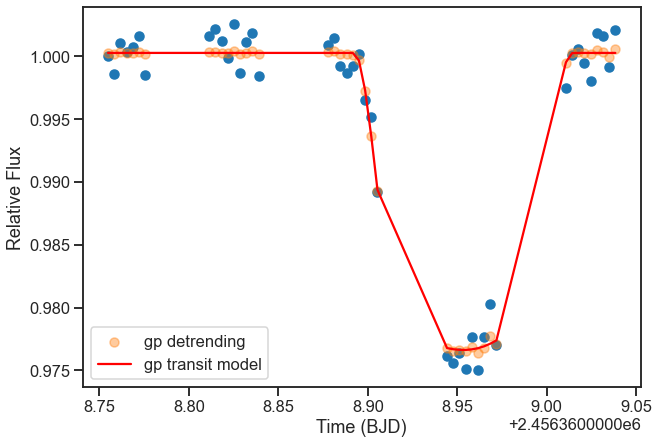

0.3728885302090312 0.3012655682414534
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin008/jomnest_.txt


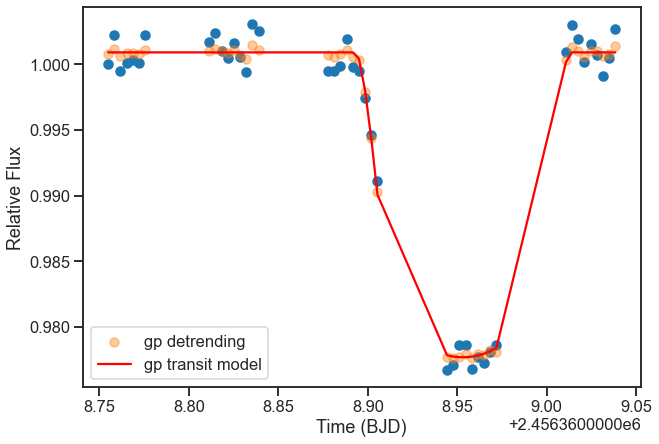

0.3623672764919439 0.29972518146540306
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin009/jomnest_.txt


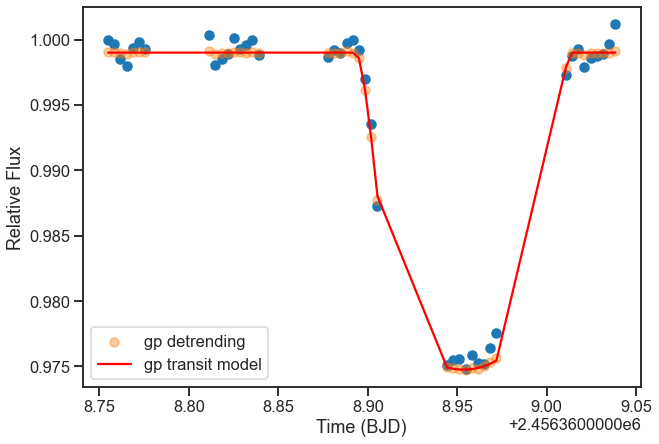

0.3066131773439267 0.3060121873473247
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin010/jomnest_.txt


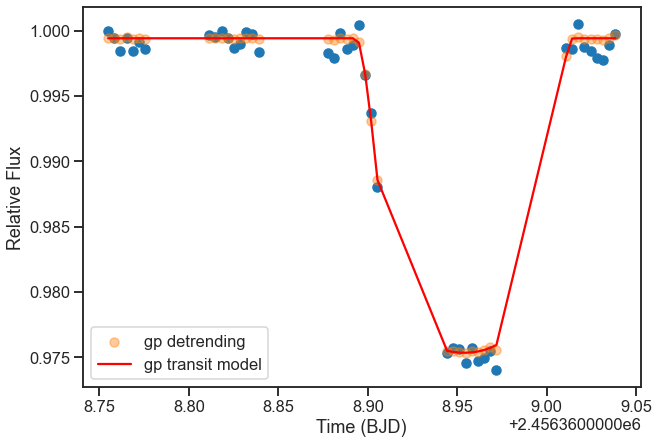

0.30151727299883246 0.30631539620853476
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin011/jomnest_.txt


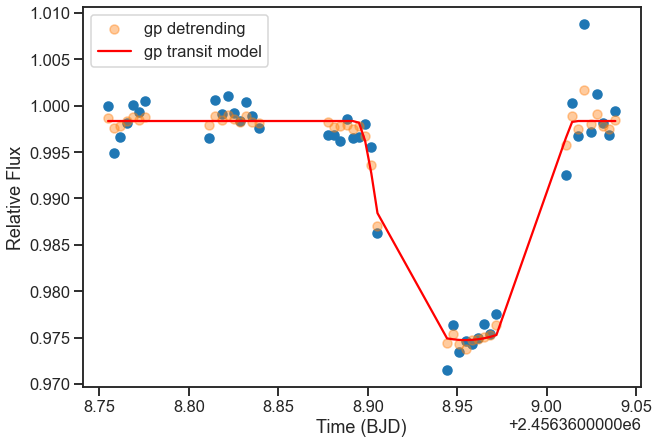

0.2953849590430457 0.3038821448378439
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin012/jomnest_.txt


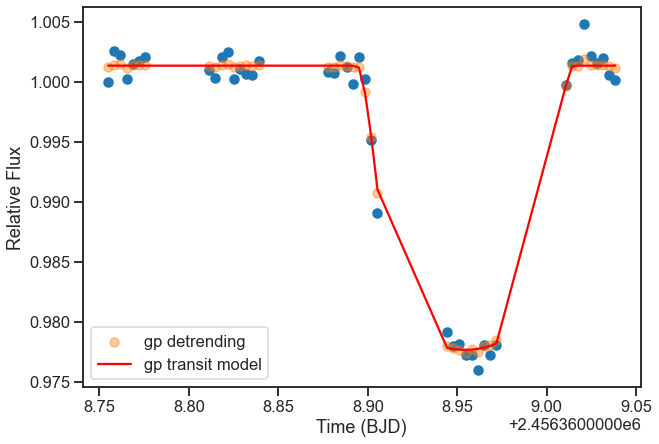

0.2913577381742241 0.3039742283879947
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin013/jomnest_.txt


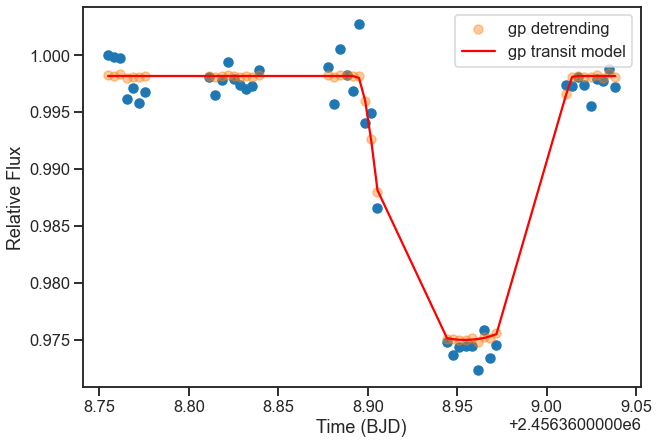

0.2507132138673876 0.30483619782146826
  analysing data from juliet_fits/wasp-39_750_spec_wbins/wasp-39_750_spec_wbins_bin014/jomnest_.txt


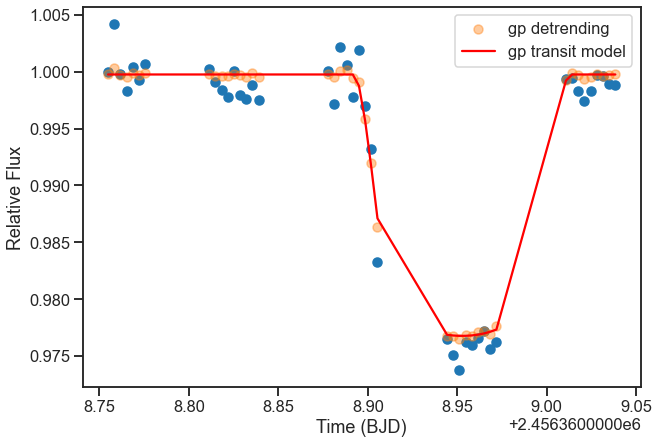

In [92]:
bins_750_w, rp_750_w, rp_e_750_w = spectroscopic_lightcurve_fit(params_750, order_750["WAVELENGTH"], times_start_750, spectra_750, norm_jit_750,\
                                                       "wasp-39_g750_bins", sld, juliet_name = "wasp-39_750_spec_wbins", mode = 'HST_STIS_G750L', plot = True)

(3000.0, 10000.0)

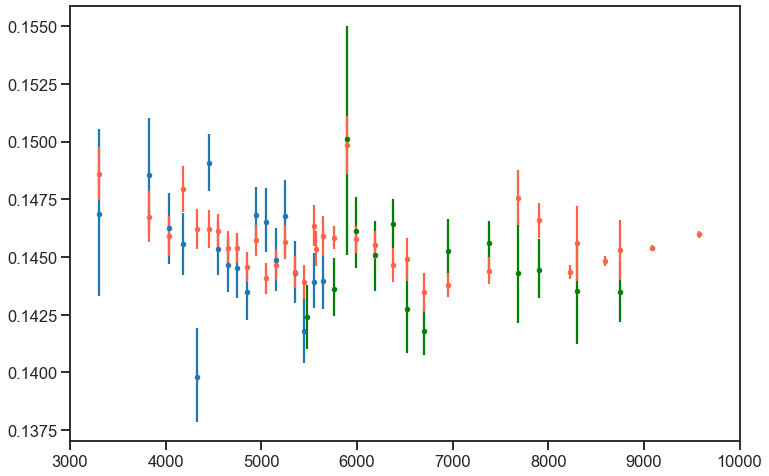

In [93]:
# pretty close for the most part actually
# a few wonky points that i'll look into more later
# ignore the tiny error bar points, those are g102 data
plt.figure(figsize = (12,8))
#plt.errorbar(bins_2, rp_2, yerr = np.array(rp_e_2).T, fmt = ".")
#plt.errorbar(bins_rg, rp_rg, yerr = np.array(rp_e_rg).T, fmt = ".")
plt.errorbar(bins_joint_w, rp_joint_w, yerr = np.array(rp_e_joint_w).T, fmt = ".")
plt.errorbar(bins_750_w, rp_750_w, yerr = np.array(rp_e_750_w).T, fmt = ".", color = "green")
plt.errorbar(wakeford[:,0]*10000, wakeford[:,2], yerr = wakeford[:,3], fmt = ".", color = "tomato")
plt.xlim(3000,10000)